####  Importing the libraries

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import style
from tensorflow.keras.models import Sequential #Build the model layer by layer
from tensorflow.keras.layers import Dense 
from tensorflow.keras.layers import LSTM
import tensorflow as tf
from sklearn.preprocessing import MinMaxScaler
import math
from sklearn.metrics import mean_squared_error
style.use("fivethirtyeight")

# 1. Importing dataset

In [2]:
JNJ_full_ds=pd.read_csv('dataset/JNJ.csv')

### 1.1 Remove rows with outliers

In [3]:
open0jnj = JNJ_full_ds[JNJ_full_ds['Open'] == 0]
print(open0jnj)

#Remove rows with outliers
JNJ_full_ds = JNJ_full_ds.loc[JNJ_full_ds['Date'] > '1969-12-31']

            Date  Open      High       Low     Close   Volume  Dividends  \
0     1962-01-02   0.0  0.067334  0.066985  0.067334        0        0.0   
1     1962-01-03   0.0  0.066636  0.066287  0.066287   345600        0.0   
2     1962-01-04   0.0  0.066636  0.065589  0.065589   216000        0.0   
3     1962-01-05   0.0  0.065066  0.064543  0.064543   129600        0.0   
4     1962-01-08   0.0  0.064019  0.063496  0.063496   172800        0.0   
...          ...   ...       ...       ...       ...      ...        ...   
1982  1969-12-24   0.0  0.384985  0.374794  0.384985  1080000        0.0   
1983  1969-12-26   0.0  0.396308  0.390080  0.392911   792000        0.0   
1984  1969-12-29   0.0  0.400837  0.395176  0.396308  1454400        0.0   
1985  1969-12-30   0.0  0.403101  0.399138  0.403101   864000        0.0   
1986  1969-12-31   0.0  0.409895  0.403667  0.407631  1411200        0.0   

      Stock Splits  
0              0.0  
1              0.0  
2              0.0  
3  

### 1.2 Create Average column

In [5]:
average=(JNJ_full_ds['Open']+JNJ_full_ds['High']+JNJ_full_ds['Low']+JNJ_full_ds['Close'])/4
y=average.values
JNJ_full_ds.insert(8, "Average", average, True)

### 1.3 Drop OHLC column

In [6]:
#Drop columns - Date,Volume,Dividends,Stock Splits 
df=JNJ_full_ds.drop(['Open', 'High', 'Low', 'Close','Dividends','Stock Splits','Volume'], axis=1)
JNJ_full_ds=df

In [7]:
df

,Date,Average
1987,1970-01-02,0.402818
1988,1970-01-05,0.392769
1989,1970-01-06,0.391071
1990,1970-01-07,0.394326
1991,1970-01-08,0.395742
...,...,...
15231,2022-07-06,178.305004
15232,2022-07-07,178.247498
15233,2022-07-08,178.592503
15234,2022-07-11,178.147503


In [8]:
#Pick up only 'Average' column
JNJ_full_ds=df.reset_index()['Average'] 

### 1.4 Dateset Size

In [9]:
JNJ_full_ds.shape 

(13249,)

# 2. Data Preprocessing

To build a (LSTM) model, we need to separate our stock prices data into a training set and a test set. Besides, we will also normalize our data so that all the values are in the same scale.

### 2.1 MinMaxScaler 

Use the Scikit-Learn MinMaxScaler to normalize all our stock data ranging from 0 to 1. We also reshape our normalized data into a two-dimensional array.

In [10]:
#LSTM are sensitive to the scale of the data , we use MinMaxScaler to scale the data range to 0 and 1
scaler=MinMaxScaler(feature_range=(0,1))
JNJ_full_ds=scaler.fit_transform(np.array(JNJ_full_ds).reshape(-1,1)) #Fit to data, then transform it

#### Exclude 30 days data 

In [11]:
JNJ_full_ds1_Future=JNJ_full_ds[-30:]
JNJ_full_ds=JNJ_full_ds[:-30] #Exclude 30 days

In [12]:
#df1 have already converted to array and have the values between 0 to 1
JNJ_full_ds

array([[7.69459307e-04],
       [7.14752603e-04],
       [7.05507376e-04],
       ...,
       [9.80521746e-01],
       [9.79528203e-01],
       [9.78575531e-01]])

In [13]:
len(JNJ_full_ds)

13219

### 2.2 Preparation of Training and Testing set

- We cannot use Cross Validation or Random Seed to split train and test because stock price always depent on previous date.
- Here we will only need the average prices from our dataset to train our (LSTM) model. We are going to extract 80% of the average prices from our acquired stock data as our training set.

In [14]:
training_size=int(len(JNJ_full_ds)*0.8) #Split train into 80%
test_size=len(JNJ_full_ds)-training_size 
train_data,test_data=JNJ_full_ds[0:training_size,:],JNJ_full_ds[training_size:len(JNJ_full_ds),:1]

#### Training and Testing size 

In [15]:
training_size,test_size

(10575, 2644)

In [16]:
#Convert an array of values into a dataset matrix
def create_dataset(dataset,time_step=1): #timestep default is 1,more better timestep
    dataX,dataY=[],[]
    for i in range(len(dataset)-time_step-1):
        a=dataset[i:(i+time_step),0] #i=0 to 99(X_train) 100..(y_train)
        print(len(a))
        dataX.append(a)
        dataY.append(dataset[i+time_step,0])
        print(f'({i})')
        print(f'DataX \n----------------\n {a}\n')
        print(f'DataY \n----------------\n {dataset[i+time_step,0]}\n')
        print('========================================================')
    return np.array(dataX),np.array(dataY) #Return as array

In [17]:
#Reshape into X=t,t+1,t+2..t+99 and Y=t+100
#Converting independent and dependent feature based on time steps
time_step=100 #Predict based on 100 days
X_train,y_train=create_dataset(train_data,time_step)
X_test,ytest=create_dataset(test_data,time_step)

100
(0)
DataX 
----------------
 [7.69459307e-04 7.14752603e-04 7.05507376e-04 7.23227746e-04
 7.30934086e-04 7.54047931e-04 7.27849641e-04 7.26311305e-04
 7.44804555e-04 7.60216045e-04 7.58673682e-04 7.42491971e-04
 7.21687049e-04 7.34014823e-04 7.40178817e-04 7.40951274e-04
 7.30934615e-04 7.17061961e-04 6.41551791e-04 5.50626655e-04
 5.15184069e-04 5.84531868e-04 6.38468167e-04 5.49088792e-04
 5.64496885e-04 5.89154648e-04 6.59273777e-04 7.17063714e-04
 7.00882441e-04 6.55035734e-04 5.86842222e-04 5.77450592e-04
 5.49273112e-04 5.46570524e-04 5.41552291e-04 5.12989190e-04
 4.76708413e-04 4.90218663e-04 4.94849670e-04 5.26114488e-04
 5.43870188e-04 5.21867572e-04 5.44254408e-04 5.48115713e-04
 5.31132364e-04 5.07200524e-04 4.89831338e-04 4.99480930e-04
 5.12605541e-04 4.97164886e-04 4.74779658e-04 4.57022388e-04
 4.61655856e-04 4.77864993e-04 4.72461147e-04 4.64743941e-04
 4.48918266e-04 4.94079028e-04 5.11062522e-04 5.06431679e-04
 4.84813581e-04 4.73620030e-04 4.48919484e-04 4.4467


DataY 
----------------
 0.00018859440043529825

100
(59)
DataX 
----------------
 [5.06431679e-04 4.84813581e-04 4.73620030e-04 4.48919484e-04
 4.44672203e-04 4.24601523e-04 3.69791673e-04 3.42773079e-04
 3.63617086e-04 3.87161471e-04 3.70562855e-04 3.75967884e-04
 4.04530030e-04 3.94108931e-04 3.83301732e-04 3.79827919e-04
 3.77124764e-04 3.61686137e-04 3.29648772e-04 3.00315330e-04
 2.85647809e-04 2.74068986e-04 2.91823287e-04 3.42772602e-04
 3.37369106e-04 2.94910768e-04 2.65578283e-04 2.73297828e-04
 3.04174267e-04 2.99543775e-04 2.53998690e-04 2.57085206e-04
 2.46663348e-04 2.31996383e-04 2.74839519e-04 3.50493615e-04
 2.83332035e-04 2.25435036e-04 1.61748738e-04 1.45015249e-04
 8.46893203e-05 0.00000000e+00 3.82839385e-05 8.23684474e-05
 1.40376333e-04 2.16945121e-04 2.35505959e-04 2.59869063e-04
 3.05112173e-04 2.61029949e-04 2.40145810e-04 2.43628156e-04
 2.52909117e-04 2.56387760e-04 2.72629408e-04 2.88870846e-04
 3.84002394e-04 4.07204748e-04 4.09524922e-04 4.21126284e-04
 


DataY 
----------------
 0.000758107523604839

100
(118)
DataX 
----------------
 [0.00042113 0.000384   0.00035152 0.00031323 0.00031904 0.00029003
 0.00027959 0.00030627 0.00030395 0.00030163 0.00030859 0.00028423
 0.00027495 0.000326   0.00034572 0.00036312 0.00033992 0.00035616
 0.00035964 0.00039096 0.00042693 0.00043041 0.00042229 0.00041416
 0.00038864 0.00035152 0.0003608  0.00040604 0.00041184 0.00041068
 0.00038052 0.00035848 0.00035036 0.00034572 0.00034224 0.00029583
 0.00026103 0.00026683 0.00023319 0.00019374 0.00018859 0.00026298
 0.0002653  0.00026298 0.00031296 0.00039432 0.00040129 0.00039664
 0.00037804 0.00038037 0.00039432 0.00040129 0.00038967 0.00041872
 0.0004687  0.00050125 0.00055471 0.0005303  0.00052914 0.00051984
 0.00048032 0.00048265 0.00051635 0.00053379 0.00052333 0.00047451
 0.00049427 0.00051287 0.00055471 0.00053146 0.00051171 0.00054076
 0.00054193 0.00055703 0.00059423 0.00064072 0.00063839 0.0006105
 0.00054425 0.00051171 0.0005396  0.00058958 0.


DataY 
----------------
 0.0011557475103380944

100
(185)
DataX 
----------------
 [0.00051287 0.00055471 0.00053146 0.00051171 0.00054076 0.00054193
 0.00055703 0.00059423 0.00064072 0.00063839 0.0006105  0.00054425
 0.00051171 0.0005396  0.00058958 0.00059423 0.00057214 0.00052914
 0.00058028 0.00061282 0.00060352 0.00062096 0.00064072 0.00064769
 0.00062328 0.00063839 0.00067094 0.00067791 0.00068721 0.0007151
 0.0007523  0.00076741 0.00075811 0.00074532 0.00074532 0.00071278
 0.00069767 0.00067971 0.00068204 0.00066458 0.0006669  0.00067272
 0.00067389 0.0006832  0.00069949 0.00073907 0.00077166 0.00075303
 0.00075071 0.0007379  0.00070415 0.00068553 0.0006669  0.00068436
 0.00068436 0.00064246 0.00061802 0.00064363 0.00071812 0.00073441
 0.00071928 0.00071928 0.00068785 0.00068786 0.00071812 0.00072393
 0.00073325 0.00072044 0.00069717 0.00070531 0.00072394 0.00075769
 0.00082054 0.00088572 0.0009346  0.00096952 0.00099512 0.00101608
 0.00100793 0.00090434 0.00086593 0.00092762 0

DataY 
----------------
 0.0018988984227891056

100
(245)
DataX 
----------------
 [0.00071928 0.00071928 0.00068785 0.00068786 0.00071812 0.00072393
 0.00073325 0.00072044 0.00069717 0.00070531 0.00072394 0.00075769
 0.00082054 0.00088572 0.0009346  0.00096952 0.00099512 0.00101608
 0.00100793 0.00090434 0.00086593 0.00092762 0.00092878 0.00091482
 0.0009218  0.00096254 0.00095905 0.00095788 0.00096254 0.00097883
 0.00100211 0.0010475  0.0010766  0.00107544 0.00108824 0.00109639
 0.00115342 0.00119299 0.00116389 0.00115575 0.00114411 0.00115807
 0.00112083 0.00108609 0.00111874 0.00117705 0.00120387 0.00120387
 0.0012097  0.00122603 0.00122253 0.00125635 0.00135664 0.00136363
 0.00140795 0.00152923 0.00148608 0.0013683  0.00137063 0.00145693
 0.00150124 0.00150824 0.00147442 0.0014371  0.00134498 0.00134498
 0.00132632 0.00137996 0.00141261 0.00147209 0.00146509 0.00146043
 0.0014441  0.00143127 0.00143244 0.00144526 0.00140795 0.00141728
 0.0014476  0.00147675 0.00151873 0.00153739 0


DataY 
----------------
 0.002178169770216792

100
(281)
DataX 
----------------
 [0.00115342 0.00119299 0.00116389 0.00115575 0.00114411 0.00115807
 0.00112083 0.00108609 0.00111874 0.00117705 0.00120387 0.00120387
 0.0012097  0.00122603 0.00122253 0.00125635 0.00135664 0.00136363
 0.00140795 0.00152923 0.00148608 0.0013683  0.00137063 0.00145693
 0.00150124 0.00150824 0.00147442 0.0014371  0.00134498 0.00134498
 0.00132632 0.00137996 0.00141261 0.00147209 0.00146509 0.00146043
 0.0014441  0.00143127 0.00143244 0.00144526 0.00140795 0.00141728
 0.0014476  0.00147675 0.00151873 0.00153739 0.00155372 0.00155139
 0.00153856 0.00152689 0.00151174 0.00151174 0.00155722 0.0016715
 0.00169016 0.00170648 0.00170299 0.001668   0.00173214 0.00184992
 0.00192222 0.00193155 0.00191289 0.0018989  0.00188257 0.00188141
 0.00185945 0.0018396  0.00185712 0.00185244 0.00184544 0.00182676
 0.00181509 0.00181742 0.00180108 0.00179641 0.00180108 0.00184777
 0.0018828  0.00189447 0.00189331 0.00186529 0.


DataY 
----------------
 0.00197981258670987

100
(326)
DataX 
----------------
 [0.00153739 0.00155372 0.00155139 0.00153856 0.00152689 0.00151174
 0.00151174 0.00155722 0.0016715  0.00169016 0.00170648 0.00170299
 0.001668   0.00173214 0.00184992 0.00192222 0.00193155 0.00191289
 0.0018989  0.00188257 0.00188141 0.00185945 0.0018396  0.00185712
 0.00185244 0.00184544 0.00182676 0.00181509 0.00181742 0.00180108
 0.00179641 0.00180108 0.00184777 0.0018828  0.00189447 0.00189331
 0.00186529 0.00184544 0.00186645 0.00188047 0.00194584 0.00205675
 0.00213614 0.00211863 0.00210462 0.00204741 0.00199488 0.0020229
 0.00207893 0.00206376 0.00203224 0.00207426 0.00218401 0.00218517
 0.00217817 0.00213497 0.00210695 0.00210345 0.0021233  0.00215132
 0.00215132 0.00211162 0.00214898 0.00217233 0.00211629 0.00211863
 0.00215132 0.00214315 0.00220736 0.00223771 0.00214898 0.0021338
 0.00208127 0.00207193 0.00207426 0.00197386 0.00195869 0.00194934
 0.00189214 0.00179524 0.00181625 0.00193417 0.00


DataY 
----------------
 0.0019003391722930347

100
(373)
DataX 
----------------
 [0.0020229  0.00207893 0.00206376 0.00203224 0.00207426 0.00218401
 0.00218517 0.00217817 0.00213497 0.00210695 0.00210345 0.0021233
 0.00215132 0.00215132 0.00211162 0.00214898 0.00217233 0.00211629
 0.00211863 0.00215132 0.00214315 0.00220736 0.00223771 0.00214898
 0.0021338  0.00208127 0.00207193 0.00207426 0.00197386 0.00195869
 0.00194934 0.00189214 0.00179524 0.00181625 0.00193417 0.00200772
 0.00205091 0.0022202  0.00221553 0.00215832 0.00209411 0.00210112
 0.00213642 0.00216447 0.00215979 0.0021294  0.00208266 0.00199851
 0.00196462 0.0019728  0.00196579 0.00197981 0.00197981 0.0019728
 0.00198799 0.00199734 0.00200085 0.00199033 0.00197046 0.00196812
 0.00196111 0.00193774 0.00191436 0.00190852 0.00193306 0.00194008
 0.00191202 0.00188982 0.00190034 0.00193657 0.00194358 0.00192956
 0.00193423 0.00194592 0.00195059 0.00191436 0.00191203 0.00193657
 0.00194592 0.00191904 0.00187696 0.00185476 0.


DataY 
----------------
 0.002156763761956168

100
(423)
DataX 
----------------
 [0.00196579 0.00197981 0.00197981 0.0019728  0.00198799 0.00199734
 0.00200085 0.00199033 0.00197046 0.00196812 0.00196111 0.00193774
 0.00191436 0.00190852 0.00193306 0.00194008 0.00191202 0.00188982
 0.00190034 0.00193657 0.00194358 0.00192956 0.00193423 0.00194592
 0.00195059 0.00191436 0.00191203 0.00193657 0.00194592 0.00191904
 0.00187696 0.00185476 0.00178931 0.00177996 0.00183489 0.00192138
 0.00192605 0.00191787 0.001898   0.00190501 0.00192371 0.00191904
 0.00189566 0.00193306 0.00195293 0.0019132  0.00190735 0.00190268
 0.00189216 0.00190034 0.00191436 0.00192605 0.00194475 0.00194475
 0.00194241 0.00194967 0.00194733 0.00194265 0.00194499 0.00195669
 0.0019953  0.00207018 0.00217314 0.00217665 0.00216495 0.00216846
 0.0021708  0.00218719 0.0021942  0.00223867 0.00227494 0.00222814
 0.0022176  0.0022527  0.00225973 0.00227728 0.00226206 0.00221293
 0.00217899 0.00218718 0.0022024  0.00223632 0


DataY 
----------------
 0.002653733118577084

100
(457)
DataX 
----------------
 [0.00183489 0.00192138 0.00192605 0.00191787 0.001898   0.00190501
 0.00192371 0.00191904 0.00189566 0.00193306 0.00195293 0.0019132
 0.00190735 0.00190268 0.00189216 0.00190034 0.00191436 0.00192605
 0.00194475 0.00194475 0.00194241 0.00194967 0.00194733 0.00194265
 0.00194499 0.00195669 0.0019953  0.00207018 0.00217314 0.00217665
 0.00216495 0.00216846 0.0021708  0.00218719 0.0021942  0.00223867
 0.00227494 0.00222814 0.0022176  0.0022527  0.00225973 0.00227728
 0.00226206 0.00221293 0.00217899 0.00218718 0.0022024  0.00223632
 0.00224919 0.00225739 0.00225037 0.00223983 0.00225036 0.00224685
 0.00224568 0.0022527  0.00223867 0.00222579 0.00219654 0.00216613
 0.00213102 0.00214741 0.00216495 0.00219888 0.00219888 0.00215676
 0.00213571 0.00217783 0.00219655 0.00222813 0.00225856 0.00224802
 0.00224569 0.0022644  0.00241417 0.00249724 0.00243757 0.00243172
 0.002413   0.00242821 0.00243523 0.00247267 0.


DataY 
----------------
 0.002945466353600582

100
(499)
DataX 
----------------
 [0.00226206 0.00221293 0.00217899 0.00218718 0.0022024  0.00223632
 0.00224919 0.00225739 0.00225037 0.00223983 0.00225036 0.00224685
 0.00224568 0.0022527  0.00223867 0.00222579 0.00219654 0.00216613
 0.00213102 0.00214741 0.00216495 0.00219888 0.00219888 0.00215676
 0.00213571 0.00217783 0.00219655 0.00222813 0.00225856 0.00224802
 0.00224569 0.0022644  0.00241417 0.00249724 0.00243757 0.00243172
 0.002413   0.00242821 0.00243523 0.00247267 0.00251011 0.00256978
 0.00259984 0.00257758 0.0024569  0.00242527 0.00236786 0.00235614
 0.0024241  0.00248971 0.00251548 0.00255063 0.00260218 0.00267013
 0.00270177 0.00280253 0.00275918 0.00265373 0.00267248 0.00274043
 0.00271231 0.00269356 0.00269357 0.00269123 0.00267248 0.0027006
 0.00270646 0.00269591 0.00275449 0.00276504 0.00273575 0.00272637
 0.0027334  0.00275918 0.00277089 0.00283767 0.00291149 0.0029068
 0.00292438 0.00294781 0.00296538 0.00301693 0.0


DataY 
----------------
 0.0031425862977463356

100
(553)
DataX 
----------------
 [0.00270177 0.00280253 0.00275918 0.00265373 0.00267248 0.00274043
 0.00271231 0.00269356 0.00269357 0.00269123 0.00267248 0.0027006
 0.00270646 0.00269591 0.00275449 0.00276504 0.00273575 0.00272637
 0.0027334  0.00275918 0.00277089 0.00283767 0.00291149 0.0029068
 0.00292438 0.00294781 0.00296538 0.00301693 0.00300639 0.00296773
 0.00292789 0.00291149 0.00286462 0.00287517 0.00285291 0.00285408
 0.00290212 0.00292555 0.00288688 0.00285291 0.00285174 0.0028904
 0.00289977 0.00287869 0.00290446 0.00294547 0.00297241 0.00301342
 0.00302513 0.00301107 0.00303685 0.00307434 0.00311913 0.00323757
 0.0033302  0.00332903 0.00313321 0.0031121  0.00307458 0.00308161
 0.00317424 0.00325985 0.00319887 0.003159   0.00314259 0.00314844
 0.00319418 0.00321294 0.00323405 0.00323639 0.00317307 0.00312617
 0.00318949 0.00322349 0.00321763 0.00319535 0.00314728 0.00316369
 0.00314493 0.0031379  0.003159   0.0031848  0.0

(623)
DataX 
----------------
 [0.00317307 0.00312617 0.00318949 0.00322349 0.00321763 0.00319535
 0.00314728 0.00316369 0.00314493 0.0031379  0.003159   0.0031848
 0.00320591 0.00324695 0.00324577 0.00321294 0.00322467 0.00325633
 0.00325985 0.00327391 0.00325047 0.00315197 0.00315666 0.00316135
 0.00315666 0.00319183 0.00321294 0.00318714 0.00316369 0.00314259
 0.00314024 0.0031719  0.00319066 0.00318011 0.00322701 0.00323405
 0.0032317  0.00325046 0.00337476 0.00346739 0.00346622 0.00325515
 0.0032575  0.00327039 0.00330909 0.00327999 0.00326356 0.00321192
 0.00320723 0.00319784 0.0031732  0.00315089 0.00317436 0.00319549
 0.00324126 0.00324947 0.00325182 0.00324948 0.00326708 0.00323656
 0.00318611 0.00315794 0.00316263 0.00316968 0.0031509  0.00315559
 0.0031286  0.00316733 0.00316498 0.00313447 0.00313447 0.00320723
 0.00327412 0.00328351 0.0032084  0.00324243 0.00327529 0.00322365
 0.00323657 0.00328937 0.00328937 0.0032706  0.00328702 0.00326473
 0.00323774 0.00322601 0.0032518


DataY 
----------------
 0.0032461095685531217

100
(689)
DataX 
----------------
 [0.0031286  0.00316733 0.00316498 0.00313447 0.00313447 0.00320723
 0.00327412 0.00328351 0.0032084  0.00324243 0.00327529 0.00322365
 0.00323657 0.00328937 0.00328937 0.0032706  0.00328702 0.00326473
 0.00323774 0.00322601 0.00325182 0.00325652 0.00324243 0.00321896
 0.00318493 0.00323891 0.00333045 0.00335861 0.00333514 0.0033903
 0.00350178 0.00350061 0.00347948 0.00343724 0.00347362 0.00334335
 0.00329994 0.0032307  0.00332458 0.00338443 0.00335626 0.00334946
 0.00336003 0.00328487 0.00323554 0.00321088 0.00319561 0.00318621
 0.00318856 0.00320148 0.00327077 0.00335651 0.00332832 0.00338939
 0.00340818 0.00339996 0.00341288 0.00340466 0.00340936 0.00340701
 0.00339644 0.00330483 0.00325785 0.00326725 0.00328369 0.00331892
 0.00335298 0.00341523 0.0034669  0.00344341 0.00343284 0.00342462
 0.00340466 0.00340349 0.00338469 0.00335181 0.00335886 0.00337413
 0.00336238 0.00332362 0.00330366 0.00334946 0


DataY 
----------------
 0.002956630777373493

100
(745)
DataX 
----------------
 [0.00341288 0.00340466 0.00340936 0.00340701 0.00339644 0.00330483
 0.00325785 0.00326725 0.00328369 0.00331892 0.00335298 0.00341523
 0.0034669  0.00344341 0.00343284 0.00342462 0.00340466 0.00340349
 0.00338469 0.00335181 0.00335886 0.00337413 0.00336238 0.00332362
 0.00330366 0.00334946 0.00338469 0.00339409 0.0034305  0.00345516
 0.00341288 0.00343989 0.00339644 0.00335416 0.00325316 0.00315685
 0.00319443 0.0032743  0.00330013 0.0032696  0.00330953 0.00329544
 0.00332128 0.00324611 0.00323319 0.00323296 0.00323296 0.00310127
 0.00311302 0.00313419 0.00309891 0.00310479 0.00309773 0.00305776
 0.0030119  0.00308715 0.00320239 0.00333056 0.00332233 0.00327294
 0.00332703 0.00333879 0.00335995 0.00332703 0.00333762 0.00331645
 0.00325766 0.00323531 0.00312713 0.00313654 0.00318122 0.00321415
 0.00325413 0.00324942 0.00316829 0.00306716 0.00301425 0.00302719
 0.00301308 0.00306599 0.00316006 0.0032847  0


DataY 
----------------
 0.0029273346643941605

100
(789)
DataX 
----------------
 [0.00323319 0.00323296 0.00323296 0.00310127 0.00311302 0.00313419
 0.00309891 0.00310479 0.00309773 0.00305776 0.0030119  0.00308715
 0.00320239 0.00333056 0.00332233 0.00327294 0.00332703 0.00333879
 0.00335995 0.00332703 0.00333762 0.00331645 0.00325766 0.00323531
 0.00312713 0.00313654 0.00318122 0.00321415 0.00325413 0.00324942
 0.00316829 0.00306716 0.00301425 0.00302719 0.00301308 0.00306599
 0.00316006 0.0032847  0.00327529 0.00323061 0.00320004 0.0032165
 0.00317064 0.00315065 0.00318358 0.00319886 0.00310597 0.00302718
 0.00306246 0.00304483 0.00301543 0.00303071 0.00304717 0.00305893
 0.00303777 0.00295663 0.00297544 0.00299543 0.00296957 0.00300367
 0.0029143  0.00291666 0.00297075 0.00296369 0.00286374 0.0028108
 0.00280491 0.00278372 0.00285671 0.0029238  0.00293204 0.0029391
 0.00293911 0.00290379 0.00281668 0.002852   0.00288731 0.00294029
 0.00296971 0.00300503 0.00306624 0.00310862 0.0

DataY 
----------------
 0.0031159402021627026

100
(843)
DataX 
----------------
 [0.00303777 0.00295663 0.00297544 0.00299543 0.00296957 0.00300367
 0.0029143  0.00291666 0.00297075 0.00296369 0.00286374 0.0028108
 0.00280491 0.00278372 0.00285671 0.0029238  0.00293204 0.0029391
 0.00293911 0.00290379 0.00281668 0.002852   0.00288731 0.00294029
 0.00296971 0.00300503 0.00306624 0.00310862 0.0030992  0.00307566
 0.00302269 0.00301091 0.00304976 0.00297678 0.00298384 0.00289202
 0.00289437 0.0029603  0.00292027 0.0028826  0.00285788 0.00275194
 0.00270132 0.00272251 0.00281668 0.00292733 0.00301327 0.00300738
 0.0030015  0.0030168  0.00299444 0.00297795 0.00299443 0.00300856
 0.00296971 0.00297677 0.00302622 0.0030474  0.00303446 0.00301445
 0.00302269 0.00300503 0.00299208 0.00299796 0.00298384 0.00295087
 0.0029191  0.00292969 0.00289673 0.00284729 0.00286848 0.00287201
 0.00287789 0.00286141 0.00285197 0.00282015 0.00281897 0.0028449
 0.00286611 0.00286964 0.0029321  0.00298749 0.00


DataY 
----------------
 0.0028965495377012923

100
(895)
DataX 
----------------
 [0.00299443 0.00300856 0.00296971 0.00297677 0.00302622 0.0030474
 0.00303446 0.00301445 0.00302269 0.00300503 0.00299208 0.00299796
 0.00298384 0.00295087 0.0029191  0.00292969 0.00289673 0.00284729
 0.00286848 0.00287201 0.00287789 0.00286141 0.00285197 0.00282015
 0.00281897 0.0028449  0.00286611 0.00286964 0.0029321  0.00298749
 0.00301341 0.00304759 0.00308059 0.00308177 0.00308059 0.0029816
 0.00287082 0.00286728 0.0028661  0.00288732 0.00298867 0.00304287
 0.00305466 0.0030688  0.00308059 0.00310887 0.00314422 0.00311594
 0.00310769 0.00308412 0.00304995 0.00299927 0.00297452 0.00293092
 0.00287671 0.00292974 0.00297099 0.00299102 0.00298631 0.00296746
 0.00301224 0.00304052 0.00304994 0.00303934 0.00302166 0.00304759
 0.0030688  0.00310062 0.00311358 0.00312772 0.00319607 0.0032385
 0.00321729 0.00315954 0.00310651 0.00310297 0.00310298 0.00310416
 0.00314658 0.00319607 0.00315719 0.00313833 0.0


DataY 
----------------
 0.00243883032136731

100
(936)
DataX 
----------------
 [0.00304287 0.00305466 0.0030688  0.00308059 0.00310887 0.00314422
 0.00311594 0.00310769 0.00308412 0.00304995 0.00299927 0.00297452
 0.00293092 0.00287671 0.00292974 0.00297099 0.00299102 0.00298631
 0.00296746 0.00301224 0.00304052 0.00304994 0.00303934 0.00302166
 0.00304759 0.0030688  0.00310062 0.00311358 0.00312772 0.00319607
 0.0032385  0.00321729 0.00315954 0.00310651 0.00310297 0.00310298
 0.00310416 0.00314658 0.00319607 0.00315719 0.00313833 0.00312183
 0.00311948 0.00309119 0.00310418 0.00308766 0.00296379 0.00296615
 0.00300154 0.00294256 0.00292604 0.00300036 0.00301924 0.00300508
 0.00294492 0.00287178 0.00275263 0.00277622 0.00289655 0.00300272
 0.00306171 0.0028824  0.00274555 0.0026441  0.00254736 0.0026382
 0.00277386 0.00267241 0.00258511 0.00250489 0.00277976 0.00289655
 0.00280925 0.00280454 0.00279628 0.00280689 0.00271842 0.00251433
 0.00239636 0.00227132 0.00227839 0.00229255 0.0


DataY 
----------------
 0.0027398387513278936

100
(977)
DataX 
----------------
 [0.00312183 0.00311948 0.00309119 0.00310418 0.00308766 0.00296379
 0.00296615 0.00300154 0.00294256 0.00292604 0.00300036 0.00301924
 0.00300508 0.00294492 0.00287178 0.00275263 0.00277622 0.00289655
 0.00300272 0.00306171 0.0028824  0.00274555 0.0026441  0.00254736
 0.0026382  0.00277386 0.00267241 0.00258511 0.00250489 0.00277976
 0.00289655 0.00280925 0.00280454 0.00279628 0.00280689 0.00271842
 0.00251433 0.00239636 0.00227132 0.00227839 0.00229255 0.00238928
 0.00245653 0.00253793 0.00266533 0.00267713 0.00260989 0.00268657
 0.00276914 0.00272667 0.00274437 0.0027255  0.00266297 0.00266061
 0.00261814 0.00254972 0.00251433 0.00248956 0.00243883 0.00243057
 0.00243883 0.00237395 0.00234446 0.00237277 0.00236569 0.00240541
 0.00250349 0.00245386 0.00248104 0.00251531 0.00250467 0.00251176
 0.00248695 0.00244913 0.00241013 0.00235577 0.00251649 0.00255076
 0.00257912 0.00259331 0.00262049 0.00271148 


DataY 
----------------
 0.0030282301228932084

100
(1022)
DataX 
----------------
 [0.00267713 0.00260989 0.00268657 0.00276914 0.00272667 0.00274437
 0.0027255  0.00266297 0.00266061 0.00261814 0.00254972 0.00251433
 0.00248956 0.00243883 0.00243057 0.00243883 0.00237395 0.00234446
 0.00237277 0.00236569 0.00240541 0.00250349 0.00245386 0.00248104
 0.00251531 0.00250467 0.00251176 0.00248695 0.00244913 0.00241013
 0.00235577 0.00251649 0.00255076 0.00257912 0.00259331 0.00262049
 0.00271148 0.00281193 0.00288992 0.00289229 0.00283084 0.00275048
 0.00274339 0.00277175 0.00279893 0.00281193 0.00279302 0.00278711
 0.00275166 0.00271148 0.00268903 0.00269139 0.00272448 0.00274811
 0.00273984 0.00268666 0.00271621 0.00274811 0.00274102 0.00271503
 0.00272211 0.0027363  0.00273748 0.00269493 0.00266067 0.00262521
 0.00259331 0.0025803  0.0026193  0.00265357 0.00269612 0.0027162
 0.00271975 0.00269848 0.00270084 0.00271502 0.00273157 0.0028072
 0.00286747 0.00280838 0.00282847 0.00283793 0


DataY 
----------------
 0.001790709888988179

100
(1084)
DataX 
----------------
 [0.00273748 0.00269493 0.00266067 0.00262521 0.00259331 0.0025803
 0.0026193  0.00265357 0.00269612 0.0027162  0.00271975 0.00269848
 0.00270084 0.00271502 0.00273157 0.0028072  0.00286747 0.00280838
 0.00282847 0.00283793 0.00287102 0.00284147 0.00283535 0.00288386
 0.00291345 0.00290634 0.0029596  0.00298089 0.00291463 0.00288505
 0.00292173 0.00296433 0.00302113 0.00301403 0.00301403 0.00306137
 0.00306846 0.00302823 0.00302586 0.00307202 0.00305426 0.00301166
 0.00300693 0.00302231 0.00299273 0.00296906 0.00300338 0.00303533
 0.00304006 0.00295486 0.00285783 0.00287203 0.00283772 0.00277973
 0.0026827  0.00250993 0.00255016 0.00257738 0.00253359 0.00260814
 0.00269334 0.00269926 0.002704   0.00278209 0.00275843 0.00271583
 0.00267796 0.00261288 0.00251466 0.00238331 0.00230521 0.00229811
 0.0023277  0.00222119 0.00208393 0.00201175 0.00204015 0.00214783
 0.00220818 0.00214309 0.0020863  0.00199162 0


DataY 
----------------
 0.0017780263855578275

100
(1142)
DataX 
----------------
 [0.00253359 0.00260814 0.00269334 0.00269926 0.002704   0.00278209
 0.00275843 0.00271583 0.00267796 0.00261288 0.00251466 0.00238331
 0.00230521 0.00229811 0.0023277  0.00222119 0.00208393 0.00201175
 0.00204015 0.00214783 0.00220818 0.00214309 0.0020863  0.00199162
 0.00188986 0.00187329 0.0018662  0.00184408 0.00184645 0.00182748
 0.00177054 0.00169938 0.00168989 0.00164838 0.00166736 0.00168871
 0.00178478 0.00183459 0.00164008 0.00175276 0.00182985 0.00179071
 0.00175513 0.00171718 0.00164126 0.00153215 0.00144794 0.00154282
 0.00154164 0.00170294 0.00178478 0.00177647 0.00165787 0.00169701
 0.00166499 0.00155231 0.00142896 0.00145624 0.00156655 0.00151317
 0.00146336 0.00154994 0.00150843 0.00153334 0.00172666 0.00175869
 0.00188678 0.00189271 0.00184171 0.00181087 0.00188203 0.00198285
 0.00206943 0.00196861 0.0018595  0.00191287 0.00190813 0.00198285
 0.00200182 0.00193778 0.00188559 0.00183934

DataY 
----------------
 0.002064548962352533

100
(1197)
DataX 
----------------
 [0.00155231 0.00142896 0.00145624 0.00156655 0.00151317 0.00146336
 0.00154994 0.00150843 0.00153334 0.00172666 0.00175869 0.00188678
 0.00189271 0.00184171 0.00181087 0.00188203 0.00198285 0.00206943
 0.00196861 0.0018595  0.00191287 0.00190813 0.00198285 0.00200182
 0.00193778 0.00188559 0.00183934 0.00190813 0.0019532  0.00192473
 0.00192117 0.00189271 0.00186306 0.00180376 0.0018512  0.00183815
 0.00173047 0.00173285 0.00175187 0.00175781 0.00177327 0.00178159
 0.00179348 0.00180537 0.00177803 0.00172453 0.00167222 0.00162704
 0.00159376 0.00157473 0.00160683 0.0017055  0.00175306 0.00174236
 0.00174712 0.00174355 0.00173998 0.00178516 0.00178635 0.00171977
 0.00164844 0.00160921 0.00163061 0.0016425  0.00162823 0.00164488
 0.00170313 0.00173047 0.00171145 0.00163537 0.00156642 0.00152956
 0.00160327 0.00153075 0.00143802 0.00143445 0.00147012 0.00141306
 0.00138096 0.00142851 0.00139641 0.0014297  0


DataY 
----------------
 0.002187783660587375

100
(1262)
DataX 
----------------
 [0.00164488 0.00170313 0.00173047 0.00171145 0.00163537 0.00156642
 0.00152956 0.00160327 0.00153075 0.00143802 0.00143445 0.00147012
 0.00141306 0.00138096 0.00142851 0.00139641 0.0014297  0.00145348
 0.00153669 0.00159494 0.00161397 0.00158187 0.00154145 0.00152718
 0.00159851 0.00169599 0.00181607 0.00185173 0.00194684 0.00188145
 0.00190404 0.00202886 0.00205382 0.00205263 0.00206455 0.00213965
 0.00217661 0.00210746 0.00203833 0.00203713 0.00210985 0.00213846
 0.00217541 0.00228747 0.00228389 0.00228985 0.00228389 0.00227793
 0.00226124 0.00220998 0.00214561 0.0021027  0.00208839 0.00210627
 0.00203117 0.00198349 0.00197157 0.00193342 0.00200256 0.00211939
 0.00213846 0.0020717  0.00200256 0.00201687 0.00195726 0.00193938
 0.00191912 0.00193342 0.0019811  0.0020717  0.00208839 0.00214084
 0.00215515 0.00211462 0.00210031 0.00205501 0.00210031 0.00210508
 0.00207409 0.00203355 0.00201806 0.0020121  


DataY 
----------------
 0.0018114883833442212

100
(1321)
DataX 
----------------
 [0.00211939 0.00213846 0.0020717  0.00200256 0.00201687 0.00195726
 0.00193938 0.00191912 0.00193342 0.0019811  0.0020717  0.00208839
 0.00214084 0.00215515 0.00211462 0.00210031 0.00205501 0.00210031
 0.00210508 0.00207409 0.00203355 0.00201806 0.0020121  0.00200614
 0.00200733 0.0020264  0.00208124 0.00213965 0.00215515 0.00214323
 0.00217422 0.00222667 0.00226363 0.00225886 0.00226363 0.00228628
 0.00222906 0.0021842  0.00220929 0.00218659 0.00218778 0.00221765
 0.00223437 0.00220451 0.00218778 0.00220212 0.00222721 0.00224513
 0.00224632 0.00223318 0.00222721 0.00219256 0.00217703 0.00219615
 0.00219615 0.00216867 0.0021842  0.00221526 0.00221406 0.00224393
 0.00227977 0.00226782 0.00231561 0.00232994 0.00236219 0.00231919
 0.00229649 0.00227499 0.00221287 0.00221287 0.00219615 0.0021842
 0.00218301 0.00223199 0.00218659 0.00217703 0.00217703 0.00213164
 0.00207072 0.00206713 0.00203129 0.00201337 


DataY 
----------------
 0.0018610956446301794

100
(1366)
DataX 
----------------
 [0.00220212 0.00222721 0.00224513 0.00224632 0.00223318 0.00222721
 0.00219256 0.00217703 0.00219615 0.00219615 0.00216867 0.0021842
 0.00221526 0.00221406 0.00224393 0.00227977 0.00226782 0.00231561
 0.00232994 0.00236219 0.00231919 0.00229649 0.00227499 0.00221287
 0.00221287 0.00219615 0.0021842  0.00218301 0.00223199 0.00218659
 0.00217703 0.00217703 0.00213164 0.00207072 0.00206713 0.00203129
 0.00201337 0.00204443 0.00202054 0.00201457 0.00199904 0.0019847
 0.00196917 0.00198112 0.00197156 0.00196081 0.00194648 0.00192378
 0.00194767 0.00195006 0.0019632  0.00196559 0.00192019 0.00184016
 0.00181149 0.00180482 0.00177967 0.00172579 0.00173057 0.00175093
 0.00177608 0.00179284 0.00179044 0.00185271 0.00188744 0.0018599
 0.00182517 0.00184194 0.00182038 0.00180482 0.00179643 0.00170902
 0.00170782 0.0017186  0.00169465 0.00167669 0.00166232 0.00169465
 0.00178566 0.00177608 0.00167429 0.00165873 0.


DataY 
----------------
 0.0020470789401589567

100
(1409)
DataX 
----------------
 [0.00198112 0.00197156 0.00196081 0.00194648 0.00192378 0.00194767
 0.00195006 0.0019632  0.00196559 0.00192019 0.00184016 0.00181149
 0.00180482 0.00177967 0.00172579 0.00173057 0.00175093 0.00177608
 0.00179284 0.00179044 0.00185271 0.00188744 0.0018599  0.00182517
 0.00184194 0.00182038 0.00180482 0.00179643 0.00170902 0.00170782
 0.0017186  0.00169465 0.00167669 0.00166232 0.00169465 0.00178566
 0.00177608 0.00167429 0.00165873 0.00163119 0.00162879 0.00162759
 0.00159766 0.00163717 0.00165633 0.00168507 0.00172698 0.00173057
 0.00178087 0.00182158 0.00179284 0.00178087 0.00181918 0.00182397
 0.00184074 0.00184673 0.0018611  0.00190181 0.00192097 0.00197485
 0.0019988  0.002      0.00202275 0.00201796 0.00202754 0.00201078
 0.00199401 0.00198443 0.00202275 0.0020443  0.00206586 0.00205628
 0.00206945 0.00208023 0.00207185 0.00207544 0.00211668 0.00214429
 0.00212748 0.00212268 0.00212748 0.00213948


DataY 
----------------
 0.001875341802477758

100
(1455)
DataX 
----------------
 [0.00172698 0.00173057 0.00178087 0.00182158 0.00179284 0.00178087
 0.00181918 0.00182397 0.00184074 0.00184673 0.0018611  0.00190181
 0.00192097 0.00197485 0.0019988  0.002      0.00202275 0.00201796
 0.00202754 0.00201078 0.00199401 0.00198443 0.00202275 0.0020443
 0.00206586 0.00205628 0.00206945 0.00208023 0.00207185 0.00207544
 0.00211668 0.00214429 0.00212748 0.00212268 0.00212748 0.00213948
 0.00217309 0.00219469 0.00219709 0.00216709 0.00209508 0.00200148
 0.00198348 0.00196308 0.00195348 0.00197508 0.00199788 0.00203628
 0.00203268 0.00201108 0.00202788 0.00206628 0.00205668 0.00204708
 0.00201108 0.00198348 0.00201468 0.00204468 0.00204348 0.00201708
 0.00202188 0.00203628 0.00204948 0.00207828 0.00209388 0.00208788
 0.00209628 0.00212028 0.00212989 0.00208548 0.00206148 0.00204708
 0.00204828 0.00202428 0.00195588 0.00194388 0.00197388 0.00205908
 0.00207348 0.00210948 0.00219709 0.00225949 0

100
(1506)
DataX 
----------------
 [0.00206628 0.00205668 0.00204708 0.00201108 0.00198348 0.00201468
 0.00204468 0.00204348 0.00201708 0.00202188 0.00203628 0.00204948
 0.00207828 0.00209388 0.00208788 0.00209628 0.00212028 0.00212989
 0.00208548 0.00206148 0.00204708 0.00204828 0.00202428 0.00195588
 0.00194388 0.00197388 0.00205908 0.00207348 0.00210948 0.00219709
 0.00225949 0.00224869 0.00225349 0.00223909 0.00216469 0.00213468
 0.00216708 0.00214669 0.00215148 0.00214789 0.00213901 0.00213058
 0.00210289 0.00205232 0.00201982 0.00199935 0.00196203 0.00187534
 0.00187534 0.00185126 0.00186089 0.00185608 0.001832   0.00178143
 0.00176819 0.00178384 0.00187895 0.00191748 0.00194999 0.00195962
 0.00190664 0.00188859 0.0018934  0.00187895 0.00187414 0.00187775
 0.00189701 0.00199092 0.00200898 0.00202945 0.00201861 0.00199814
 0.0020138  0.00203306 0.00203547 0.00206556 0.0020451  0.00202102
 0.00198009 0.00197647 0.0019837  0.00201018 0.00203426 0.00203426
 0.0020451  0.00204149 0.0


DataY 
----------------
 0.001860824545366415

100
(1547)
DataX 
----------------
 [0.00213058 0.00210289 0.00205232 0.00201982 0.00199935 0.00196203
 0.00187534 0.00187534 0.00185126 0.00186089 0.00185608 0.001832
 0.00178143 0.00176819 0.00178384 0.00187895 0.00191748 0.00194999
 0.00195962 0.00190664 0.00188859 0.0018934  0.00187895 0.00187414
 0.00187775 0.00189701 0.00199092 0.00200898 0.00202945 0.00201861
 0.00199814 0.0020138  0.00203306 0.00203547 0.00206556 0.0020451
 0.00202102 0.00198009 0.00197647 0.0019837  0.00201018 0.00203426
 0.00203426 0.0020451  0.00204149 0.00203065 0.00202222 0.00195962
 0.00190424 0.00187173 0.00187294 0.00191266 0.00194397 0.00191627
 0.00193434 0.00194758 0.00194758 0.00195601 0.00197647 0.00200898
 0.00196925 0.00193072 0.00189581 0.0018741  0.0018729  0.00189101
 0.00191999 0.00191395 0.0019055  0.00189826 0.00186565 0.00186203
 0.00189826 0.00190671 0.00189222 0.00189705 0.0018415  0.00179683
 0.00179441 0.00179924 0.00180286 0.00181373 0.0


DataY 
----------------
 0.0020641568283714627

100
(1612)
DataX 
----------------
 [0.00189101 0.00191999 0.00191395 0.0019055  0.00189826 0.00186565
 0.00186203 0.00189826 0.00190671 0.00189222 0.00189705 0.0018415
 0.00179683 0.00179441 0.00179924 0.00180286 0.00181373 0.0018415
 0.00184271 0.0018403  0.00186927 0.00190067 0.00188739 0.00185961
 0.00184392 0.00182098 0.00181011 0.00179562 0.00181494 0.00182339
 0.00181856 0.00183426 0.00184875 0.0018572  0.00186082 0.00188498
 0.00191395 0.00192723 0.00196104 0.00196949 0.00196225 0.00197433
 0.00193931 0.00193931 0.0019381  0.00192723 0.00191999 0.00192482
 0.00191999 0.0019212  0.00191153 0.00190429 0.00193086 0.00195259
 0.00194052 0.00192965 0.00193207 0.00194776 0.00194655 0.00191757
 0.0019055  0.00190431 0.00190673 0.00190552 0.00190189 0.00189341
 0.0018922  0.00190794 0.00193337 0.00194427 0.00194669 0.00198181
 0.00201208 0.00205326 0.00207384 0.00206658 0.00207505 0.00208111
 0.00206052 0.00205568 0.00204962 0.0020472  0


DataY 
----------------
 0.0015891038970536084

100
(1671)
DataX 
----------------
 [0.00191757 0.0019055  0.00190431 0.00190673 0.00190552 0.00190189
 0.00189341 0.0018922  0.00190794 0.00193337 0.00194427 0.00194669
 0.00198181 0.00201208 0.00205326 0.00207384 0.00206658 0.00207505
 0.00208111 0.00206052 0.00205568 0.00204962 0.0020472  0.00206779
 0.00208474 0.00214045 0.00220221 0.00224096 0.0022458  0.00223369
 0.00222885 0.0022458  0.00224944 0.00219736 0.00212955 0.00206779
 0.0020363  0.00201693 0.00203025 0.00207021 0.00206416 0.00202661
 0.00200966 0.00200118 0.00199997 0.00199392 0.00199392 0.00194911
 0.00191278 0.00191279 0.00189341 0.00187282 0.00188978 0.00189341
 0.00189341 0.00189704 0.00189098 0.00187403 0.00188009 0.00186313
 0.00179047 0.00174567 0.00167785 0.00168512 0.00171055 0.00172272
 0.00178468 0.00178832 0.00177496 0.00172273 0.00169964 0.0016875
 0.00167171 0.00167535 0.00166685 0.00162676 0.00155995 0.00148463
 0.00146763 0.00151014 0.00147492 0.00142389 

DataX 
----------------
 [0.00168512 0.00171055 0.00172272 0.00178468 0.00178832 0.00177496
 0.00172273 0.00169964 0.0016875  0.00167171 0.00167535 0.00166685
 0.00162676 0.00155995 0.00148463 0.00146763 0.00151014 0.00147492
 0.00142389 0.00140568 0.0014239  0.0014409  0.00144941 0.00145427
 0.00142997 0.00142511 0.00139474 0.00138381 0.00139839 0.00141539
 0.0014822  0.00153322 0.00156117 0.00161826 0.00162676 0.0015891
 0.0015891  0.00156359 0.00157696 0.0015721  0.00155873 0.00154659
 0.00148706 0.00149314 0.00146763 0.00141904 0.00139839 0.00138988
 0.00136559 0.00134251 0.00133158 0.0013255  0.00128542 0.00119553
 0.00117123 0.00119552 0.00126355 0.00130364 0.00127205 0.00127327
 0.00126355 0.00123804 0.00119674 0.00119431 0.00113965 0.00113114
 0.00116758 0.00117852 0.00116394 0.00115573 0.00117038 0.00116061
 0.00114596 0.00114107 0.00116061 0.00122411 0.00124121 0.00123266
 0.00125709 0.00130227 0.00133769 0.00130105 0.00130105 0.00133158
 0.0013499  0.00138898 0.0013902  0.00


DataY 
----------------
 0.00115127378776228

100
(1775)
DataX 
----------------
 [0.00154659 0.00148706 0.00149314 0.00146763 0.00141904 0.00139839
 0.00138988 0.00136559 0.00134251 0.00133158 0.0013255  0.00128542
 0.00119553 0.00117123 0.00119552 0.00126355 0.00130364 0.00127205
 0.00127327 0.00126355 0.00123804 0.00119674 0.00119431 0.00113965
 0.00113114 0.00116758 0.00117852 0.00116394 0.00115573 0.00117038
 0.00116061 0.00114596 0.00114107 0.00116061 0.00122411 0.00124121
 0.00123266 0.00125709 0.00130227 0.00133769 0.00130105 0.00130105
 0.00133158 0.0013499  0.00138898 0.0013902  0.00139631 0.00138776
 0.00138287 0.00137066 0.00134379 0.00132181 0.00129006 0.00125831
 0.00126197 0.00124488 0.00120335 0.00121557 0.00119725 0.00117771
 0.00117771 0.00117527 0.00116794 0.00117893 0.00119359 0.001229
 0.00122656 0.00121923 0.00120458 0.00122656 0.00122045 0.0011484
 0.00106047 0.00102506 0.00104826 0.00105925 0.00104948 0.00104093
 0.00107024 0.0011081  0.00114352 0.00114596 0.00

DataY 
----------------
 0.001456515879565456

100
(1835)
DataX 
----------------
 [0.00117771 0.00117527 0.00116794 0.00117893 0.00119359 0.001229
 0.00122656 0.00121923 0.00120458 0.00122656 0.00122045 0.0011484
 0.00106047 0.00102506 0.00104826 0.00105925 0.00104948 0.00104093
 0.00107024 0.0011081  0.00114352 0.00114596 0.00111176 0.00110077
 0.00106291 0.00103605 0.0010849  0.0011304  0.00116478 0.00123231
 0.00123599 0.00122003 0.00117951 0.00115741 0.00114268 0.00113531
 0.00113777 0.00112672 0.00114145 0.00115127 0.0011967  0.00120653
 0.00119547 0.00125318 0.00125441 0.00125441 0.00128019 0.00131703
 0.00133545 0.00132931 0.00134159 0.00137596 0.00141894 0.00141157
 0.00141035 0.00142139 0.00142017 0.0014128  0.00138702 0.00136246
 0.00133177 0.00133545 0.00133054 0.0013244  0.00132808 0.00130598
 0.00127897 0.00127406 0.00128633 0.00129616 0.00131212 0.00134159
 0.00134404 0.00132808 0.00132072 0.00130843 0.00129002 0.00127037
 0.00127897 0.00128142 0.00127283 0.00129002 0.00


DataY 
----------------
 0.0013763107132170212

100
(1884)
DataX 
----------------
 [0.00132931 0.00134159 0.00137596 0.00141894 0.00141157 0.00141035
 0.00142139 0.00142017 0.0014128  0.00138702 0.00136246 0.00133177
 0.00133545 0.00133054 0.0013244  0.00132808 0.00130598 0.00127897
 0.00127406 0.00128633 0.00129616 0.00131212 0.00134159 0.00134404
 0.00132808 0.00132072 0.00130843 0.00129002 0.00127037 0.00127897
 0.00128142 0.00127283 0.00129002 0.00132194 0.00132194 0.00130843
 0.00130352 0.00131949 0.00134036 0.0013465  0.0013504  0.00134546
 0.00137754 0.0014195  0.00146392 0.00151945 0.00150094 0.00147996
 0.00146145 0.00142937 0.00145652 0.00144294 0.00141579 0.00144541
 0.00145405 0.00146639 0.00147626 0.00146392 0.0014195  0.00140963
 0.00140346 0.00141826 0.00143924 0.00143924 0.00143307 0.00144294
 0.00144911 0.0014269  0.00143307 0.00144418 0.00145652 0.00145405
 0.00147503 0.00148243 0.00148366 0.0014997  0.00147503 0.00145775
 0.00145528 0.00144048 0.00142073 0.00139852


DataY 
----------------
 0.0013710409838127698

100
(1937)
DataX 
----------------
 [0.00144541 0.00145405 0.00146639 0.00147626 0.00146392 0.0014195
 0.00140963 0.00140346 0.00141826 0.00143924 0.00143924 0.00143307
 0.00144294 0.00144911 0.0014269  0.00143307 0.00144418 0.00145652
 0.00145405 0.00147503 0.00148243 0.00148366 0.0014997  0.00147503
 0.00145775 0.00145528 0.00144048 0.00142073 0.00139852 0.00139976
 0.0014121  0.0014306  0.00145035 0.00140716 0.00137261 0.00137261
 0.00137878 0.00134793 0.00137631 0.00144911 0.00147873 0.00148366
 0.00144418 0.00140963 0.00135163 0.00134176 0.00137631 0.00138989
 0.00139605 0.00147132 0.00150094 0.00149378 0.00150618 0.00150866
 0.00148882 0.00146775 0.00146031 0.0014913  0.00150742 0.00151238
 0.00150866 0.00148015 0.00148758 0.00154586 0.00155701 0.00153718
 0.00148138 0.00146527 0.00146899 0.00146527 0.00147022 0.00147766
 0.00149874 0.00151238 0.0015037  0.00148882 0.00146899 0.00148635
 0.00153222 0.00156941 0.00159173 0.00160289 

DataX 
----------------
 [0.00147873 0.00148366 0.00144418 0.00140963 0.00135163 0.00134176
 0.00137631 0.00138989 0.00139605 0.00147132 0.00150094 0.00149378
 0.00150618 0.00150866 0.00148882 0.00146775 0.00146031 0.0014913
 0.00150742 0.00151238 0.00150866 0.00148015 0.00148758 0.00154586
 0.00155701 0.00153718 0.00148138 0.00146527 0.00146899 0.00146527
 0.00147022 0.00147766 0.00149874 0.00151238 0.0015037  0.00148882
 0.00146899 0.00148635 0.00153222 0.00156941 0.00159173 0.00160289
 0.00161528 0.00162272 0.00158181 0.00155205 0.00152478 0.00144915
 0.00140452 0.00136732 0.00132765 0.00133385 0.0013512  0.00134005
 0.0013512  0.00139336 0.00139956 0.0013698  0.0013636  0.00137104
 0.00138096 0.0013636  0.00134253 0.00135121 0.00135368 0.00134996
 0.0013698  0.00137228 0.00136236 0.00136856 0.00138716 0.00138592
 0.00138051 0.00137677 0.00137053 0.00135057 0.0013119  0.001267
 0.00123831 0.00122584 0.00121336 0.00126949 0.00129195 0.00125702
 0.00124829 0.00126451 0.00127448 0.0012


DataY 
----------------
 0.0018727418366663985

100
(2031)
DataX 
----------------
 [0.0013512  0.00139336 0.00139956 0.0013698  0.0013636  0.00137104
 0.00138096 0.0013636  0.00134253 0.00135121 0.00135368 0.00134996
 0.0013698  0.00137228 0.00136236 0.00136856 0.00138716 0.00138592
 0.00138051 0.00137677 0.00137053 0.00135057 0.0013119  0.001267
 0.00123831 0.00122584 0.00121336 0.00126949 0.00129195 0.00125702
 0.00124829 0.00126451 0.00127448 0.00128072 0.0012907  0.00130068
 0.00131939 0.00134683 0.00137302 0.00135556 0.00132687 0.00132563
 0.00135182 0.0013618  0.00133685 0.00131066 0.00130068 0.00128945
 0.00129943 0.00132188 0.00131565 0.00129319 0.0012695  0.00126575
 0.00128072 0.00130193 0.00128696 0.00126326 0.00124455 0.0012221
 0.00122085 0.00127947 0.00133061 0.00131814 0.00131689 0.0013618
 0.00136679 0.00137302 0.00146408 0.00151647 0.00153517 0.00158133
 0.00162748 0.00160752 0.00158008 0.00153019 0.00155264 0.00156137
 0.00156012 0.00156387 0.00156761 0.00161251 0.0

100
(2070)
DataX 
----------------
 [0.00135556 0.00132687 0.00132563 0.00135182 0.0013618  0.00133685
 0.00131066 0.00130068 0.00128945 0.00129943 0.00132188 0.00131565
 0.00129319 0.0012695  0.00126575 0.00128072 0.00130193 0.00128696
 0.00126326 0.00124455 0.0012221  0.00122085 0.00127947 0.00133061
 0.00131814 0.00131689 0.0013618  0.00136679 0.00137302 0.00146408
 0.00151647 0.00153517 0.00158133 0.00162748 0.00160752 0.00158008
 0.00153019 0.00155264 0.00156137 0.00156012 0.00156387 0.00156761
 0.00161251 0.00167958 0.00174982 0.00175359 0.00169965 0.00162314
 0.00164823 0.0016984  0.00165701 0.00165701 0.00163694 0.00165826
 0.00167331 0.0016984  0.00177115 0.00182759 0.00187651 0.00186271
 0.00187274 0.00186522 0.00185769 0.00185142 0.00190034 0.00190159
 0.00187149 0.00185644 0.00185267 0.0018326  0.00184515 0.00187023
 0.00184765 0.00181881 0.00182508 0.00183386 0.00184139 0.00185142
 0.00183386 0.0018025  0.00182257 0.00190034 0.00191664 0.00187023
 0.00184264 0.00186898 0.0


DataY 
----------------
 0.0019267130059042335

100
(2111)
DataX 
----------------
 [0.00156761 0.00161251 0.00167958 0.00174982 0.00175359 0.00169965
 0.00162314 0.00164823 0.0016984  0.00165701 0.00165701 0.00163694
 0.00165826 0.00167331 0.0016984  0.00177115 0.00182759 0.00187651
 0.00186271 0.00187274 0.00186522 0.00185769 0.00185142 0.00190034
 0.00190159 0.00187149 0.00185644 0.00185267 0.0018326  0.00184515
 0.00187023 0.00184765 0.00181881 0.00182508 0.00183386 0.00184139
 0.00185142 0.00183386 0.0018025  0.00182257 0.00190034 0.00191664
 0.00187023 0.00184264 0.00186898 0.00190034 0.00187776 0.00188403
 0.00191664 0.0019041  0.00189156 0.00188779 0.00190034 0.00188654
 0.00192417 0.00195929 0.00197559 0.00199942 0.00200569 0.00198813
 0.00201447 0.00201698 0.00207217 0.00207343 0.00207217 0.0020641
 0.00203637 0.00206284 0.00208805 0.0020641  0.00201494 0.00198721
 0.00204645 0.00204897 0.00206536 0.00205023 0.00203889 0.00203637
 0.00201116 0.00199982 0.00198847 0.00204267 


DataY 
----------------
 0.0014942659739820266

100
(2168)
DataX 
----------------
 [0.00199942 0.00200569 0.00198813 0.00201447 0.00201698 0.00207217
 0.00207343 0.00207217 0.0020641  0.00203637 0.00206284 0.00208805
 0.0020641  0.00201494 0.00198721 0.00204645 0.00204897 0.00206536
 0.00205023 0.00203889 0.00203637 0.00201116 0.00199982 0.00198847
 0.00204267 0.00205528 0.00209561 0.00214602 0.0021372  0.00211199
 0.00206788 0.0020099  0.0020036  0.00197713 0.0019494  0.00191915
 0.00191159 0.00191663 0.00191663 0.00190906 0.00189772 0.00192167
 0.00192671 0.00193932 0.0019557  0.00196704 0.00191159 0.00190024
 0.0018952  0.00189898 0.00189646 0.0018826  0.00184227 0.00181832
 0.00181201 0.00177546 0.00171118 0.00166329 0.00163934 0.00161917
 0.00157002 0.00155363 0.00154228 0.00156371 0.0016595  0.00168723
 0.00166707 0.00166959 0.0016406  0.00163051 0.00164438 0.00165068
 0.00163622 0.00160961 0.00165904 0.00168566 0.00173762 0.00173889
 0.00175156 0.00176044 0.00176297 0.00174523


DataY 
----------------
 0.0013988014787852086

100
(2234)
DataX 
----------------
 [0.00166707 0.00166959 0.0016406  0.00163051 0.00164438 0.00165068
 0.00163622 0.00160961 0.00165904 0.00168566 0.00173762 0.00173889
 0.00175156 0.00176044 0.00176297 0.00174523 0.00172875 0.00168946
 0.0017072  0.00173509 0.00171734 0.00168439 0.00168946 0.00167552
 0.00164636 0.00162989 0.00161595 0.00156651 0.00155004 0.00155257
 0.00148539 0.0014892  0.0014968  0.00149427 0.00157538 0.00164383
 0.0016451  0.00161214 0.00158679 0.00156778 0.00159313 0.00161848
 0.00163242 0.00162862 0.00163369 0.00161594 0.00160834 0.00165524
 0.00166918 0.00165904 0.00165904 0.00167171 0.00167678 0.00167551
 0.00167045 0.00166791 0.00166664 0.0017034  0.00170213 0.00168566
 0.00166918 0.00162355 0.00159947 0.00157538 0.00156651 0.00153102
 0.00149426 0.00147019 0.00144737 0.00147272 0.00148286 0.00147145
 0.00146512 0.00147922 0.0014805  0.00139625 0.00135668 0.00137199
 0.00135923 0.00135668 0.00136051 0.00134647


DataY 
----------------
 0.0015373472803498769

100
(2290)
DataX 
----------------
 [0.00166664 0.0017034  0.00170213 0.00168566 0.00166918 0.00162355
 0.00159947 0.00157538 0.00156651 0.00153102 0.00149426 0.00147019
 0.00144737 0.00147272 0.00148286 0.00147145 0.00146512 0.00147922
 0.0014805  0.00139625 0.00135668 0.00137199 0.00135923 0.00135668
 0.00136051 0.00134647 0.00134391 0.00134646 0.00135668 0.00137327
 0.00142178 0.00145752 0.00149709 0.00149836 0.00145752 0.0014422
 0.00144731 0.00142816 0.00140263 0.00141412 0.00140774 0.00137327
 0.00138348 0.0013988  0.00140518 0.00139242 0.00137072 0.00139625
 0.00144603 0.00143837 0.00144731 0.00143326 0.00141412 0.00141412
 0.00139242 0.0013771  0.00137455 0.00141539 0.00143071 0.00143199
 0.00144858 0.00145114 0.00143965 0.0014422  0.00142816 0.00142178
 0.00141922 0.00141284 0.00140901 0.00140263 0.00137965 0.00137965
 0.00140391 0.00140135 0.00140901 0.00142433 0.00143454 0.00144859
 0.00145497 0.00144603 0.00144735 0.00145892 


DataY 
----------------
 0.0017704580254991225

100
(2340)
DataX 
----------------
 [0.00144731 0.00143326 0.00141412 0.00141412 0.00139242 0.0013771
 0.00137455 0.00141539 0.00143071 0.00143199 0.00144858 0.00145114
 0.00143965 0.0014422  0.00142816 0.00142178 0.00141922 0.00141284
 0.00140901 0.00140263 0.00137965 0.00137965 0.00140391 0.00140135
 0.00140901 0.00142433 0.00143454 0.00144859 0.00145497 0.00144603
 0.00144735 0.00145892 0.00145892 0.00145892 0.00146664 0.00146021
 0.00144992 0.00143964 0.00142935 0.0014075  0.00141007 0.00144864
 0.00147564 0.00147435 0.00146664 0.00150906 0.00155535 0.00155663
 0.00155535 0.00153735 0.00154121 0.00155021 0.00157206 0.00158492
 0.00155792 0.00155663 0.00155792 0.00154892 0.00153478 0.00152063
 0.00150521 0.00149107 0.00149107 0.00151549 0.00152963 0.00155792
 0.00155278 0.00154763 0.00152064 0.00150906 0.00150778 0.00150521
 0.00148592 0.0014885  0.00151292 0.00155406 0.00156049 0.00152578
 0.00151678 0.00155792 0.00156435 0.00157849 


DataY 
----------------
 0.0014262160052888235

100
(2387)
DataX 
----------------
 [0.00155663 0.00155535 0.00153735 0.00154121 0.00155021 0.00157206
 0.00158492 0.00155792 0.00155663 0.00155792 0.00154892 0.00153478
 0.00152063 0.00150521 0.00149107 0.00149107 0.00151549 0.00152963
 0.00155792 0.00155278 0.00154763 0.00152064 0.00150906 0.00150778
 0.00150521 0.00148592 0.0014885  0.00151292 0.00155406 0.00156049
 0.00152578 0.00151678 0.00155792 0.00156435 0.00157849 0.00156178
 0.00155406 0.00156435 0.00159134 0.00161706 0.00168262 0.00176233
 0.00175976 0.00174819 0.00173534 0.00171348 0.00172905 0.00173552
 0.00172516 0.00175105 0.00176269 0.00176787 0.00177046 0.00177046
 0.00178469 0.00177822 0.00172516 0.00166304 0.0016514  0.00165269
 0.00168246 0.00167987 0.00165657 0.00163069 0.00163198 0.00165269
 0.00163457 0.00163975 0.00166434 0.00169281 0.00166434 0.00165657
 0.00168246 0.00167469 0.00166304 0.00162034 0.00163328 0.00161775
 0.00160869 0.0016281  0.00160869 0.00152587


DataY 
----------------
 0.0018885885522921446

100
(2434)
DataX 
----------------
 [0.00173552 0.00172516 0.00175105 0.00176269 0.00176787 0.00177046
 0.00177046 0.00178469 0.00177822 0.00172516 0.00166304 0.0016514
 0.00165269 0.00168246 0.00167987 0.00165657 0.00163069 0.00163198
 0.00165269 0.00163457 0.00163975 0.00166434 0.00169281 0.00166434
 0.00165657 0.00168246 0.00167469 0.00166304 0.00162034 0.00163328
 0.00161775 0.00160869 0.0016281  0.00160869 0.00152587 0.00150128
 0.00148445 0.00144692 0.00143398 0.00139645 0.00137704 0.00138869
 0.00134469 0.00130716 0.00128386 0.00127351 0.00128516 0.00130068
 0.00131363 0.00136669 0.0014068  0.00140551 0.00142622 0.00141327
 0.0014081  0.00139516 0.00139516 0.00142104 0.00144951 0.00146116
 0.00144434 0.0014741  0.00148973 0.00150277 0.00149755 0.00146757
 0.00147409 0.00153796 0.00157446 0.0015914  0.00164875 0.00167482
 0.00170871 0.00175303 0.0017778  0.00178692 0.00180126 0.00177128
 0.00174912 0.00174912 0.00175694 0.00178692 

100
(2481)
DataX 
----------------
 [0.00130068 0.00131363 0.00136669 0.0014068  0.00140551 0.00142622
 0.00141327 0.0014081  0.00139516 0.00139516 0.00142104 0.00144951
 0.00146116 0.00144434 0.0014741  0.00148973 0.00150277 0.00149755
 0.00146757 0.00147409 0.00153796 0.00157446 0.0015914  0.00164875
 0.00167482 0.00170871 0.00175303 0.0017778  0.00178692 0.00180126
 0.00177128 0.00174912 0.00174912 0.00175694 0.00178692 0.00182081
 0.00178822 0.00180647 0.00188468 0.00191205 0.00187816 0.00187295
 0.00187425 0.00189119 0.00187946 0.00182342 0.00177519 0.00180517
 0.00182602 0.0018925  0.0019329  0.00190814 0.00188859 0.00185991
 0.00183775 0.00183906 0.00180126 0.00177519 0.0017791  0.00179474
 0.00178692 0.00179344 0.0017413  0.00177258 0.00176606 0.00173217
 0.00173087 0.00169959 0.00171523 0.00172435 0.00173217 0.00172696
 0.00171262 0.00170871 0.00165918 0.00167352 0.0016644  0.00163695
 0.00161202 0.00161333 0.00156215 0.00153328 0.00152802 0.00151097
 0.00150703 0.00149522 0.0


DataY 
----------------
 0.0018377428938511104

100
(2520)
DataX 
----------------
 [0.00191205 0.00187816 0.00187295 0.00187425 0.00189119 0.00187946
 0.00182342 0.00177519 0.00180517 0.00182602 0.0018925  0.0019329
 0.00190814 0.00188859 0.00185991 0.00183775 0.00183906 0.00180126
 0.00177519 0.0017791  0.00179474 0.00178692 0.00179344 0.0017413
 0.00177258 0.00176606 0.00173217 0.00173087 0.00169959 0.00171523
 0.00172435 0.00173217 0.00172696 0.00171262 0.00170871 0.00165918
 0.00167352 0.0016644  0.00163695 0.00161202 0.00161333 0.00156215
 0.00153328 0.00152802 0.00151097 0.00150703 0.00149522 0.00147422
 0.00146503 0.00146503 0.00144272 0.00142435 0.00144666 0.00144928
 0.00148472 0.00147291 0.00141385 0.00138104 0.00137317 0.00139679
 0.00143222 0.00144928 0.0014506  0.00141647 0.0013771  0.00140598
 0.0014086  0.00146241 0.00151753 0.00156608 0.00157921 0.00159496
 0.00156871 0.00154902 0.00156871 0.00158183 0.0015674  0.00153327
 0.00154509 0.00158577 0.00158052 0.00157658 0


DataY 
----------------
 0.002127290242395939

100
(2579)
DataX 
----------------
 [0.00139679 0.00143222 0.00144928 0.0014506  0.00141647 0.0013771
 0.00140598 0.0014086  0.00146241 0.00151753 0.00156608 0.00157921
 0.00159496 0.00156871 0.00154902 0.00156871 0.00158183 0.0015674
 0.00153327 0.00154509 0.00158577 0.00158052 0.00157658 0.00157133
 0.00160808 0.00160546 0.0016422  0.00170126 0.00175769 0.00175244
 0.00175375 0.00175638 0.00175113 0.00175769 0.00178656 0.00179312
 0.00180231 0.00180624 0.00181281 0.00181543 0.00183774 0.00187842
 0.00190467 0.00190917 0.00189727 0.00191578 0.00194618 0.00199774
 0.00200567 0.00198584 0.00197262 0.00195279 0.00194222 0.00191446
 0.00191578 0.00195676 0.00197659 0.00201757 0.00204268 0.00204401
 0.00203211 0.0020136  0.00200435 0.00202418 0.0020136  0.00198981
 0.00194486 0.00195676 0.00193825 0.00194618 0.00195279 0.00194354
 0.00192239 0.00189859 0.00190652 0.00191313 0.00197791 0.00200964
 0.00199642 0.00196469 0.00193428 0.00195015 0.


DataY 
----------------
 0.0018779068013067255

100
(2637)
DataX 
----------------
 [0.00204268 0.00204401 0.00203211 0.0020136  0.00200435 0.00202418
 0.0020136  0.00198981 0.00194486 0.00195676 0.00193825 0.00194618
 0.00195279 0.00194354 0.00192239 0.00189859 0.00190652 0.00191313
 0.00197791 0.00200964 0.00199642 0.00196469 0.00193428 0.00195015
 0.00197262 0.00195676 0.00194354 0.00193032 0.00194089 0.00196337
 0.0019832  0.00197262 0.00193957 0.00195279 0.0019713  0.00200435
 0.00198452 0.00199642 0.00199774 0.00201361 0.00206384 0.00212729
 0.00218413 0.0021762  0.00215505 0.00212332 0.00209556 0.00208234
 0.00202833 0.00197908 0.00198041 0.00202035 0.00205496 0.00207093
 0.00203898 0.00196577 0.00195379 0.00195911 0.0019671  0.0019884
 0.00195512 0.00192184 0.00188723 0.00186992 0.00190852 0.00192716
 0.00193914 0.0019458  0.00195512 0.00198574 0.00200703 0.00198707
 0.00204697 0.00212551 0.00212019 0.00211486 0.00207093 0.00200304
 0.00200837 0.00203765 0.00204032 0.00205496 


DataY 
----------------
 0.002586452196829756

100
(2693)
DataX 
----------------
 [0.00195379 0.00195911 0.0019671  0.0019884  0.00195512 0.00192184
 0.00188723 0.00186992 0.00190852 0.00192716 0.00193914 0.0019458
 0.00195512 0.00198574 0.00200703 0.00198707 0.00204697 0.00212551
 0.00212019 0.00211486 0.00207093 0.00200304 0.00200837 0.00203765
 0.00204032 0.00205496 0.00212551 0.00214149 0.00215746 0.00212817
 0.00210421 0.00206428 0.002031   0.00199239 0.0019884  0.00197242
 0.00193648 0.00191252 0.00191252 0.00189122 0.00184596 0.00181934
 0.00183132 0.00187791 0.00199372 0.00213616 0.00223334 0.00223467
 0.00212817 0.00207493 0.00205229 0.00207626 0.00208824 0.0021721
 0.00222668 0.00231171 0.00248459 0.00255965 0.00259181 0.00253284
 0.00241892 0.00244975 0.00246583 0.00246181 0.00244439 0.00240954
 0.00242428 0.00246315 0.00249934 0.00243635 0.00239614 0.00237604
 0.00227016 0.00236933 0.00247923 0.00256903 0.00266686 0.00266955
 0.00266419 0.00273119 0.00273388 0.00274594 0.


DataY 
----------------
 0.003028478256215171

100
(2742)
DataX 
----------------
 [0.00207493 0.00205229 0.00207626 0.00208824 0.0021721  0.00222668
 0.00231171 0.00248459 0.00255965 0.00259181 0.00253284 0.00241892
 0.00244975 0.00246583 0.00246181 0.00244439 0.00240954 0.00242428
 0.00246315 0.00249934 0.00243635 0.00239614 0.00237604 0.00227016
 0.00236933 0.00247923 0.00256903 0.00266686 0.00266955 0.00266419
 0.00273119 0.00273388 0.00274594 0.00281697 0.00286387 0.00286522
 0.00285315 0.00285315 0.00289872 0.00292016 0.00284243 0.00279016
 0.00275264 0.00277944 0.00274996 0.00271109 0.00270707 0.00271913
 0.00270975 0.00266686 0.00258645 0.00257841 0.00262398 0.00268027
 0.00273789 0.00273521 0.00272047 0.00270305 0.00263872 0.0026481
 0.00268027 0.00266821 0.00269366 0.00270975 0.00275264 0.00276738
 0.00272851 0.00265905 0.00264153 0.00271838 0.00276961 0.002775
 0.00278579 0.00283703 0.00288557 0.00301365 0.00301634 0.00300421
 0.003015   0.00295432 0.00299073 0.00298399 0.0

DataY 
----------------
 0.0033864495386218127

100
(2786)
DataX 
----------------
 [0.00274996 0.00271109 0.00270707 0.00271913 0.00270975 0.00266686
 0.00258645 0.00257841 0.00262398 0.00268027 0.00273789 0.00273521
 0.00272047 0.00270305 0.00263872 0.0026481  0.00268027 0.00266821
 0.00269366 0.00270975 0.00275264 0.00276738 0.00272851 0.00265905
 0.00264153 0.00271838 0.00276961 0.002775   0.00278579 0.00283703
 0.00288557 0.00301365 0.00301634 0.00300421 0.003015   0.00295432
 0.00299073 0.00298399 0.00298129 0.00298803 0.00295972 0.00300691
 0.00306488 0.00306623 0.0030541  0.0030487  0.00302444 0.00302578
 0.00306084 0.00304601 0.00303792 0.00304061 0.003015   0.00300286
 0.00303117 0.00302848 0.00298938 0.00299882 0.00300016 0.0030096
 0.00306084 0.00313229 0.00317409 0.00319296 0.00319027 0.00325768
 0.00335611 0.00339116 0.00334667 0.00325094 0.00323746 0.00328465
 0.00329813 0.00329274 0.00322667 0.00319162 0.00320645 0.00321454
 0.003166   0.0031323  0.00311477 0.00312825 0


DataY 
----------------
 0.0028135471515490073

100
(2840)
DataX 
----------------
 [0.00303117 0.00302848 0.00298938 0.00299882 0.00300016 0.0030096
 0.00306084 0.00313229 0.00317409 0.00319296 0.00319027 0.00325768
 0.00335611 0.00339116 0.00334667 0.00325094 0.00323746 0.00328465
 0.00329813 0.00329274 0.00322667 0.00319162 0.00320645 0.00321454
 0.003166   0.0031323  0.00311477 0.00312825 0.00309724 0.00310803
 0.00315522 0.0031687  0.00321184 0.00324824 0.00324825 0.00333723
 0.0033251  0.00329692 0.00339865 0.00348411 0.00349632 0.00352073
 0.00359805 0.00349225 0.00339458 0.00338645 0.00336203 0.00342714
 0.00343935 0.00337017 0.00332541 0.00330913 0.00338645 0.00339458
 0.00333762 0.0033132  0.00333761 0.00343935 0.0035248  0.00354515
 0.00347191 0.00333762 0.00321146 0.00312601 0.00310159 0.00299986
 0.00289406 0.00292661 0.00295103 0.00290627 0.00284523 0.00282081
 0.00280047 0.00280453 0.00284116 0.00288185 0.00284523 0.00271908
 0.00260921 0.00263362 0.00274349 0.00287371 


DataY 
----------------
 0.0031743630400467866

100
(2904)
DataX 
----------------
 [0.00310159 0.00299986 0.00289406 0.00292661 0.00295103 0.00290627
 0.00284523 0.00282081 0.00280047 0.00280453 0.00284116 0.00288185
 0.00284523 0.00271908 0.00260921 0.00263362 0.00274349 0.00287371
 0.00287778 0.00284523 0.0028493  0.00291848 0.00296324 0.00292254
 0.00290627 0.00287371 0.00282895 0.00282895 0.00280861 0.00281267
 0.00275977 0.00271094 0.00265374 0.00262915 0.00269061 0.00281355
 0.00268652 0.00260047 0.00260456 0.00266193 0.00260047 0.0025349
 0.00251442 0.00246934 0.00250622 0.00248573 0.00239968 0.00232182
 0.00240378 0.00246934 0.00263735 0.00267013 0.00267832 0.00268652
 0.00268242 0.00257998 0.00261686 0.00266193 0.00264554 0.00266193
 0.00264964 0.00279716 0.00293238 0.00291189 0.00294877 0.00300204
 0.00292009 0.00286272 0.00291599 0.0030799  0.00310858 0.0030758
 0.00306351 0.00299794 0.00299794 0.00303073 0.00310449 0.00324381
 0.00323561 0.00327249 0.00324381 0.00322742 0


DataY 
----------------
 0.0035743541424822015

100
(2958)
DataX 
----------------
 [0.00268242 0.00257998 0.00261686 0.00266193 0.00264554 0.00266193
 0.00264964 0.00279716 0.00293238 0.00291189 0.00294877 0.00300204
 0.00292009 0.00286272 0.00291599 0.0030799  0.00310858 0.0030758
 0.00306351 0.00299794 0.00299794 0.00303073 0.00310449 0.00324381
 0.00323561 0.00327249 0.00324381 0.00322742 0.003252   0.00327659
 0.00326429 0.00331347 0.00341182 0.0034446  0.00341181 0.00338722
 0.00330527 0.00324381 0.00320693 0.00319054 0.00321922 0.00319463
 0.00308364 0.00316612 0.00323209 0.00317436 0.00317024 0.00328158
 0.00335168 0.00343003 0.00341353 0.00349601 0.003529   0.0034424
 0.00335992 0.00336405 0.00338879 0.00334343 0.00333931 0.00331457
 0.00333518 0.00327333 0.00320323 0.00317848 0.00319086 0.00323209
 0.00327745 0.0032857  0.00329807 0.00333518 0.00336817 0.00338054
 0.00340116 0.0034589  0.00342178 0.0032857  0.00320323 0.00314962
 0.00316199 0.00309601 0.00308364 0.00316199 0


DataY 
----------------
 0.0037192981745176627

100
(3001)
DataX 
----------------
 [0.00316612 0.00323209 0.00317436 0.00317024 0.00328158 0.00335168
 0.00343003 0.00341353 0.00349601 0.003529   0.0034424  0.00335992
 0.00336405 0.00338879 0.00334343 0.00333931 0.00331457 0.00333518
 0.00327333 0.00320323 0.00317848 0.00319086 0.00323209 0.00327745
 0.0032857  0.00329807 0.00333518 0.00336817 0.00338054 0.00340116
 0.0034589  0.00342178 0.0032857  0.00320323 0.00314962 0.00316199
 0.00309601 0.00308364 0.00316199 0.00311663 0.00317436 0.00326921
 0.00332281 0.0033022  0.0033558  0.00340116 0.00339291 0.00341353
 0.00338879 0.00345477 0.00356198 0.00347126 0.0034589  0.00343827
 0.0034424  0.00362384 0.00357435 0.00343415 0.00340941 0.00337642
 0.00352487 0.00355374 0.00364446 0.00368157 0.00364033 0.00361147
 0.00356999 0.00353266 0.00357829 0.00347045 0.00353681 0.00356584
 0.00347045 0.00335018 0.00315525 0.00301424 0.00309304 0.00311378
 0.00307645 0.00301839 0.00309304 0.00312207


DataY 
----------------
 0.003951349457473235

100
(3037)
DataX 
----------------
 [0.00309601 0.00308364 0.00316199 0.00311663 0.00317436 0.00326921
 0.00332281 0.0033022  0.0033558  0.00340116 0.00339291 0.00341353
 0.00338879 0.00345477 0.00356198 0.00347126 0.0034589  0.00343827
 0.0034424  0.00362384 0.00357435 0.00343415 0.00340941 0.00337642
 0.00352487 0.00355374 0.00364446 0.00368157 0.00364033 0.00361147
 0.00356999 0.00353266 0.00357829 0.00347045 0.00353681 0.00356584
 0.00347045 0.00335018 0.00315525 0.00301424 0.00309304 0.00311378
 0.00307645 0.00301839 0.00309304 0.00312207 0.00310963 0.0032299
 0.00327967 0.00341239 0.00341654 0.00343728 0.00347045 0.00343313
 0.00339165 0.00344142 0.00346216 0.00351193 0.00365294 0.00366123
 0.00362806 0.00361561 0.00361976 0.0037193  0.00372345 0.00367368
 0.00365709 0.00364879 0.00368197 0.00363635 0.00352852 0.00358658
 0.00375248 0.00384372 0.00380639 0.00376907 0.00376492 0.00386031
 0.00395155 0.00404694 0.00410915 0.00412989 0


DataY 
----------------
 0.004599718744410814

100
(3097)
DataX 
----------------
 [0.00362806 0.00361561 0.00361976 0.0037193  0.00372345 0.00367368
 0.00365709 0.00364879 0.00368197 0.00363635 0.00352852 0.00358658
 0.00375248 0.00384372 0.00380639 0.00376907 0.00376492 0.00386031
 0.00395155 0.00404694 0.00410915 0.00412989 0.00405524 0.00395155
 0.00396399 0.00402206 0.00394741 0.00398473 0.00396804 0.00386372
 0.00378442 0.00370096 0.00374687 0.00372183 0.00373435 0.00373852
 0.0038345  0.00383033 0.00387624 0.00395135 0.003943   0.00387206
 0.0037427  0.00373853 0.00379277 0.00381781 0.00380946 0.0036968
 0.00369679 0.00375522 0.00373436 0.00365089 0.00362585 0.00365507
 0.00375939 0.00379694 0.00373852 0.0037719  0.00375939 0.00382616
 0.00380529 0.00373018 0.00372601 0.00384285 0.00384285 0.00393883
 0.00416834 0.00411827 0.00416417 0.00420173 0.00423929 0.0042226
 0.00418086 0.00418504 0.00410992 0.00406819 0.00403481 0.00399725
 0.0038971  0.00387624 0.00388875 0.00405984 0.


DataY 
----------------
 0.0047711008316818375

100
(3163)
DataX 
----------------
 [0.00416834 0.00411827 0.00416417 0.00420173 0.00423929 0.0042226
 0.00418086 0.00418504 0.00410992 0.00406819 0.00403481 0.00399725
 0.0038971  0.00387624 0.00388875 0.00405984 0.00413913 0.00396387
 0.00385954 0.00383868 0.00376774 0.00383868 0.00381364 0.00381364
 0.00370097 0.00375127 0.00396967 0.00412929 0.00412929 0.0043267
 0.0044233  0.00443171 0.00448631 0.00459972 0.00450731 0.0043603
 0.00454512 0.00452411 0.00453251 0.00474673 0.00467112 0.00465012
 0.00461652 0.00450731 0.00454932 0.00470052 0.00471733 0.00472992
 0.00467953 0.00465432 0.00479713 0.00483494 0.00478873 0.00486854
 0.00491474 0.00494834 0.00480134 0.00446111 0.0043687  0.00415449
 0.00392767 0.00405788 0.00406208 0.0042301  0.0043939  0.00421749
 0.00420489 0.0042175  0.00411669 0.0042889  0.0044317  0.0043813
 0.00449471 0.00446111 0.00420489 0.00420909 0.0042805  0.0043057
 0.00440651 0.00453251 0.00458711 0.00463332 0.00


DataY 
----------------
 0.004868356591888823

100
(3220)
DataX 
----------------
 [0.00446111 0.0043687  0.00415449 0.00392767 0.00405788 0.00406208
 0.0042301  0.0043939  0.00421749 0.00420489 0.0042175  0.00411669
 0.0042889  0.0044317  0.0043813  0.00449471 0.00446111 0.00420489
 0.00420909 0.0042805  0.0043057  0.00440651 0.00453251 0.00458711
 0.00463332 0.00470053 0.00473833 0.00475513 0.00486433 0.00480133
 0.00483913 0.00496514 0.00470776 0.00465709 0.00477533 0.00475421
 0.00471621 0.00459375 0.00461486 0.0046022  0.00465287 0.00464864
 0.0047711  0.00481755 0.00466976 0.00472888 0.00483022 0.00513847
 0.00515536 0.00506669 0.00505824 0.00513847 0.00513002 0.00497378
 0.00498223 0.00505824 0.00512158 0.00520181 0.00511736 0.00516803
 0.00539182 0.00535804 0.0053496  0.00529048 0.00529049 0.00529048
 0.00540449 0.00542561 0.0053116  0.00530315 0.00523137 0.00513002
 0.00518492 0.00517647 0.0052187  0.00530738 0.00523559 0.00516803
 0.00519759 0.00503713 0.00487667 0.00504557 


DataY 
----------------
 0.005352346163236951

100
(3267)
DataX 
----------------
 [0.00513847 0.00515536 0.00506669 0.00505824 0.00513847 0.00513002
 0.00497378 0.00498223 0.00505824 0.00512158 0.00520181 0.00511736
 0.00516803 0.00539182 0.00535804 0.0053496  0.00529048 0.00529049
 0.00529048 0.00540449 0.00542561 0.0053116  0.00530315 0.00523137
 0.00513002 0.00518492 0.00517647 0.0052187  0.00530738 0.00523559
 0.00516803 0.00519759 0.00503713 0.00487667 0.00504557 0.00500757
 0.00514269 0.00513847 0.0050878  0.0050878  0.00491045 0.00485133
 0.004826   0.00488934 0.00484289 0.00479222 0.00481755 0.00475843
 0.00477532 0.00484289 0.00482177 0.004826   0.00486836 0.00482166
 0.00477496 0.00486836 0.00499997 0.0050127  0.00518253 0.00535235
 0.00539056 0.00505941 0.00479618 0.00479618 0.00487685 0.00488959
 0.00479619 0.00480892 0.00477921 0.00470703 0.00471128 0.00479194
 0.0047792  0.00484713 0.00494478 0.0049278  0.00494053 0.00501695
 0.00505091 0.00509762 0.00505941 0.00488959 


DataY 
----------------
 0.005004204846513221

100
(3326)
DataX 
----------------
 [0.00535235 0.00539056 0.00505941 0.00479618 0.00479618 0.00487685
 0.00488959 0.00479619 0.00480892 0.00477921 0.00470703 0.00471128
 0.00479194 0.0047792  0.00484713 0.00494478 0.0049278  0.00494053
 0.00501695 0.00505091 0.00509762 0.00505941 0.00488959 0.00490657
 0.00483015 0.00478769 0.00476222 0.00477071 0.00471552 0.00472401
 0.00476222 0.0047792  0.00493629 0.00508063 0.00510611 0.00515281
 0.00519527 0.00517828 0.00509337 0.0051613  0.00535235 0.0053948
 0.00529715 0.00543726 0.00540754 0.00542027 0.00544999 0.00534385
 0.00539056 0.00539056 0.00528867 0.00527593 0.00521127 0.00530093
 0.00529666 0.00516004 0.00503196 0.00504476 0.00518566 0.00518566
 0.00516431 0.00509173 0.0048996  0.00488679 0.00498926 0.00501915
 0.00502769 0.00498499 0.00490814 0.0048569  0.00485264 0.00482275
 0.00482275 0.00487398 0.00496791 0.005096   0.00507038 0.005096
 0.00513015 0.00504903 0.00516858 0.00526251 0.0


DataY 
----------------
 0.004784817455185646

100
(3372)
DataX 
----------------
 [0.00544999 0.00534385 0.00539056 0.00539056 0.00528867 0.00527593
 0.00521127 0.00530093 0.00529666 0.00516004 0.00503196 0.00504476
 0.00518566 0.00518566 0.00516431 0.00509173 0.0048996  0.00488679
 0.00498926 0.00501915 0.00502769 0.00498499 0.00490814 0.0048569
 0.00485264 0.00482275 0.00482275 0.00487398 0.00496791 0.005096
 0.00507038 0.005096   0.00513015 0.00504903 0.00516858 0.00526251
 0.00521127 0.0051942  0.00527959 0.00531374 0.00513015 0.00514723
 0.00522835 0.0053052  0.00532655 0.00521981 0.00507892 0.00503196
 0.0048996  0.00489106 0.00486117 0.00501914 0.00505757 0.0050042
 0.00491241 0.00483983 0.00482275 0.00472455 0.00461355 0.00454524
 0.00454524 0.00447692 0.0043958  0.00438727 0.00433603 0.00426772
 0.00437019 0.00446412 0.00454951 0.00466451 0.00454421 0.00448407
 0.00450984 0.00434658 0.0044411  0.00435518 0.00424776 0.00418762
 0.00420051 0.0042091  0.0042048  0.00422629 0.00


DataY 
----------------
 0.004123171873425719

100
(3424)
DataX 
----------------
 [0.00505757 0.0050042  0.00491241 0.00483983 0.00482275 0.00472455
 0.00461355 0.00454524 0.00454524 0.00447692 0.0043958  0.00438727
 0.00433603 0.00426772 0.00437019 0.00446412 0.00454951 0.00466451
 0.00454421 0.00448407 0.00450984 0.00434658 0.0044411  0.00435518
 0.00424776 0.00418762 0.00420051 0.0042091  0.0042048  0.00422629
 0.00423488 0.00426925 0.00434658 0.00441962 0.00440244 0.00438954
 0.0044411  0.00436376 0.00441532 0.00441532 0.0044411  0.00459577
 0.004686   0.00470318 0.00469458 0.00473326 0.00477193 0.00478482
 0.004802   0.00477622 0.00478911 0.00475904 0.00487074 0.00502112
 0.00511994 0.00511993 0.00506408 0.00505119 0.0050383  0.00493519
 0.00488793 0.00495237 0.00490082 0.00481059 0.00488363 0.00488793
 0.00485785 0.00483637 0.00472896 0.00469459 0.00470318 0.00463014
 0.00458288 0.00459577 0.00463874 0.004686   0.00470748 0.00469459
 0.00464303 0.00462155 0.00464733 0.00468519 


DataY 
----------------
 0.003716796915200591

100
(3470)
DataX 
----------------
 [0.00477193 0.00478482 0.004802   0.00477622 0.00478911 0.00475904
 0.00487074 0.00502112 0.00511994 0.00511993 0.00506408 0.00505119
 0.0050383  0.00493519 0.00488793 0.00495237 0.00490082 0.00481059
 0.00488363 0.00488793 0.00485785 0.00483637 0.00472896 0.00469459
 0.00470318 0.00463014 0.00458288 0.00459577 0.00463874 0.004686
 0.00470748 0.00469459 0.00464303 0.00462155 0.00464733 0.00468519
 0.00469815 0.00467222 0.00461602 0.004482   0.00441715 0.00441283
 0.00438689 0.00444309 0.00437392 0.00435662 0.0044258  0.00433501
 0.00428745 0.00433501 0.00435662 0.0042961  0.00420099 0.00412317
 0.00411452 0.00408858 0.00404103 0.00402806 0.00402807 0.00414479
 0.00423126 0.00425719 0.00423558 0.00418369 0.00422261 0.00414911
 0.00417505 0.00423558 0.00420099 0.00430475 0.00443444 0.00439986
 0.00434366 0.00424854 0.00414479 0.0041664  0.00414046 0.00409291
 0.00414911 0.00422261 0.00423125 0.0042399  0.


DataY 
----------------
 0.0038345001318368576

100
(3512)
DataX 
----------------
 [0.00438689 0.00444309 0.00437392 0.00435662 0.0044258  0.00433501
 0.00428745 0.00433501 0.00435662 0.0042961  0.00420099 0.00412317
 0.00411452 0.00408858 0.00404103 0.00402806 0.00402807 0.00414479
 0.00423126 0.00425719 0.00423558 0.00418369 0.00422261 0.00414911
 0.00417505 0.00423558 0.00420099 0.00430475 0.00443444 0.00439986
 0.00434366 0.00424854 0.00414479 0.0041664  0.00414046 0.00409291
 0.00414911 0.00422261 0.00423125 0.0042399  0.00423557 0.00411885
 0.00408427 0.00402374 0.00390269 0.00382487 0.00385081 0.00389404
 0.00396754 0.00403239 0.00395025 0.0038854  0.00385946 0.00378596
 0.00375138 0.00368653 0.00372112 0.0037168  0.00360871 0.00351214
 0.00341195 0.00342066 0.00345115 0.0035949  0.00363847 0.00353827
 0.00355134 0.00356441 0.00350778 0.00346422 0.00351214 0.00349036
 0.00347293 0.0034163  0.00341194 0.00339452 0.00337274 0.00343373
 0.00349472 0.00340323 0.00339452 0.00338145


DataY 
----------------
 0.002944745278275958

100
(3545)
DataX 
----------------
 [0.0041664  0.00414046 0.00409291 0.00414911 0.00422261 0.00423125
 0.0042399  0.00423557 0.00411885 0.00408427 0.00402374 0.00390269
 0.00382487 0.00385081 0.00389404 0.00396754 0.00403239 0.00395025
 0.0038854  0.00385946 0.00378596 0.00375138 0.00368653 0.00372112
 0.0037168  0.00360871 0.00351214 0.00341195 0.00342066 0.00345115
 0.0035949  0.00363847 0.00353827 0.00355134 0.00356441 0.00350778
 0.00346422 0.00351214 0.00349036 0.00347293 0.0034163  0.00341194
 0.00339452 0.00337274 0.00343373 0.00349472 0.00340323 0.00339452
 0.00338145 0.00331175 0.00325948 0.00328126 0.00332917 0.00342066
 0.00344244 0.0034163  0.003486   0.00353392 0.00355135 0.00352521
 0.00353392 0.00350342 0.00356441 0.00359926 0.00363847 0.00375609
 0.0038345  0.00392162 0.00384757 0.00374302 0.0036254  0.00359055
 0.0036254  0.0037343  0.00374738 0.00375173 0.00379094 0.00375173
 0.00381272 0.00374302 0.00372559 0.00372995 


DataY 
----------------
 0.003099509998275885

100
(3602)
DataX 
----------------
 [0.00353392 0.00355135 0.00352521 0.00353392 0.00350342 0.00356441
 0.00359926 0.00363847 0.00375609 0.0038345  0.00392162 0.00384757
 0.00374302 0.0036254  0.00359055 0.0036254  0.0037343  0.00374738
 0.00375173 0.00379094 0.00375173 0.00381272 0.00374302 0.00372559
 0.00372995 0.00378658 0.00373431 0.00360362 0.00352085 0.00354263
 0.00352956 0.0034468  0.00337274 0.00335784 0.00318645 0.00319084
 0.00312932 0.00315129 0.00299748 0.00293596 0.00291838 0.00291838
 0.00294475 0.00301066 0.00312932 0.00312053 0.00312932 0.0031425
 0.00309855 0.00306779 0.00302385 0.00304142 0.00309856 0.00312932
 0.0031381  0.00319084 0.00308977 0.00283927 0.00275578 0.00279972
 0.00278653 0.00279532 0.00283488 0.00289201 0.00285246 0.00277336
 0.00277335 0.00275138 0.00269865 0.00266349 0.00266349 0.00268986
 0.00272502 0.00269865 0.00260636 0.00261515 0.00259318 0.00260636
 0.0025712  0.00256681 0.00260197 0.00259318 0


DataY 
----------------
 0.003703635372592066

100
(3666)
DataX 
----------------
 [0.00285246 0.00277336 0.00277335 0.00275138 0.00269865 0.00266349
 0.00266349 0.00268986 0.00272502 0.00269865 0.00260636 0.00261515
 0.00259318 0.00260636 0.0025712  0.00256681 0.00260197 0.00259318
 0.00264152 0.00272501 0.00282169 0.00288322 0.00299308 0.00297111
 0.00304142 0.00310295 0.00320842 0.00312053 0.00320402 0.00318645
 0.0032216  0.00326555 0.00331235 0.00324584 0.00314385 0.00309951
 0.00315715 0.0032148  0.00329905 0.00332122 0.00329905 0.00333453
 0.00337    0.00340104 0.00344538 0.00344982 0.00333009 0.00333896
 0.00330349 0.00336113 0.00344538 0.00342321 0.00340104 0.00330792
 0.00329018 0.00325471 0.00315272 0.00315272 0.00321036 0.00325027
 0.00318819 0.00313942 0.00309064 0.00295317 0.00297978 0.00299752
 0.00293987 0.00301525 0.00301969 0.0030596  0.00310394 0.00306403
 0.00297978 0.00295317 0.00313942 0.00329905 0.0032015  0.00321923
 0.00317932 0.00314829 0.00315272 0.0032148  


DataY 
----------------
 0.004238632128157737

100
(3731)
DataX 
----------------
 [0.00299752 0.00293987 0.00301525 0.00301969 0.0030596  0.00310394
 0.00306403 0.00297978 0.00295317 0.00313942 0.00329905 0.0032015
 0.00321923 0.00317932 0.00314829 0.00315272 0.0032148  0.00322367
 0.0032015  0.0032281  0.00339661 0.00353407 0.00360058 0.00357841
 0.00351633 0.00344095 0.00336113 0.0033966  0.00342764 0.00340991
 0.00342178 0.00347994 0.00351573 0.00361416 0.00370364 0.00369469
 0.00372153 0.00373942 0.003641   0.00361416 0.00365442 0.00369021
 0.00364547 0.00360969 0.00356047 0.00350678 0.00360968 0.00367679
 0.00364547 0.00367679 0.00372601 0.00382443 0.00386022 0.00381549
 0.0037439  0.00376627 0.00373048 0.00372153 0.00370363 0.00372601
 0.00369469 0.0036589  0.00365442 0.00370811 0.00375285 0.00378416
 0.00388707 0.00393628 0.00391391 0.00394522 0.00392286 0.00390944
 0.00391839 0.00393628 0.00397207 0.00397207 0.0039676  0.00390049
 0.00390944 0.00397654 0.00407497 0.00412418 0

DataY 
----------------
 0.005050084503790252

100
(3780)
DataX 
----------------
 [0.00367679 0.00372601 0.00382443 0.00386022 0.00381549 0.0037439
 0.00376627 0.00373048 0.00372153 0.00370363 0.00372601 0.00369469
 0.0036589  0.00365442 0.00370811 0.00375285 0.00378416 0.00388707
 0.00393628 0.00391391 0.00394522 0.00392286 0.00390944 0.00391839
 0.00393628 0.00397207 0.00397207 0.0039676  0.00390049 0.00390944
 0.00397654 0.00407497 0.00412418 0.00405708 0.00401233 0.00404813
 0.00399444 0.00399444 0.00403918 0.0040526  0.00408392 0.00413313
 0.00424945 0.00414397 0.00413495 0.00413495 0.0040493  0.00396815
 0.00398618 0.00411241 0.00423863 0.00424765 0.00428372 0.00430626
 0.00424765 0.00423863 0.0042206  0.00420257 0.00419806 0.00421609
 0.00425666 0.00423864 0.00423413 0.0042206  0.00431527 0.00436035
 0.0043874  0.0043333  0.00429273 0.00435584 0.00443699 0.00445952
 0.00457223 0.00457674 0.00450912 0.00445953 0.00450912 0.0044956
 0.00445051 0.00448658 0.00451362 0.00448658 0.0


DataY 
----------------
 0.005517458199787064

100
(3824)
DataX 
----------------
 [0.00413495 0.00413495 0.0040493  0.00396815 0.00398618 0.00411241
 0.00423863 0.00424765 0.00428372 0.00430626 0.00424765 0.00423863
 0.0042206  0.00420257 0.00419806 0.00421609 0.00425666 0.00423864
 0.00423413 0.0042206  0.00431527 0.00436035 0.0043874  0.0043333
 0.00429273 0.00435584 0.00443699 0.00445952 0.00457223 0.00457674
 0.00450912 0.00445953 0.00450912 0.0044956  0.00445051 0.00448658
 0.00451362 0.00448658 0.00452264 0.00454518 0.00457674 0.00458125
 0.00454518 0.00454068 0.00469394 0.00496443 0.00495541 0.00491033
 0.00489681 0.00489681 0.0048337  0.00482017 0.00494189 0.00502754
 0.00504106 0.00505008 0.00516278 0.00529352 0.0052845  0.00532508
 0.00528901 0.00523492 0.00521237 0.00532959 0.00536114 0.00529803
 0.00532958 0.00536311 0.00532679 0.00526778 0.00531772 0.00538581
 0.00549022 0.00548114 0.00548568 0.0054766  0.00546752 0.00535404
 0.00529956 0.00518153 0.00516791 0.00517699 0


DataY 
----------------
 0.00528339208412629

100
(3875)
DataX 
----------------
 [0.00482017 0.00494189 0.00502754 0.00504106 0.00505008 0.00516278
 0.00529352 0.0052845  0.00532508 0.00528901 0.00523492 0.00521237
 0.00532959 0.00536114 0.00529803 0.00532958 0.00536311 0.00532679
 0.00526778 0.00531772 0.00538581 0.00549022 0.00548114 0.00548568
 0.0054766  0.00546752 0.00535404 0.00529956 0.00518153 0.00516791
 0.00517699 0.00526324 0.00536766 0.00539943 0.00537673 0.00537219
 0.00540397 0.00533134 0.00521331 0.00529048 0.00533133 0.00529956
 0.00520423 0.00515883 0.00519969 0.00524963 0.00533134 0.00540851
 0.00551746 0.00562186 0.00565364 0.00554469 0.00551746 0.0054312
 0.00549476 0.00553108 0.0054993  0.00544029 0.00548568 0.00545844
 0.00525416 0.00518607 0.00526324 0.00536765 0.00534949 0.00520877
 0.00523147 0.00518153 0.00524962 0.00521331 0.00519061 0.00525871
 0.0052814  0.00519061 0.00522239 0.00529711 0.00535197 0.0054114
 0.0054114  0.00537026 0.00534283 0.00538397 0.0


DataY 
----------------
 0.005792289911934899

100
(3921)
DataX 
----------------
 [0.00533134 0.00540851 0.00551746 0.00562186 0.00565364 0.00554469
 0.00551746 0.0054312  0.00549476 0.00553108 0.0054993  0.00544029
 0.00548568 0.00545844 0.00525416 0.00518607 0.00526324 0.00536765
 0.00534949 0.00520877 0.00523147 0.00518153 0.00524962 0.00521331
 0.00519061 0.00525871 0.0052814  0.00519061 0.00522239 0.00529711
 0.00535197 0.0054114  0.0054114  0.00537026 0.00534283 0.00538397
 0.00546626 0.00548912 0.00542969 0.00539312 0.00547084 0.00552113
 0.00557599 0.0055257  0.00539769 0.00528796 0.00528797 0.00520567
 0.00500451 0.00494965 0.00498165 0.00515538 0.00518281 0.00528339
 0.0052011  0.00507309 0.00504566 0.00509138 0.0050868  0.0050548
 0.00500451 0.00502737 0.00494965 0.00492222 0.00495879 0.00495422
 0.00502737 0.00513252 0.00518282 0.00521482 0.00532911 0.00536111
 0.0053474  0.00531539 0.00528339 0.00532911 0.00536112 0.00538397
 0.00541598 0.00548913 0.00549827 0.00549827 0


DataY 
----------------
 0.006523989897899882

100
(3966)
DataX 
----------------
 [0.00528796 0.00528797 0.00520567 0.00500451 0.00494965 0.00498165
 0.00515538 0.00518281 0.00528339 0.0052011  0.00507309 0.00504566
 0.00509138 0.0050868  0.0050548  0.00500451 0.00502737 0.00494965
 0.00492222 0.00495879 0.00495422 0.00502737 0.00513252 0.00518282
 0.00521482 0.00532911 0.00536111 0.0053474  0.00531539 0.00528339
 0.00532911 0.00536112 0.00538397 0.00541598 0.00548913 0.00549827
 0.00549827 0.00554398 0.00553027 0.00559885 0.00561256 0.00562628
 0.00569485 0.00579544 0.00580458 0.00587316 0.00586858 0.00593034
 0.00594415 0.00591193 0.00589813 0.00569104 0.00552538 0.00561281
 0.00579229 0.00588893 0.00585672 0.0058245  0.00577388 0.00588432
 0.00588432 0.00597636 0.00602238 0.00605    0.00618345 0.00638133
 0.00652859 0.00658842 0.00638133 0.00634451 0.00636752 0.00627549
 0.00623867 0.00623407 0.00626628 0.0063307  0.00633071 0.00625708
 0.00620645 0.00622027 0.0062985  0.00627549 


DataY 
----------------
 0.0073321705127406215

100
(4011)
DataX 
----------------
 [0.00587316 0.00586858 0.00593034 0.00594415 0.00591193 0.00589813
 0.00569104 0.00552538 0.00561281 0.00579229 0.00588893 0.00585672
 0.0058245  0.00577388 0.00588432 0.00588432 0.00597636 0.00602238
 0.00605    0.00618345 0.00638133 0.00652859 0.00658842 0.00638133
 0.00634451 0.00636752 0.00627549 0.00623867 0.00623407 0.00626628
 0.0063307  0.00633071 0.00625708 0.00620645 0.00622027 0.0062985
 0.00627549 0.0060592  0.00608221 0.00610982 0.00619726 0.00615124
 0.0060638  0.0060592  0.00610061 0.00613283 0.00597176 0.00593035
 0.00595335 0.00596716 0.00608221 0.00622486 0.00628469 0.00644115
 0.00652399 0.00652399 0.00657461 0.00661142 0.00648718 0.0063307
 0.00587972 0.00599937 0.00611442 0.00555299 0.00568644 0.00570945
 0.00568184 0.00574166 0.00591922 0.00592849 0.00576634 0.00586826
 0.00599797 0.00593312 0.00594238 0.0058173  0.00587753 0.00590532
 0.00597945 0.00614622 0.00624814 0.00626666 0


DataY 
----------------
 0.00848006419806382

100
(4049)
DataX 
----------------
 [0.00608221 0.00610982 0.00619726 0.00615124 0.0060638  0.0060592
 0.00610061 0.00613283 0.00597176 0.00593035 0.00595335 0.00596716
 0.00608221 0.00622486 0.00628469 0.00644115 0.00652399 0.00652399
 0.00657461 0.00661142 0.00648718 0.0063307  0.00587972 0.00599937
 0.00611442 0.00555299 0.00568644 0.00570945 0.00568184 0.00574166
 0.00591922 0.00592849 0.00576634 0.00586826 0.00599797 0.00593312
 0.00594238 0.0058173  0.00587753 0.00590532 0.00597945 0.00614622
 0.00624814 0.00626666 0.00646587 0.00649367 0.00644734 0.0064705
 0.00653999 0.00667434 0.00672067 0.00680868 0.0069384  0.0071376
 0.00709591 0.00700326 0.00689207 0.00689207 0.00665581 0.00651683
 0.00678552 0.00733217 0.00758697 0.00785565 0.00775374 0.00764255
 0.0078047  0.00807339 0.00826333 0.00837451 0.00859687 0.00843937
 0.00857835 0.00874975 0.00870806 0.00858297 0.00842546 0.00817994
 0.00818457 0.0082309  0.00830039 0.00825406 0.00


DataY 
----------------
 0.00937008443048629

100
(4102)
DataX 
----------------
 [0.0071376  0.00709591 0.00700326 0.00689207 0.00689207 0.00665581
 0.00651683 0.00678552 0.00733217 0.00758697 0.00785565 0.00775374
 0.00764255 0.0078047  0.00807339 0.00826333 0.00837451 0.00859687
 0.00843937 0.00857835 0.00874975 0.00870806 0.00858297 0.00842546
 0.00817994 0.00818457 0.0082309  0.00830039 0.00825406 0.00826796
 0.00821237 0.00816604 0.00811508 0.00830502 0.00838378 0.00831892
 0.00828649 0.00832355 0.00853202 0.00876828 0.00892239 0.00897827
 0.00899688 0.00896429 0.00887583 0.00860112 0.00848006 0.008657
 0.00881064 0.00909467 0.00902948 0.00876409 0.00871287 0.00873615
 0.00891774 0.00903413 0.00897826 0.00893171 0.00885721 0.00898292
 0.00915054 0.00925298 0.00941128 0.00942991 0.00940197 0.00944388
 0.00934145 0.00937869 0.00934611 0.00900156 0.00847075 0.00852662
 0.00854525 0.00854991 0.00842419 0.00833573 0.00847076 0.00854525
 0.00862906 0.00858716 0.00869425 0.00899223 0.0


DataY 
----------------
 0.00883204822527265

100
(4165)
DataX 
----------------
 [0.00942991 0.00940197 0.00944388 0.00934145 0.00937869 0.00934611
 0.00900156 0.00847075 0.00852662 0.00854525 0.00854991 0.00842419
 0.00833573 0.00847076 0.00854525 0.00862906 0.00858716 0.00869425
 0.00899223 0.00895964 0.00895499 0.00880598 0.00863838 0.00874081
 0.00875943 0.00869425 0.00869424 0.00867562 0.0086244  0.00867096
 0.00873615 0.00883393 0.00888514 0.00900155 0.00929489 0.00937404
 0.00937008 0.0092578  0.00943559 0.00958999 0.0096087  0.0095011
 0.00946367 0.00951514 0.00949174 0.00958531 0.00939349 0.00917827
 0.00918763 0.00898645 0.00881801 0.0087338  0.00857005 0.00832208
 0.00813961 0.00803201 0.00798522 0.00803668 0.00780275 0.00768579
 0.00770918 0.00784486 0.00811155 0.00801797 0.00798054 0.00795247
 0.00818172 0.00826126 0.00823787 0.00826126 0.00819108 0.00809283
 0.00829869 0.00851391 0.00843905 0.0084063  0.00851858 0.00870573
 0.00892094 0.00900984 0.00890691 0.00888351 0.


DataY 
----------------
 0.010647649450439604

100
(4226)
DataX 
----------------
 [0.00784486 0.00811155 0.00801797 0.00798054 0.00795247 0.00818172
 0.00826126 0.00823787 0.00826126 0.00819108 0.00809283 0.00829869
 0.00851391 0.00843905 0.0084063  0.00851858 0.00870573 0.00892094
 0.00900984 0.00890691 0.00888351 0.00892562 0.0089958  0.00894434
 0.00892562 0.00891626 0.00887884 0.00900515 0.00900517 0.00902855
 0.00900984 0.00909405 0.0090847  0.00902855 0.00898645 0.00904259
 0.00909873 0.0089303  0.00883205 0.0087902  0.00857858 0.00845162
 0.00867264 0.00886072 0.00908174 0.00907234 0.00902532 0.00896419
 0.00872906 0.00897829 0.00915228 0.00912407 0.0090112  0.00915228
 0.00921341 0.00925573 0.00921812 0.00903472 0.00890775 0.00905353
 0.00903002 0.00891716 0.00881371 0.00877138 0.00859739 0.00861621
 0.00868204 0.00866793 0.00856918 0.00853156 0.0085974  0.00895478
 0.00908645 0.00904413 0.00898769 0.00902532 0.00895948 0.00887484
 0.0089971  0.00927455 0.00951437 0.00967425 

100
(4282)
DataX 
----------------
 [0.00921812 0.00903472 0.00890775 0.00905353 0.00903002 0.00891716
 0.00881371 0.00877138 0.00859739 0.00861621 0.00868204 0.00866793
 0.00856918 0.00853156 0.0085974  0.00895478 0.00908645 0.00904413
 0.00898769 0.00902532 0.00895948 0.00887484 0.0089971  0.00927455
 0.00951437 0.00967425 0.00974008 0.00960371 0.00971187 0.01004574
 0.00990467 0.01012568 0.01026675 0.01018211 0.01002223 0.0099611
 0.01010217 0.01025735 0.01043604 0.01043134 0.01032318 0.0101586
 0.01040312 0.01064765 0.01085926 0.01126837 0.01170569 0.01156933
 0.01137182 0.01114172 0.01125978 0.01141561 0.01140144 0.01152893
 0.01162809 0.01167531 0.01215222 0.01243555 0.01221361 0.01206251
 0.01207195 0.01236    0.01223722 0.01215222 0.01204834 0.01214279
 0.01222305 0.01212863 0.01224195 0.01252999 0.0125111  0.01238833
 0.01238833 0.0122986  0.01176974 0.01196807 0.01199168 0.01211917
 0.01204834 0.01229861 0.01224667 0.01215695 0.01214751 0.01219945
 0.01219473 0.01158559 0.011


DataY 
----------------
 0.01278638168521894

100
(4338)
DataX 
----------------
 [0.01215222 0.01243555 0.01221361 0.01206251 0.01207195 0.01236
 0.01223722 0.01215222 0.01204834 0.01214279 0.01222305 0.01212863
 0.01224195 0.01252999 0.0125111  0.01238833 0.01238833 0.0122986
 0.01176974 0.01196807 0.01199168 0.01211917 0.01204834 0.01229861
 0.01224667 0.01215695 0.01214751 0.01219945 0.01219473 0.01158559
 0.01162337 0.01163281 0.01152421 0.01171781 0.01194918 0.01185947
 0.0117603  0.0116517  0.01191612 0.01186891 0.01178391 0.01164698
 0.01165642 0.01192085 0.01202946 0.01187835 0.01177919 0.0118028
 0.01153365 0.01162337 0.01153838 0.01126922 0.01101896 0.01099534
 0.01092451 0.01117477 0.01119168 0.01143848 0.01142425 0.01138153
 0.01162833 0.01162832 0.01163307 0.01187987 0.01192259 0.01199852
 0.01201751 0.01212192 0.01210294 0.01211243 0.01233074 0.01244465
 0.01244466 0.01243517 0.01261077 0.01273891 0.01287656 0.01293826
 0.01273417 0.01271993 0.01266773 0.01270094 0.0126


DataY 
----------------
 0.013098615289823767

100
(4384)
DataX 
----------------
 [0.01177919 0.0118028  0.01153365 0.01162337 0.01153838 0.01126922
 0.01101896 0.01099534 0.01092451 0.01117477 0.01119168 0.01143848
 0.01142425 0.01138153 0.01162833 0.01162832 0.01163307 0.01187987
 0.01192259 0.01199852 0.01201751 0.01212192 0.01210294 0.01211243
 0.01233074 0.01244465 0.01244466 0.01243517 0.01261077 0.01273891
 0.01287656 0.01293826 0.01273417 0.01271993 0.01266773 0.01270094
 0.01266297 0.01248263 0.0123877  0.0122643  0.0122738  0.0123877
 0.01246363 0.01262026 0.01265823 0.01275315 0.01278638 0.01289079
 0.0130047  0.01284332 0.01278638 0.01288605 0.01287656 0.01278638
 0.0127579  0.01277689 0.01290977 0.01314234 0.01312335 0.01293825
 0.01279587 0.01312335 0.01328946 0.01353626 0.01365017 0.01396816
 0.01400613 0.01401562 0.01388272 0.01404228 0.01398509 0.01404228
 0.01430441 0.01444263 0.01441881 0.01446644 0.01448076 0.0142091
 0.01393267 0.0137325  0.01352756 0.01319393 0.

100
(4433)
DataX 
----------------
 [0.01284332 0.01278638 0.01288605 0.01287656 0.01278638 0.0127579
 0.01277689 0.01290977 0.01314234 0.01312335 0.01293825 0.01279587
 0.01312335 0.01328946 0.01353626 0.01365017 0.01396816 0.01400613
 0.01401562 0.01388272 0.01404228 0.01398509 0.01404228 0.01430441
 0.01444263 0.01441881 0.01446644 0.01448076 0.0142091  0.01393267
 0.0137325  0.01352756 0.01319393 0.01325589 0.01318439 0.0129604
 0.01292226 0.01304618 0.01318916 0.01331785 0.01322729 0.01288414
 0.01271733 0.01278406 0.01255528 0.01254099 0.01292704 0.01299376
 0.01284125 0.01308908 0.01309862 0.01305572 0.01332737 0.01357998
 0.01368007 0.01333215 0.01283172 0.01271257 0.01253622 0.01240277
 0.01245519 0.01202149 0.01151152 0.01104922 0.00930485 0.00910468
 0.0099578  0.00903319 0.0094955  0.00915711 0.00925719 0.00953362
 0.01036291 0.0108824  0.01066318 0.0104058  0.01041534 0.01055356
 0.01048205 0.0099578  0.00961464 0.00983389 0.01007695 0.01032001
 0.0104561  0.01039859 0.010


DataY 
----------------
 0.01093630987732114

100
(4483)
DataX 
----------------
 [0.01309862 0.01305572 0.01332737 0.01357998 0.01368007 0.01333215
 0.01283172 0.01271257 0.01253622 0.01240277 0.01245519 0.01202149
 0.01151152 0.01104922 0.00930485 0.00910468 0.0099578  0.00903319
 0.0094955  0.00915711 0.00925719 0.00953362 0.01036291 0.0108824
 0.01066318 0.0104058  0.01041534 0.01055356 0.01048205 0.0099578
 0.00961464 0.00983389 0.01007695 0.01032001 0.0104561  0.01039859
 0.01042255 0.01038421 0.01026921 0.01056152 0.01077717 0.0106957
 0.01041296 0.00984271 0.00994814 0.01016857 0.00988584 0.00950247
 0.00977083 0.01022608 0.01048005 0.01026919 0.01026441 0.01052319
 0.01070049 0.01068611 0.01067174 0.01064778 0.01071008 0.01059507
 0.010758   0.01075321 0.01037943 0.01037942 0.01028837 0.01012544
 0.01038421 0.01071487 0.01058548 0.0104561  0.01007752 0.0096606
 0.00959352 0.00949767 0.0096031  0.00994814 0.00994814 0.00995293
 0.00968457 0.00989063 0.01057589 0.01071008 0.010


DataY 
----------------
 0.009847721401900267

100
(4542)
DataX 
----------------
 [0.01059507 0.010758   0.01075321 0.01037943 0.01037942 0.01028837
 0.01012544 0.01038421 0.01071487 0.01058548 0.0104561  0.01007752
 0.0096606  0.00959352 0.00949767 0.0096031  0.00994814 0.00994814
 0.00995293 0.00968457 0.00989063 0.01057589 0.01071008 0.0105136
 0.01032191 0.01029316 0.01053277 0.01059507 0.01048964 0.01042254
 0.01036025 0.01047048 0.01032191 0.01044651 0.01065736 0.01074362
 0.01078196 0.01095927 0.01112898 0.01088333 0.01093631 0.01114824
 0.01128312 0.01121569 0.01114343 0.01108081 0.01129275 0.01137464
 0.01145171 0.01136501 0.01123977 0.01124458 0.01139872 0.011707
 0.01163474 0.01140836 0.01151914 0.01157694 0.01156249 0.01179369
 0.01183705 0.01165883 0.01166845 0.01164918 0.01139872 0.01114825
 0.01087851 0.01101338 0.01092186 0.01071956 0.01063767 0.01068585
 0.01099893 0.0111338  0.01122532 0.01129757 0.01137946 0.01145171
 0.01108563 0.01080626 0.01076773 0.01061359 0.0


DataY 
----------------
 0.011062156317178403

100
(4596)
DataX 
----------------
 [0.01163474 0.01140836 0.01151914 0.01157694 0.01156249 0.01179369
 0.01183705 0.01165883 0.01166845 0.01164918 0.01139872 0.01114825
 0.01087851 0.01101338 0.01092186 0.01071956 0.01063767 0.01068585
 0.01099893 0.0111338  0.01122532 0.01129757 0.01137946 0.01145171
 0.01108563 0.01080626 0.01076773 0.01061359 0.01049317 0.01044982
 0.01040165 0.01064731 0.01074364 0.01066176 0.01053171 0.01035348
 0.01028123 0.01036311 0.0102138  0.01007892 0.00999222 0.00978993
 0.00983809 0.00973695 0.00982364 0.00984772 0.00987181 0.00980437
 0.00951479 0.00949539 0.00967002 0.00969913 0.00986404 0.01007262
 0.01011142 0.01017933 0.01044612 0.01082933 0.01085358 0.01088753
 0.01089724 0.01081963 0.01095059 0.0109991  0.01075656 0.01080507
 0.01110581 0.01118342 0.01108641 0.01107185 0.01105731 0.01106701
 0.0110185  0.01092149 0.01086328 0.0106353  0.01061105 0.01066441
 0.01083418 0.01086813 0.01086813 0.01078082 

DataY 
----------------
 0.012000046854187178

100
(4641)
DataX 
----------------
 [0.00984772 0.00987181 0.00980437 0.00951479 0.00949539 0.00967002
 0.00969913 0.00986404 0.01007262 0.01011142 0.01017933 0.01044612
 0.01082933 0.01085358 0.01088753 0.01089724 0.01081963 0.01095059
 0.0109991  0.01075656 0.01080507 0.01110581 0.01118342 0.01108641
 0.01107185 0.01105731 0.01106701 0.0110185  0.01092149 0.01086328
 0.0106353  0.01061105 0.01066441 0.01083418 0.01086813 0.01086813
 0.01078082 0.01060619 0.01059164 0.01070321 0.01073231 0.01080022
 0.01093604 0.01090209 0.01084388 0.01080508 0.01087783 0.01083903
 0.01065956 0.01060135 0.01060134 0.01052858 0.01049948 0.01082933
 0.01106216 0.01112522 0.01121253 0.01123193 0.01108156 0.01116887
 0.01108641 0.01101365 0.01094574 0.01094089 0.01095545 0.01091664
 0.01107259 0.01115558 0.01116534 0.01101402 0.01104819 0.01116046
 0.01125321 0.01126785 0.01125808 0.01121903 0.01122391 0.01113605
 0.01135083 0.01150214 0.01177062 0.01174133 0


DataY 
----------------
 0.011933942015175185

100
(4710)
DataX 
----------------
 [0.01101402 0.01104819 0.01116046 0.01125321 0.01126785 0.01125808
 0.01121903 0.01122391 0.01113605 0.01135083 0.01150214 0.01177062
 0.01174133 0.01172181 0.01170229 0.01161442 0.01174134 0.01180967
 0.01179503 0.01174133 0.01178038 0.01186337 0.01184383 0.01181455
 0.0118292  0.01183407 0.0118536  0.0119317  0.01199515 0.01200492
 0.01200005 0.01199027 0.01199515 0.01210254 0.01222458 0.01210742
 0.01187312 0.01190241 0.01208301 0.01207326 0.01210254 0.01209278
 0.01218552 0.01229291 0.01225386 0.01220505 0.01222946 0.01210254
 0.01211231 0.01217576 0.01219528 0.01220017 0.01223922 0.01215136
 0.01200492 0.01208302 0.01203909 0.01201956 0.0118536  0.01168276
 0.01159489 0.01143796 0.01144286 0.01160001 0.01165403 0.01176697
 0.01185537 0.01165894 0.01172277 0.01192413 0.0120518  0.01203707
 0.01188484 0.01200761 0.01208619 0.01226788 0.01222369 0.01219913
 0.01215002 0.01199287 0.01194376 0.01193394 


DataY 
----------------
 0.01301193736950644

100
(4770)
DataX 
----------------
 [0.01159489 0.01143796 0.01144286 0.01160001 0.01165403 0.01176697
 0.01185537 0.01165894 0.01172277 0.01192413 0.0120518  0.01203707
 0.01188484 0.01200761 0.01208619 0.01226788 0.01222369 0.01219913
 0.01215002 0.01199287 0.01194376 0.01193394 0.01200761 0.01213037
 0.01216966 0.01202234 0.0119585  0.0119585  0.0119143  0.0119094
 0.01199287 0.01204198 0.01180135 0.01188484 0.01199779 0.01208127
 0.01202234 0.01194868 0.01193394 0.01193394 0.01185537 0.01193394
 0.01199779 0.01211074 0.01213037 0.012096   0.01209109 0.01214511
 0.01219914 0.01226787 0.01271476 0.01276387 0.01290137 0.01290629
 0.01282771 0.01272459 0.01276878 0.01287191 0.01299468 0.01277369
 0.01257726 0.01256253 0.01260698 0.01262673 0.01275513 0.01279958
 0.01275514 0.01255265 0.01236993 0.01230078 0.01224646 0.01223658
 0.01218226 0.01218227 0.01231561 0.0124045  0.01239956 0.01237981
 0.01241437 0.01240449 0.01252796 0.01274525 0.


DataY 
----------------
 0.014640079267414337

100
(4825)
DataX 
----------------
 [0.01272459 0.01276878 0.01287191 0.01299468 0.01277369 0.01257726
 0.01256253 0.01260698 0.01262673 0.01275513 0.01279958 0.01275514
 0.01255265 0.01236993 0.01230078 0.01224646 0.01223658 0.01218226
 0.01218227 0.01231561 0.0124045  0.01239956 0.01237981 0.01241437
 0.01240449 0.01252796 0.01274525 0.01292305 0.01316503 0.01285885
 0.01266624 0.01263167 0.01249832 0.01246375 0.01253784 0.01275513
 0.01293786 0.0128786  0.01291811 0.01295762 0.01285884 0.01287366
 0.01288848 0.01290329 0.01301194 0.01312552 0.01327368 0.01312552
 0.0132243  0.01331319 0.01351567 0.01361444 0.01361938 0.01365889
 0.01367865 0.01367371 0.01358975 0.01371815 0.01379223 0.01363914
 0.01372803 0.01368358 0.01370828 0.01374284 0.0135453  0.01363913
 0.01365889 0.01357    0.01401447 0.01423176 0.01435029 0.01441943
 0.01434041 0.01446882 0.01486856 0.01468975 0.01427251 0.01438179
 0.01436191 0.01433211 0.01423277 0.01449106 


DataY 
----------------
 0.015229883672791374

100
(4871)
DataX 
----------------
 [0.01327368 0.01312552 0.0132243  0.01331319 0.01351567 0.01361444
 0.01361938 0.01365889 0.01367865 0.01367371 0.01358975 0.01371815
 0.01379223 0.01363914 0.01372803 0.01368358 0.01370828 0.01374284
 0.0135453  0.01363913 0.01365889 0.01357    0.01401447 0.01423176
 0.01435029 0.01441943 0.01434041 0.01446882 0.01486856 0.01468975
 0.01427251 0.01438179 0.01436191 0.01433211 0.01423277 0.01449106
 0.01489836 0.01497784 0.01500764 0.01514672 0.01507718 0.01538514
 0.01541494 0.01469969 0.01462021 0.01429238 0.01432218 0.01435199
 0.01431225 0.0140937  0.0140937  0.01458047 0.01470961 0.01464008
 0.01449106 0.0141235  0.01384535 0.01399435 0.01410363 0.0141235
 0.01432218 0.01454074 0.01463015 0.0145904  0.01438179 0.01426258
 0.01419303 0.0140937  0.01434205 0.01462021 0.01456061 0.01454074
 0.01446126 0.0148785  0.01549441 0.01565336 0.01544474 0.01533547
 0.01520633 0.01535535 0.01530567 0.0152858  0


DataY 
----------------
 0.016532707562844286

100
(4929)
DataX 
----------------
 [0.01410363 0.0141235  0.01432218 0.01454074 0.01463015 0.0145904
 0.01438179 0.01426258 0.01419303 0.0140937  0.01434205 0.01462021
 0.01456061 0.01454074 0.01446126 0.0148785  0.01549441 0.01565336
 0.01544474 0.01533547 0.01520633 0.01535535 0.01530567 0.0152858
 0.01526593 0.01499771 0.0149381  0.01505731 0.01506724 0.01517652
 0.01486025 0.01497015 0.01502009 0.01477033 0.01457054 0.01459052
 0.01464047 0.01480032 0.01483028 0.01487024 0.0149202  0.01522988
 0.01555956 0.0157094  0.01539972 0.01533977 0.01511999 0.01502009
 0.01494017 0.01484028 0.01485027 0.01473039 0.01509002 0.01529981
 0.01532979 0.01531979 0.01522988 0.01529981 0.0153098  0.01537973
 0.01572939 0.01597913 0.01599911 0.01616894 0.01629881 0.01637874
 0.01645866 0.0165186  0.01653858 0.01648862 0.01634876 0.01553958
 0.01534976 0.01579931 0.01603907 0.01612898 0.01628883 0.01616894
 0.01593918 0.01598912 0.01589921 0.01573938 0.


DataY 
----------------
 0.01645237320657941

100
(4982)
DataX 
----------------
 [0.01529981 0.01532979 0.01531979 0.01522988 0.01529981 0.0153098
 0.01537973 0.01572939 0.01597913 0.01599911 0.01616894 0.01629881
 0.01637874 0.01645866 0.0165186  0.01653858 0.01648862 0.01634876
 0.01553958 0.01534976 0.01579931 0.01603907 0.01612898 0.01628883
 0.01616894 0.01593918 0.01598912 0.01589921 0.01573938 0.01583927
 0.016119   0.01622888 0.01616894 0.01598913 0.01578932 0.0156095
 0.01619891 0.01628882 0.01638873 0.01647864 0.01634877 0.0164825
 0.0164825  0.01638206 0.01622138 0.01627159 0.01653271 0.01680386
 0.01679382 0.01663314 0.01657288 0.01671348 0.01698463 0.01716539
 0.01713528 0.0171654  0.01718549 0.01720557 0.01726582 0.01717544
 0.01732608 0.01720556 0.01705493 0.01678378 0.0166231  0.0167436
 0.0167637  0.01678377 0.01693441 0.01718548 0.0174265  0.01760726
 0.01761731 0.01781815 0.01787842 0.01785834 0.01788846 0.01775791
 0.01735621 0.01739637 0.01704488 0.01678378 0.016


DataY 
----------------
 0.017575539941225272

100
(5027)
DataX 
----------------
 [0.01627159 0.01653271 0.01680386 0.01679382 0.01663314 0.01657288
 0.01671348 0.01698463 0.01716539 0.01713528 0.0171654  0.01718549
 0.01720557 0.01726582 0.01717544 0.01732608 0.01720556 0.01705493
 0.01678378 0.0166231  0.0167436  0.0167637  0.01678377 0.01693441
 0.01718548 0.0174265  0.01760726 0.01761731 0.01781815 0.01787842
 0.01785834 0.01788846 0.01775791 0.01735621 0.01739637 0.01704488
 0.01678378 0.01667331 0.01670344 0.01663314 0.01689424 0.01666327
 0.01649253 0.01590003 0.01578956 0.01554853 0.01564896 0.01542802
 0.01539789 0.01584982 0.01597033 0.01603058 0.01595025 0.01603058
 0.01645237 0.0166231  0.0165528  0.0164146  0.01645498 0.01660642
 0.0166266  0.01622281 0.01591994 0.01589975 0.01557671 0.01564738
 0.01586947 0.01585937 0.01604109 0.01623289 0.01624299 0.01629346
 0.01648527 0.01658623 0.01652565 0.01640451 0.01628337 0.01630356
 0.01669727 0.0170405  0.01694965 0.0168689  

100
(5061)
DataX 
----------------
 [0.01739637 0.01704488 0.01678378 0.01667331 0.01670344 0.01663314
 0.01689424 0.01666327 0.01649253 0.01590003 0.01578956 0.01554853
 0.01564896 0.01542802 0.01539789 0.01584982 0.01597033 0.01603058
 0.01595025 0.01603058 0.01645237 0.0166231  0.0165528  0.0164146
 0.01645498 0.01660642 0.0166266  0.01622281 0.01591994 0.01589975
 0.01557671 0.01564738 0.01586947 0.01585937 0.01604109 0.01623289
 0.01624299 0.01629346 0.01648527 0.01658623 0.01652565 0.01640451
 0.01628337 0.01630356 0.01669727 0.0170405  0.01694965 0.0168689
 0.01671746 0.01650546 0.01649537 0.0166468  0.01682851 0.0170506
 0.01694965 0.01679822 0.01663669 0.01697993 0.01711116 0.01710108
 0.01700013 0.01720202 0.01726259 0.0174746  0.01733327 0.01757554
 0.01750487 0.01757555 0.01729288 0.01738374 0.01720203 0.01699003
 0.01687899 0.01693956 0.01691937 0.01673765 0.0170405  0.01720203
 0.01739383 0.01755537 0.0176866  0.01773708 0.01756544 0.01753516
 0.01780774 0.01811059 0.0182


DataY 
----------------
 0.020064044311735266

100
(5114)
DataX 
----------------
 [0.0170506  0.01694965 0.01679822 0.01663669 0.01697993 0.01711116
 0.01710108 0.01700013 0.01720202 0.01726259 0.0174746  0.01733327
 0.01757554 0.01750487 0.01757555 0.01729288 0.01738374 0.01720203
 0.01699003 0.01687899 0.01693956 0.01691937 0.01673765 0.0170405
 0.01720203 0.01739383 0.01755537 0.0176866  0.01773708 0.01756544
 0.01753516 0.01780774 0.01811059 0.01820144 0.01833174 0.01843326
 0.01836219 0.01845357 0.01871751 0.01874797 0.01900176 0.01898146
 0.01915403 0.01936721 0.01933677 0.01944843 0.0195601  0.01980375
 0.01961086 0.01948903 0.0192454  0.01922511 0.01949919 0.01964131
 0.01942813 0.01933677 0.01926571 0.01921494 0.01950934 0.02000678
 0.02008799 0.01975298 0.01980375 0.01998648 0.02046361 0.02058542
 0.02086967 0.02117423 0.02090012 0.02082907 0.02087982 0.0207174
 0.02104225 0.02141786 0.02163106 0.0216412  0.02164119 0.02172242
 0.02192544 0.0223112  0.0216818  0.02180362 0.


DataY 
----------------
 0.020287705136147843

100
(5180)
DataX 
----------------
 [0.02086967 0.02117423 0.02090012 0.02082907 0.02087982 0.0207174
 0.02104225 0.02141786 0.02163106 0.0216412  0.02164119 0.02172242
 0.02192544 0.0223112  0.0216818  0.02180362 0.0221894  0.02239244
 0.02221985 0.02182394 0.02167166 0.02143818 0.02097119 0.02035193
 0.01931647 0.01976314 0.02018952 0.02037224 0.02018951 0.0201286
 0.02045346 0.02097212 0.02060481 0.02006404 0.01997222 0.01936004
 0.01936005 0.01842136 0.01877847 0.01964573 0.01972734 0.01988039
 0.02000284 0.0198804  0.01991101 0.0202069  0.01981917 0.01983959
 0.01997223 0.01985999 0.01983958 0.0195233  0.01930903 0.01944166
 0.01949268 0.01964574 0.01910497 0.01890091 0.01858462 0.0188805
 0.01901315 0.01909477 0.01884988 0.01977836 0.02040076 0.02004365
 0.01992123 0.01977839 0.02018649 0.02002325 0.01966613 0.01945188
 0.01945187 0.01982938 0.01988039 0.01976817 0.02015588 0.02053339
 0.02078845 0.02096192 0.02082928 0.02064563 0.0


DataY 
----------------
 0.025252196531517845

100
(5241)
DataX 
----------------
 [0.01909477 0.01884988 0.01977836 0.02040076 0.02004365 0.01992123
 0.01977839 0.02018649 0.02002325 0.01966613 0.01945188 0.01945187
 0.01982938 0.01988039 0.01976817 0.02015588 0.02053339 0.02078845
 0.02096192 0.02082928 0.02064563 0.02033954 0.02006407 0.01992122
 0.01983958 0.01976817 0.02016608 0.02049257 0.02038035 0.02007426
 0.01985999 0.01990082 0.02022728 0.02024771 0.02026718 0.02019541
 0.02020566 0.02038001 0.02028771 0.02022617 0.02020566 0.01993902
 0.02018514 0.02042103 0.02079023 0.02123122 0.02182606 0.02185682
 0.02173375 0.02188758 0.02171324 0.02168248 0.02161069 0.02183632
 0.02185682 0.02159017 0.02159018 0.02186707 0.02208244 0.02196964
 0.02196963 0.0219081  0.02199016 0.02193886 0.02180555 0.02199015
 0.02182605 0.02146711 0.02122098 0.02069793 0.02065691 0.02055435
 0.02051334 0.02071844 0.02073895 0.02087227 0.02116971 0.02197989
 0.02202092 0.02213372 0.02218501 0.02242089 


DataY 
----------------
 0.029071445718565805

100
(5302)
DataX 
----------------
 [0.0219081  0.02199016 0.02193886 0.02180555 0.02199015 0.02182605
 0.02146711 0.02122098 0.02069793 0.02065691 0.02055435 0.02051334
 0.02071844 0.02073895 0.02087227 0.02116971 0.02197989 0.02202092
 0.02213372 0.02218501 0.02242089 0.02286188 0.02311826 0.02311827
 0.02325159 0.02342595 0.02357977 0.02341568 0.0234362  0.02367206
 0.02374385 0.02390796 0.02372334 0.02436945 0.02454151 0.0245209
 0.02455182 0.02497408 0.0252522  0.0248505  0.02502558 0.02519037
 0.02549936 0.02540669 0.02548905 0.02575685 0.02546847 0.02545815
 0.02568475 0.02686919 0.02808453 0.02828021 0.02795063 0.02756957
 0.02756956 0.02852741 0.02913508 0.02907327 0.02853772 0.02826991
 0.02834202 0.02850681 0.02948527 0.03021653 0.03085508 0.03040191
 0.02988691 0.03008262 0.03042251 0.03002083 0.02967065 0.03014444
 0.03032982 0.03000023 0.03051521 0.03086537 0.03068001 0.03091688
 0.03138036 0.03095809 0.0307624  0.03034011 0

DataY 
----------------
 0.02852320159309103

100
(5353)
DataX 
----------------
 [0.02828021 0.02795063 0.02756957 0.02756956 0.02852741 0.02913508
 0.02907327 0.02853772 0.02826991 0.02834202 0.02850681 0.02948527
 0.03021653 0.03085508 0.03040191 0.02988691 0.03008262 0.03042251
 0.03002083 0.02967065 0.03014444 0.03032982 0.03000023 0.03051521
 0.03086537 0.03068001 0.03091688 0.03138036 0.03095809 0.0307624
 0.03034011 0.03029894 0.02976336 0.02974275 0.02981484 0.03000024
 0.02979425 0.02994874 0.02996936 0.02968097 0.02955735 0.02963976
 0.02948526 0.02976335 0.02969123 0.02927928 0.02903209 0.02893697
 0.02907145 0.02858525 0.028637   0.02925763 0.0297852  0.02974381
 0.02948521 0.02952656 0.02963003 0.02925764 0.02854389 0.02795427
 0.02792322 0.02800598 0.02792324 0.02740601 0.0271474  0.02730257
 0.02688878 0.02679569 0.0268371  0.02680603 0.02675432 0.02637158
 0.02653709 0.02675434 0.0265164  0.02641296 0.02603021 0.02638191
 0.02617503 0.0265164  0.02625778 0.0257923  0.0


DataY 
----------------
 0.02747961986637374

100
(5402)
DataX 
----------------
 [0.02858525 0.028637   0.02925763 0.0297852  0.02974381 0.02948521
 0.02952656 0.02963003 0.02925764 0.02854389 0.02795427 0.02792322
 0.02800598 0.02792324 0.02740601 0.0271474  0.02730257 0.02688878
 0.02679569 0.0268371  0.02680603 0.02675432 0.02637158 0.02653709
 0.02675434 0.0265164  0.02641296 0.02603021 0.02638191 0.02617503
 0.0265164  0.02625778 0.0257923  0.02613366 0.0266302  0.02704396
 0.02725084 0.02747843 0.02739565 0.0274267  0.02748876 0.02738532
 0.02743704 0.0277784  0.02754049 0.0276129  0.02739566 0.0274267
 0.02758186 0.02797494 0.0285232  0.02880248 0.02877145 0.02884386
 0.02876109 0.02898869 0.02923693 0.02910248 0.02907144 0.02890593
 0.02911282 0.02898608 0.02888217 0.02858088 0.02724066 0.02772895
 0.02827958 0.02867438 0.02897568 0.02921463 0.02921463 0.0293393
 0.02938086 0.02947436 0.02939124 0.02903801 0.02867437 0.02856012
 0.02837311 0.0281549  0.02807179 0.02829    0.0


DataY 
----------------
 0.032436370390481514

100
(5444)
DataX 
----------------
 [0.02743704 0.0277784  0.02754049 0.0276129  0.02739566 0.0274267
 0.02758186 0.02797494 0.0285232  0.02880248 0.02877145 0.02884386
 0.02876109 0.02898869 0.02923693 0.02910248 0.02907144 0.02890593
 0.02911282 0.02898608 0.02888217 0.02858088 0.02724066 0.02772895
 0.02827958 0.02867438 0.02897568 0.02921463 0.02921463 0.0293393
 0.02938086 0.02947436 0.02939124 0.02903801 0.02867437 0.02856012
 0.02837311 0.0281549  0.02807179 0.02829    0.0283731  0.02840425
 0.02854971 0.02837311 0.02824842 0.02827959 0.02806142 0.02839388
 0.02859127 0.02830037 0.02820685 0.02800947 0.02804064 0.02791597
 0.02754196 0.02746922 0.02733415 0.02747962 0.02730299 0.02715754
 0.02726143 0.02746922 0.02765623 0.02792636 0.02835233 0.02867438
 0.02842503 0.02880943 0.02995229 0.0296302  0.02940164 0.02974449
 0.03002499 0.03013928 0.03022238 0.03022239 0.03041978 0.03065874
 0.03044056 0.03040941 0.0305964  0.03085614 0.


DataY 
----------------
 0.03130755206337885

100
(5494)
DataX 
----------------
 [0.02820685 0.02800947 0.02804064 0.02791597 0.02754196 0.02746922
 0.02733415 0.02747962 0.02730299 0.02715754 0.02726143 0.02746922
 0.02765623 0.02792636 0.02835233 0.02867438 0.02842503 0.02880943
 0.02995229 0.0296302  0.02940164 0.02974449 0.03002499 0.03013928
 0.03022238 0.03022239 0.03041978 0.03065874 0.03044056 0.03040941
 0.0305964  0.03085614 0.03141715 0.03139325 0.03152887 0.03077781
 0.03035012 0.03033969 0.0301728  0.03017279 0.03023538 0.03003719
 0.02998503 0.03024582 0.03062133 0.03097599 0.03171661 0.03221733
 0.03210259 0.03243637 0.03274933 0.03285363 0.03318742 0.03309355
 0.03338562 0.03380284 0.03415753 0.03388629 0.03404279 0.03459565
 0.03511723 0.03536757 0.03589954 0.03647326 0.03677577 0.03696354
 0.03586825 0.03576395 0.03602475 0.03644198 0.03704699 0.03735991
 0.03696355 0.03692182 0.03660888 0.03560749 0.03366727 0.03413667
 0.03389675 0.0334795  0.03401149 0.034314   0

DataY 
----------------
 0.032595423647027076

100
(5533)
DataX 
----------------
 [0.03017279 0.03023538 0.03003719 0.02998503 0.03024582 0.03062133
 0.03097599 0.03171661 0.03221733 0.03210259 0.03243637 0.03274933
 0.03285363 0.03318742 0.03309355 0.03338562 0.03380284 0.03415753
 0.03388629 0.03404279 0.03459565 0.03511723 0.03536757 0.03589954
 0.03647326 0.03677577 0.03696354 0.03586825 0.03576395 0.03602475
 0.03644198 0.03704699 0.03735991 0.03696355 0.03692182 0.03660888
 0.03560749 0.03366727 0.03413667 0.03389675 0.0334795  0.03401149
 0.034314   0.03427228 0.03424096 0.0339489  0.03347948 0.03359425
 0.03441831 0.03409495 0.03422012 0.03455393 0.03481471 0.03422013
 0.03402193 0.03374722 0.03370531 0.0334645  0.03249075 0.03154837
 0.03130755 0.03181015 0.03176826 0.03200909 0.0322604  0.03288862
 0.03333886 0.03277345 0.0324698  0.03221851 0.03166356 0.03120285
 0.03090969 0.0311505  0.03123426 0.03095156 0.0308259  0.03077355
 0.03090967 0.03112956 0.03095157 0.03092015 0


DataY 
----------------
 0.028857483146494785

100
(5586)
DataX 
----------------
 [0.03422013 0.03402193 0.03374722 0.03370531 0.0334645  0.03249075
 0.03154837 0.03130755 0.03181015 0.03176826 0.03200909 0.0322604
 0.03288862 0.03333886 0.03277345 0.0324698  0.03221851 0.03166356
 0.03120285 0.03090969 0.0311505  0.03123426 0.03095156 0.0308259
 0.03077355 0.03090967 0.03112956 0.03095157 0.03092015 0.0307526
 0.03039662 0.0307631  0.03133898 0.03131803 0.03109815 0.03076308
 0.03102483 0.03130756 0.03129708 0.03131802 0.03148555 0.03097249
 0.03071074 0.03122379 0.03195674 0.03221852 0.03259542 0.03245931
 0.03197769 0.03130756 0.03086778 0.03022908 0.02897263 0.02934956
 0.02977885 0.02992544 0.03029193 0.03030238 0.03043849 0.03097251
 0.03115051 0.03082592 0.0305432  0.03066885 0.03080497 0.03067933
 0.03050936 0.03031997 0.0299938  0.03010954 0.03048831 0.03045676
 0.03022529 0.03039363 0.03005694 0.02995172 0.030825   0.03124587
 0.03129847 0.02989911 0.02936252 0.02879434 0.0


DataY 
----------------
 0.0328477884836631

100
(5646)
DataX 
----------------
 [0.03115051 0.03082592 0.0305432  0.03066885 0.03080497 0.03067933
 0.03050936 0.03031997 0.0299938  0.03010954 0.03048831 0.03045676
 0.03022529 0.03039363 0.03005694 0.02995172 0.030825   0.03124587
 0.03129847 0.02989911 0.02936252 0.02879434 0.02885749 0.02882592
 0.02908896 0.02849975 0.02862601 0.02906789 0.02858391 0.02847872
 0.02782636 0.02786845 0.02835245 0.02860497 0.02892062 0.02841557
 0.02814201 0.02824723 0.02898374 0.02885748 0.02900479 0.02927835
 0.02969921 0.02999383 0.03003591 0.03039362 0.03035154 0.03012006
 0.02995174 0.02965711 0.02995172 0.02980442 0.0294467  0.02942565
 0.02936251 0.02940459 0.02936251 0.02995172 0.03094072 0.03157203
 0.0318035  0.03184558 0.03184559 0.03218227 0.03201393 0.03220332
 0.03232959 0.0319929  0.03197185 0.03166381 0.03155809 0.03181181
 0.03227695 0.03293234 0.03295349 0.03259405 0.03200209 0.03153697
 0.03166382 0.03234038 0.03284778 0.03257293 0.


DataY 
----------------
 0.03345464661536045

100
(5700)
DataX 
----------------
 [0.02936251 0.02940459 0.02936251 0.02995172 0.03094072 0.03157203
 0.0318035  0.03184558 0.03184559 0.03218227 0.03201393 0.03220332
 0.03232959 0.0319929  0.03197185 0.03166381 0.03155809 0.03181181
 0.03227695 0.03293234 0.03295349 0.03259405 0.03200209 0.03153697
 0.03166382 0.03234038 0.03284778 0.03257293 0.03219236 0.03227695
 0.0325518  0.03354545 0.03392601 0.03386259 0.03363002 0.03379916
 0.03375689 0.03352432 0.03297464 0.03289006 0.0329535  0.03318605
 0.03324948 0.03297463 0.03299576 0.03284779 0.03164267 0.03075471
 0.0307547  0.03067014 0.03041645 0.02993019 0.02908449 0.02925361
 0.02946505 0.0300359  0.03033188 0.03075471 0.03124098 0.03098726
 0.03147354 0.03174837 0.03160037 0.03198094 0.03238266 0.03263634
 0.03219236 0.03219237 0.03202323 0.03172725 0.03200209 0.03240379
 0.03261522 0.03257292 0.03212894 0.03143125 0.03149468 0.03183294
 0.0320952  0.03243506 0.03302982 0.03264748 0


DataY 
----------------
 0.028189907581763044

100
(5755)
DataX 
----------------
 [0.0300359  0.03033188 0.03075471 0.03124098 0.03098726 0.03147354
 0.03174837 0.03160037 0.03198094 0.03238266 0.03263634 0.03219236
 0.03219237 0.03202323 0.03172725 0.03200209 0.03240379 0.03261522
 0.03257292 0.03212894 0.03143125 0.03149468 0.03183294 0.0320952
 0.03243506 0.03302982 0.03264748 0.0323076  0.03249879 0.03275368
 0.03268994 0.03288113 0.03290235 0.03319975 0.03358209 0.03336967
 0.03292361 0.03275368 0.03273244 0.03271118 0.03315724 0.03360332
 0.03387946 0.03334845 0.03345465 0.03336967 0.03326348 0.03347586
 0.03366704 0.03413436 0.03500525 0.03500523 0.03511146 0.03385822
 0.0336883  0.03328472 0.03300857 0.0329661  0.03302982 0.0324563
 0.03175534 0.03073576 0.03001356 0.02990735 0.03056583 0.03033218
 0.03035342 0.03022599 0.03031094 0.03048087 0.0299286  0.02967369
 0.02994984 0.02997109 0.02950375 0.02878156 0.02854791 0.02867536
 0.02842045 0.02867535 0.02820805 0.02865412 0.


DataY 
----------------
 0.028706077255029626

100
(5805)
DataX 
----------------
 [0.03500525 0.03500523 0.03511146 0.03385822 0.0336883  0.03328472
 0.03300857 0.0329661  0.03302982 0.0324563  0.03175534 0.03073576
 0.03001356 0.02990735 0.03056583 0.03033218 0.03035342 0.03022599
 0.03031094 0.03048087 0.0299286  0.02967369 0.02994984 0.02997109
 0.02950375 0.02878156 0.02854791 0.02867536 0.02842045 0.02867535
 0.02820805 0.02865412 0.02950377 0.02944003 0.02918515 0.02910797
 0.02957769 0.02955633 0.02940687 0.02810449 0.02737857 0.02735722
 0.02665265 0.02560646 0.02552108 0.0268875  0.02714371 0.02739994
 0.02791234 0.02818991 0.02799775 0.02718643 0.02656724 0.02697291
 0.02767749 0.02878771 0.02885178 0.02825395 0.02842476 0.02759207
 0.02646049 0.02620428 0.02575592 0.02543566 0.02609754 0.02558511
 0.02607618 0.02614023 0.02590537 0.0267167  0.02780558 0.02705832
 0.02603349 0.02650321 0.02646048 0.02592673 0.02505135 0.02584132
 0.02571323 0.02556376 0.0252435  0.02530757 


DataY 
----------------
 0.024539912960927324

100
(5862)
DataX 
----------------
 [0.02825395 0.02842476 0.02759207 0.02646049 0.02620428 0.02575592
 0.02543566 0.02609754 0.02558511 0.02607618 0.02614023 0.02590537
 0.0267167  0.02780558 0.02705832 0.02603349 0.02650321 0.02646048
 0.02592673 0.02505135 0.02584132 0.02571323 0.02556376 0.0252435
 0.02530757 0.02624699 0.02718643 0.02754938 0.02690886 0.02601212
 0.02571323 0.02682346 0.02765613 0.02789099 0.0281899  0.02891582
 0.02870231 0.02895852 0.02874502 0.02836071 0.02846745 0.02891582
 0.02870608 0.02804037 0.02797592 0.02855573 0.02857721 0.02896378
 0.02960802 0.0295436  0.02958655 0.02950066 0.02958654 0.02941476
 0.02904969 0.02922148 0.02896378 0.02864166 0.02819068 0.02823363
 0.02810478 0.02838395 0.02870608 0.02926443 0.02932886 0.02937179
 0.02950066 0.02980131 0.02862018 0.0279115  0.02735314 0.02683773
 0.02698806 0.02735313 0.02720282 0.0272028  0.02711692 0.026623
 0.02604317 0.02593577 0.02580692 0.02606465 0.0


DataY 
----------------
 0.026045559992333923

100
(5910)
DataX 
----------------
 [0.02960802 0.0295436  0.02958655 0.02950066 0.02958654 0.02941476
 0.02904969 0.02922148 0.02896378 0.02864166 0.02819068 0.02823363
 0.02810478 0.02838395 0.02870608 0.02926443 0.02932886 0.02937179
 0.02950066 0.02980131 0.02862018 0.0279115  0.02735314 0.02683773
 0.02698806 0.02735313 0.02720282 0.0272028  0.02711692 0.026623
 0.02604317 0.02593577 0.02580692 0.02606465 0.02602169 0.02593579
 0.02619348 0.02651562 0.02584987 0.02554925 0.02559218 0.02589284
 0.02537744 0.0247117  0.02479761 0.02501236 0.02484055 0.02449697
 0.02387418 0.02368091 0.02400302 0.02453991 0.02447549 0.02423925
 0.02415335 0.02400303 0.02368091 0.02345006 0.02360145 0.02396917
 0.02429361 0.0248127  0.02604556 0.02641326 0.02662953 0.02634837
 0.02628348 0.02611045 0.02626185 0.02643488 0.02658629 0.02671606
 0.02660792 0.02706213 0.02649977 0.02598066 0.02520202 0.0253318
 0.02537505 0.02539669 0.02548319 0.02543994 0.0


DataY 
----------------
 0.029128064466106055

100
(5963)
DataX 
----------------
 [0.02423925 0.02415335 0.02400303 0.02368091 0.02345006 0.02360145
 0.02396917 0.02429361 0.0248127  0.02604556 0.02641326 0.02662953
 0.02634837 0.02628348 0.02611045 0.02626185 0.02643488 0.02658629
 0.02671606 0.02660792 0.02706213 0.02649977 0.02598066 0.02520202
 0.0253318  0.02537505 0.02539669 0.02548319 0.02543994 0.02546157
 0.02537505 0.02522364 0.02513714 0.02561299 0.02595903 0.025786
 0.02580763 0.02589417 0.02572111 0.02591578 0.02572112 0.02548321
 0.02567785 0.02593741 0.02589414 0.02591578 0.02604556 0.02630511
 0.02641326 0.0266728  0.02695399 0.02740819 0.02732169 0.02738655
 0.02794892 0.02771099 0.02745144 0.02745145 0.02727842 0.02745144
 0.02762447 0.02799219 0.02810034 0.02831663 0.02807871 0.02788403
 0.02829498 0.02840998 0.02856229 0.02880165 0.02877989 0.02882342
 0.02919336 0.02914981 0.02914982 0.02938918 0.02945447 0.0298679
 0.02997672 0.0294327  0.0293892  0.02904102 0.0


DataY 
----------------
 0.028067584871180273

100
(6000)
DataX 
----------------
 [0.02589417 0.02572111 0.02591578 0.02572112 0.02548321 0.02567785
 0.02593741 0.02589414 0.02591578 0.02604556 0.02630511 0.02641326
 0.0266728  0.02695399 0.02740819 0.02732169 0.02738655 0.02794892
 0.02771099 0.02745144 0.02745145 0.02727842 0.02745144 0.02762447
 0.02799219 0.02810034 0.02831663 0.02807871 0.02788403 0.02829498
 0.02840998 0.02856229 0.02880165 0.02877989 0.02882342 0.02919336
 0.02914981 0.02914982 0.02938918 0.02945447 0.0298679  0.02997672
 0.0294327  0.0293892  0.02904102 0.02912806 0.02932392 0.02943271
 0.0299767  0.03010727 0.02999846 0.02978089 0.02914982 0.02858405
 0.02838821 0.02847525 0.02869286 0.02840996 0.02827941 0.02832293
 0.02832293 0.02873637 0.02912806 0.02951975 0.02980263 0.02984614
 0.02984616 0.02986792 0.0299767  0.02982438 0.02958503 0.02941095
 0.02995495 0.02984615 0.02958503 0.02919332 0.02912804 0.02919334
 0.0292151  0.0285623  0.02775716 0.02760482 


100
(6038)
DataX 
----------------
 [0.02938918 0.02945447 0.0298679  0.02997672 0.0294327  0.0293892
 0.02904102 0.02912806 0.02932392 0.02943271 0.0299767  0.03010727
 0.02999846 0.02978089 0.02914982 0.02858405 0.02838821 0.02847525
 0.02869286 0.02840996 0.02827941 0.02832293 0.02832293 0.02873637
 0.02912806 0.02951975 0.02980263 0.02984614 0.02984616 0.02986792
 0.0299767  0.02982438 0.02958503 0.02941095 0.02995495 0.02984615
 0.02958503 0.02919332 0.02912804 0.02919334 0.0292151  0.0285623
 0.02775716 0.02760482 0.02716963 0.02695203 0.0274525  0.02793125
 0.0280618  0.02810533 0.02793123 0.02808356 0.02810533 0.02799651
 0.02767012 0.02782244 0.02787057 0.02767353 0.02767352 0.02793624
 0.02815518 0.02806758 0.02782677 0.02760783 0.02747647 0.02743269
 0.02716996 0.0270824  0.02695102 0.02673208 0.02677586 0.02655693
 0.02633799 0.02644747 0.02651314 0.02660072 0.02660073 0.02642557
 0.02635988 0.02640367 0.02635988 0.02607526 0.02616284 0.0262723
 0.02605336 0.02581254 0.025


DataY 
----------------
 0.02915639242687739

100
(6091)
DataX 
----------------
 [0.02799651 0.02767012 0.02782244 0.02787057 0.02767353 0.02767352
 0.02793624 0.02815518 0.02806758 0.02782677 0.02760783 0.02747647
 0.02743269 0.02716996 0.0270824  0.02695102 0.02673208 0.02677586
 0.02655693 0.02633799 0.02644747 0.02651314 0.02660072 0.02660073
 0.02642557 0.02635988 0.02640367 0.02635988 0.02607526 0.02616284
 0.0262723  0.02605336 0.02581254 0.02568118 0.02587823 0.02572496
 0.02550602 0.02498057 0.02465216 0.02441133 0.02465216 0.024477
 0.02441133 0.0245208  0.02581253 0.02600958 0.0262942  0.02616284
 0.0260096  0.02592201 0.02629421 0.02684155 0.02712618 0.02697291
 0.0266664  0.02666639 0.02749837 0.02760785 0.02782677 0.02800193
 0.02784865 0.02767353 0.02730132 0.02712617 0.02754216 0.02814224
 0.02851704 0.02840678 0.02875957 0.02884775 0.02898004 0.02913437
 0.02898004 0.02931074 0.02931075 0.02937689 0.02975169 0.02986194
 0.02983987 0.02961941 0.02959736 0.02939893 0.0


DataY 
----------------
 0.0333576951584617

100
(6151)
DataX 
----------------
 [0.02784865 0.02767353 0.02730132 0.02712617 0.02754216 0.02814224
 0.02851704 0.02840678 0.02875957 0.02884775 0.02898004 0.02913437
 0.02898004 0.02931074 0.02931075 0.02937689 0.02975169 0.02986194
 0.02983987 0.02961941 0.02959736 0.02939893 0.02917847 0.02893592
 0.0292887  0.02946508 0.02942099 0.02924461 0.02946508 0.02935484
 0.02935484 0.02939894 0.02926666 0.02944303 0.0293328  0.02911232
 0.02889184 0.02864933 0.02884775 0.02915639 0.02909028 0.0288698
 0.02875957 0.02858319 0.02856111 0.02860523 0.02880365 0.0287816
 0.02851704 0.02869341 0.02909027 0.02944304 0.02935485 0.03001628
 0.0306777  0.03098635 0.03111866 0.03149345 0.03166983 0.03186825
 0.03166982 0.03175801 0.03171391 0.03222103 0.03266197 0.03257379
 0.03228716 0.03226513 0.03275879 0.03273658 0.03278097 0.03335768
 0.03366822 0.03360169 0.03306932 0.03313588 0.03329114 0.03318024
 0.03326896 0.03344643 0.0334464  0.03371259 0.03


DataY 
----------------
 0.037462866799782404

100
(6214)
DataX 
----------------
 [0.03222103 0.03266197 0.03257379 0.03228716 0.03226513 0.03275879
 0.03273658 0.03278097 0.03335768 0.03366822 0.03360169 0.03306932
 0.03313588 0.03329114 0.03318024 0.03326896 0.03344643 0.0334464
 0.03371259 0.03355732 0.03393442 0.0343337  0.03424497 0.03400098
 0.03386788 0.03377915 0.03371261 0.03357951 0.03373481 0.03355734
 0.03373479 0.03391224 0.03395661 0.03375697 0.0336017  0.03349079
 0.0333577  0.03351296 0.03422278 0.03508789 0.03508789 0.03524316
 0.0351988  0.03462206 0.03417842 0.03444461 0.03448897 0.03466644
 0.03519877 0.03575334 0.03610827 0.03577552 0.03610826 0.03624135
 0.03703989 0.03743917 0.03739479 0.03712859 0.03697334 0.03715078
 0.03719515 0.03741697 0.03772751 0.03763879 0.03810463 0.03761662
 0.03670717 0.03628571 0.03698336 0.03765247 0.03771936 0.03716179
 0.03740713 0.03742942 0.03720639 0.03722869 0.03742944 0.03738483
 0.03658191 0.0359351  0.03635887 0.03642579 0


DataY 
----------------
 0.04000118748437856

100
(6263)
DataX 
----------------
 [0.03575334 0.03610827 0.03577552 0.03610826 0.03624135 0.03703989
 0.03743917 0.03739479 0.03712859 0.03697334 0.03715078 0.03719515
 0.03741697 0.03772751 0.03763879 0.03810463 0.03761662 0.03670717
 0.03628571 0.03698336 0.03765247 0.03771936 0.03716179 0.03740713
 0.03742942 0.03720639 0.03722869 0.03742944 0.03738483 0.03658191
 0.0359351  0.03635887 0.03642579 0.036515   0.03689416 0.03682722
 0.0366265  0.03689414 0.03680492 0.03660419 0.03644806 0.03613584
 0.03631426 0.03660421 0.03705028 0.03763017 0.0378532  0.03798701
 0.03774166 0.03751865 0.03746287 0.03792011 0.03814316 0.03807623
 0.03789781 0.03785321 0.03745173 0.03747404 0.03767478 0.03745174
 0.03711718 0.03729562 0.03756327 0.03758556 0.03736251 0.03749635
 0.03771938 0.03763018 0.03749634 0.03738482 0.0378309  0.03818775
 0.03776399 0.03809854 0.03899068 0.03930295 0.04019508 0.03961518
 0.03925834 0.03943677 0.03981591 0.03974901 0


DataY 
----------------
 0.04556937977537381

100
(6319)
DataX 
----------------
 [0.03745173 0.03747404 0.03767478 0.03745174 0.03711718 0.03729562
 0.03756327 0.03758556 0.03736251 0.03749635 0.03771938 0.03763018
 0.03749634 0.03738482 0.0378309  0.03818775 0.03776399 0.03809854
 0.03899068 0.03930295 0.04019508 0.03961518 0.03925834 0.03943677
 0.03981591 0.03974901 0.03968737 0.03953045 0.03941837 0.03950803
 0.03959771 0.03937356 0.03892524 0.038858   0.03863382 0.03908213
 0.03948563 0.0395977  0.03953046 0.0393287  0.03921663 0.03979945
 0.04002359 0.04000119 0.03997877 0.04031502 0.04018052 0.04071848
 0.04152548 0.04190656 0.04228762 0.04275834 0.04325151 0.04313941
 0.04307218 0.04284803 0.04253418 0.04273592 0.0429825  0.04282561
 0.04217555 0.04170481 0.04134615 0.04123407 0.04118922 0.04137416
 0.04105474 0.04096506 0.04118925 0.04174963 0.04177205 0.04224277
 0.04255663 0.0432515  0.04354292 0.04356532 0.04378951 0.04426023
 0.0443723  0.04432746 0.04434988 0.04452918 0


DataY 
----------------
 0.049917231258839706

100
(6366)
DataX 
----------------
 [0.04071848 0.04152548 0.04190656 0.04228762 0.04275834 0.04325151
 0.04313941 0.04307218 0.04284803 0.04253418 0.04273592 0.0429825
 0.04282561 0.04217555 0.04170481 0.04134615 0.04123407 0.04118922
 0.04137416 0.04105474 0.04096506 0.04118925 0.04174963 0.04177205
 0.04224277 0.04255663 0.0432515  0.04354292 0.04356532 0.04378951
 0.04426023 0.0443723  0.04432746 0.04434988 0.04452918 0.04502236
 0.04524649 0.04553793 0.04614315 0.04585173 0.04591898 0.04638971
 0.0464029  0.046876   0.04613259 0.04426276 0.04453311 0.04471333
 0.04349682 0.04345178 0.04419518 0.04487103 0.04556938 0.04529907
 0.04502872 0.04489356 0.04556936 0.0463128  0.04626773 0.04611004
 0.04631279 0.04624522 0.04624521 0.04624519 0.04624522 0.04692105
 0.04739414 0.04755182 0.04775458 0.04827271 0.04809248 0.04838537
 0.04930898 0.04957932 0.04928645 0.04795733 0.047687   0.04773203
 0.04766447 0.04720265 0.04698864 0.04692105 0


DataY 
----------------
 0.053260383346024315

100
(6412)
DataX 
----------------
 [0.04453311 0.04471333 0.04349682 0.04345178 0.04419518 0.04487103
 0.04556938 0.04529907 0.04502872 0.04489356 0.04556936 0.0463128
 0.04626773 0.04611004 0.04631279 0.04624522 0.04624521 0.04624519
 0.04624522 0.04692105 0.04739414 0.04755182 0.04775458 0.04827271
 0.04809248 0.04838537 0.04930898 0.04957932 0.04928645 0.04795733
 0.047687   0.04773203 0.04766447 0.04720265 0.04698864 0.04692105
 0.04620018 0.04552431 0.04617762 0.04631279 0.04633533 0.04651554
 0.04705621 0.04755182 0.04822764 0.0481826  0.0481826  0.04867823
 0.04890346 0.04910622 0.04996229 0.05012001 0.05009748 0.04991723
 0.0495793  0.04892598 0.04921885 0.04962438 0.04955677 0.04935406
 0.04919634 0.0486657  0.04862043 0.04823563 0.04794141 0.04755663
 0.04744345 0.04755664 0.04769244 0.04803193 0.04787351 0.04791878
 0.04819037 0.04873358 0.04852988 0.04866568 0.04850726 0.0486657
 0.04882413 0.04895994 0.0490505  0.04932205 0.

100
(6460)
DataX 
----------------
 [0.04890346 0.04910622 0.04996229 0.05012001 0.05009748 0.04991723
 0.0495793  0.04892598 0.04921885 0.04962438 0.04955677 0.04935406
 0.04919634 0.0486657  0.04862043 0.04823563 0.04794141 0.04755663
 0.04744345 0.04755664 0.04769244 0.04803193 0.04787351 0.04791878
 0.04819037 0.04873358 0.04852988 0.04866568 0.04850726 0.0486657
 0.04882413 0.04895994 0.0490505  0.04932205 0.0492542  0.04925418
 0.05011427 0.05045379 0.05027271 0.05065747 0.05063484 0.05131387
 0.05142704 0.05172129 0.05230977 0.0523324  0.05210608 0.0519929
 0.05190237 0.05233241 0.05305668 0.05326038 0.05396206 0.05421103
 0.05371308 0.05369044 0.05393942 0.05464108 0.05475425 0.05459582
 0.05500324 0.0555917  0.05588595 0.05661023 0.05785513 0.05846625
 0.05731193 0.0567234  0.05740245 0.05760613 0.05760614 0.05756088
 0.05701768 0.05665551 0.05722136 0.05792303 0.05767403 0.05682382
 0.05748288 0.05941464 0.06007366 0.06036909 0.05986914 0.0597555
 0.06009637 0.06023276 0.0600


DataY 
----------------
 0.06875508040513773

100
(6496)
DataX 
----------------
 [0.05011427 0.05045379 0.05027271 0.05065747 0.05063484 0.05131387
 0.05142704 0.05172129 0.05230977 0.0523324  0.05210608 0.0519929
 0.05190237 0.05233241 0.05305668 0.05326038 0.05396206 0.05421103
 0.05371308 0.05369044 0.05393942 0.05464108 0.05475425 0.05459582
 0.05500324 0.0555917  0.05588595 0.05661023 0.05785513 0.05846625
 0.05731193 0.0567234  0.05740245 0.05760613 0.05760614 0.05756088
 0.05701768 0.05665551 0.05722136 0.05792303 0.05767403 0.05682382
 0.05748288 0.05941464 0.06007366 0.06036909 0.05986914 0.0597555
 0.06009637 0.06023276 0.06005095 0.06007367 0.06027821 0.06086909
 0.0613236  0.0614145  0.06164179 0.0630735  0.06439165 0.0645053
 0.06441439 0.06420987 0.0644371  0.06470983 0.06505074 0.0650053
 0.06400533 0.06255082 0.06214174 0.06239176 0.06202814 0.06150543
 0.06145995 0.06125543 0.06086911 0.06016456 0.06152815 0.06207358
 0.06155088 0.06209633 0.06325536 0.0611191  0.060


DataY 
----------------
 0.06404481287502233

100
(6559)
DataX 
----------------
 [0.06470983 0.06505074 0.0650053  0.06400533 0.06255082 0.06214174
 0.06239176 0.06202814 0.06150543 0.06145995 0.06125543 0.06086911
 0.06016456 0.06152815 0.06207358 0.06155088 0.06209633 0.06325536
 0.0611191  0.06000547 0.06073274 0.06118727 0.06166451 0.0619145
 0.06177814 0.06143723 0.06168723 0.06200541 0.06525526 0.06611888
 0.06607338 0.06698244 0.06766423 0.06843689 0.06786874 0.06805059
 0.06875508 0.06945959 0.06886872 0.06986866 0.07073228 0.07052776
 0.07059592 0.07002775 0.06862827 0.06767054 0.06637072 0.06712328
 0.06812659 0.0675793  0.06712326 0.06707762 0.0676021  0.06700921
 0.06792133 0.0689703  0.06874224 0.06903874 0.06938081 0.06787575
 0.06757933 0.06728288 0.06680401 0.06675837 0.066804   0.06769331
 0.06691805 0.06669    0.06723727 0.06748808 0.06753371 0.06730568
 0.06712325 0.06625675 0.06632512 0.06655315 0.0673741  0.06748811
 0.06757932 0.06559544 0.06568666 0.06395363 0.


DataY 
----------------
 0.06863705352367667

100
(6616)
DataX 
----------------
 [0.06903874 0.06938081 0.06787575 0.06757933 0.06728288 0.06680401
 0.06675837 0.066804   0.06769331 0.06691805 0.06669    0.06723727
 0.06748808 0.06753371 0.06730568 0.06712325 0.06625675 0.06632512
 0.06655315 0.0673741  0.06748811 0.06757932 0.06559544 0.06568666
 0.06395363 0.06251698 0.06320111 0.06379398 0.06470609 0.0649113
 0.06516218 0.06520778 0.06459209 0.06472889 0.06406762 0.06425006
 0.06486569 0.06520776 0.06568667 0.06616554 0.06486569 0.06429561
 0.06404481 0.06399921 0.06450086 0.06511657 0.06534461 0.06575503
 0.06616554 0.06673558 0.06735128 0.06788157 0.06833948 0.06852263
 0.06909501 0.06946134 0.06982768 0.06994214 0.06957577 0.0696216
 0.07012531 0.06971319 0.07040011 0.07090377 0.07110987 0.07005659
 0.07129304 0.07181962 0.07211726 0.07101823 0.07023979 0.07033136
 0.06918658 0.06895762 0.06886604 0.0689118  0.06932395 0.07042293
 0.07078926 0.07037721 0.07101825 0.07129299 0.0


DataY 
----------------
 0.07366792175388306

100
(6669)
DataX 
----------------
 [0.06852263 0.06909501 0.06946134 0.06982768 0.06994214 0.06957577
 0.0696216  0.07012531 0.06971319 0.07040011 0.07090377 0.07110987
 0.07005659 0.07129304 0.07181962 0.07211726 0.07101823 0.07023979
 0.07033136 0.06918658 0.06895762 0.06886604 0.0689118  0.06932395
 0.07042293 0.07078926 0.07037721 0.07101825 0.07129299 0.07143037
 0.0711098  0.07001082 0.06923237 0.06854549 0.06827075 0.06891183
 0.06811047 0.06662227 0.06694283 0.06918659 0.06969035 0.0706061
 0.06978187 0.06909498 0.06735494 0.06822495 0.06863705 0.06863713
 0.06882027 0.06886606 0.06964455 0.07143037 0.07230042 0.07234619
 0.07321624 0.07381148 0.07381148 0.07445259 0.07555157 0.07605526
 0.0763758  0.07513853 0.07546021 0.07500063 0.07481684 0.07467896
 0.0745411  0.07311647 0.07316241 0.07293268 0.07215143 0.07132422
 0.07049706 0.07058898 0.07035915 0.07091061 0.07205952 0.07192161
 0.07118635 0.07123231 0.07224336 0.07265695 0.


DataY 
----------------
 0.07385717491550989

100
(6724)
DataX 
----------------
 [0.07381148 0.07381148 0.07445259 0.07555157 0.07605526 0.0763758
 0.07513853 0.07546021 0.07500063 0.07481684 0.07467896 0.0745411
 0.07311647 0.07316241 0.07293268 0.07215143 0.07132422 0.07049706
 0.07058898 0.07035915 0.07091061 0.07205952 0.07192161 0.07118635
 0.07123231 0.07224336 0.07265695 0.0721974  0.07182973 0.07169189
 0.07261096 0.07284073 0.07288672 0.07274886 0.07339221 0.07408157
 0.07417343 0.0737139  0.07403557 0.07375985 0.07449515 0.07518448
 0.07467897 0.07421939 0.07366792 0.07403561 0.07518447 0.0747249
 0.0738977  0.07509257 0.07500066 0.07403558 0.07228928 0.07169185
 0.07109439 0.06921023 0.06893456 0.0695779  0.0693481  0.07026724
 0.07137022 0.0709106  0.07164594 0.07431131 0.07495473 0.07431135
 0.07440326 0.07380579 0.07357601 0.07320837 0.07367265 0.07344203
 0.07431848 0.07454907 0.07537943 0.07565618 0.07662485 0.07773192
 0.07782417 0.0773168  0.07676324 0.07602521 0.07

DataY 
----------------
 0.08422651105748359

100
(6768)
DataX 
----------------
 [0.07366792 0.07403561 0.07518447 0.0747249  0.0738977  0.07509257
 0.07500066 0.07403558 0.07228928 0.07169185 0.07109439 0.06921023
 0.06893456 0.0695779  0.0693481  0.07026724 0.07137022 0.0709106
 0.07164594 0.07431131 0.07495473 0.07431135 0.07440326 0.07380579
 0.07357601 0.07320837 0.07367265 0.07344203 0.07431848 0.07454907
 0.07537943 0.07565618 0.07662485 0.07773192 0.07782417 0.0773168
 0.07676324 0.07602521 0.07501039 0.07528717 0.07394946 0.0753333
 0.07593293 0.07482589 0.07399557 0.07228885 0.07155082 0.07021306
 0.07127406 0.07275011 0.0738572  0.07251949 0.0723811  0.07251948
 0.07311914 0.07385717 0.07309609 0.07173532 0.07265785 0.07358041
 0.07316524 0.0742262  0.07454909 0.07385717 0.07325752 0.07390329
 0.07514879 0.07574845 0.07464133 0.07427233 0.07556391 0.08156052
 0.0826215  0.08045348 0.07962319 0.07962316 0.07934643 0.08169891
 0.08359018 0.08354402 0.08428209 0.08437432 0.084


DataY 
----------------
 0.09038070761725264

100
(6811)
DataX 
----------------
 [0.07482589 0.07399557 0.07228885 0.07155082 0.07021306 0.07127406
 0.07275011 0.0738572  0.07251949 0.0723811  0.07251948 0.07311914
 0.07385717 0.07309609 0.07173532 0.07265785 0.07358041 0.07316524
 0.0742262  0.07454909 0.07385717 0.07325752 0.07390329 0.07514879
 0.07574845 0.07464133 0.07427233 0.07556391 0.08156052 0.0826215
 0.08045348 0.07962319 0.07962316 0.07934643 0.08169891 0.08359018
 0.08354402 0.08428209 0.08437432 0.08437435 0.08649622 0.08704978
 0.08695747 0.08778779 0.08964036 0.08987171 0.09042698 0.09056583
 0.08797457 0.08769694 0.0882059  0.08778945 0.08630879 0.08473549
 0.08362492 0.08394887 0.08422651 0.08529078 0.08621623 0.08746559
 0.08908512 0.08899256 0.08778949 0.08672524 0.08519824 0.08348617
 0.0845504  0.08371752 0.08334735 0.08306973 0.08348617 0.08441155
 0.08339362 0.08168156 0.07853502 0.07834993 0.07913655 0.07862756
 0.07802606 0.07992322 0.07904405 0.07890519 0.


DataY 
----------------
 0.09428462873334353

100
(6856)
DataX 
----------------
 [0.08987171 0.09042698 0.09056583 0.08797457 0.08769694 0.0882059
 0.08778945 0.08630879 0.08473549 0.08362492 0.08394887 0.08422651
 0.08529078 0.08621623 0.08746559 0.08908512 0.08899256 0.08778949
 0.08672524 0.08519824 0.08348617 0.0845504  0.08371752 0.08334735
 0.08306973 0.08348617 0.08441155 0.08339362 0.08168156 0.07853502
 0.07834993 0.07913655 0.07862756 0.07802606 0.07992322 0.07904405
 0.07890519 0.07825738 0.07710059 0.07608261 0.07936795 0.08020081
 0.08121884 0.08107999 0.08219052 0.08478177 0.08510568 0.08510569
 0.08450415 0.08561469 0.08718791 0.088391   0.08737304 0.08857608
 0.09038071 0.08977924 0.08852985 0.08778945 0.08848354 0.08991799
 0.09047324 0.09010311 0.089409   0.08899078 0.08903721 0.08834065
 0.08750478 0.08704038 0.08759767 0.08736548 0.08708684 0.08639027
 0.08676174 0.08727259 0.08708685 0.08694753 0.08708683 0.08773694
 0.08908365 0.09061608 0.09228786 0.09484192 0.

100
(6915)
DataX 
----------------
 [0.08991799 0.09047324 0.09010311 0.089409   0.08899078 0.08903721
 0.08834065 0.08750478 0.08704038 0.08759767 0.08736548 0.08708684
 0.08639027 0.08676174 0.08727259 0.08708685 0.08694753 0.08708683
 0.08773694 0.08908365 0.09061608 0.09228786 0.09484192 0.09660655
 0.09702447 0.09563135 0.09465621 0.09549208 0.09637437 0.0949348
 0.09560814 0.09584032 0.09412215 0.09428464 0.09419176 0.09340238
 0.0925897  0.09412214 0.09507409 0.09542239 0.09428463 0.09152163
 0.0917538  0.09261291 0.0922182  0.09089468 0.09159129 0.089757
 0.08866572 0.09101081 0.09261291 0.09084827 0.09017493 0.08901398
 0.08873537 0.09022137 0.09082507 0.09003563 0.08936223 0.08978023
 0.09054641 0.08989631 0.08715648 0.08580977 0.08557763 0.08446312
 0.08508998 0.08357265 0.08406207 0.08646258 0.08723162 0.08727828
 0.08546042 0.08560029 0.08406208 0.08445824 0.0836659  0.08333962
 0.08448159 0.08543712 0.08576339 0.08590324 0.08518074 0.08427183
 0.08350275 0.08238409 0.0838


DataY 
----------------
 0.09710205417723888

100
(6977)
DataX 
----------------
 [0.08715648 0.08580977 0.08557763 0.08446312 0.08508998 0.08357265
 0.08406207 0.08646258 0.08723162 0.08727828 0.08546042 0.08560029
 0.08406208 0.08445824 0.0836659  0.08333962 0.08448159 0.08543712
 0.08576339 0.08590324 0.08518074 0.08427183 0.08350275 0.08238409
 0.08385231 0.0849011  0.08597317 0.08555366 0.08550707 0.0849244
 0.08765116 0.08751133 0.08639266 0.08490108 0.08513415 0.08480783
 0.08501762 0.08485448 0.08536718 0.08786089 0.0882338  0.08923595
 0.09000505 0.08862998 0.08821047 0.08907282 0.08865332 0.08758123
 0.08695198 0.08548374 0.08585661 0.08746471 0.08809401 0.08597319
 0.08597316 0.08257055 0.08098569 0.08394555 0.08329299 0.08382901
 0.08615958 0.08769777 0.08832701 0.08821048 0.08716173 0.08795414
 0.08876983 0.08688208 0.08725501 0.09038865 0.09340618 0.09338279
 0.09287987 0.09452895 0.0953243  0.09494999 0.09462254 0.09328921
 0.09326582 0.09438861 0.0949734  0.09497343 0.


DataY 
----------------
 0.11126143757598343

100
(7028)
DataX 
----------------
 [0.08746471 0.08809401 0.08597319 0.08597316 0.08257055 0.08098569
 0.08394555 0.08329299 0.08382901 0.08615958 0.08769777 0.08832701
 0.08821048 0.08716173 0.08795414 0.08876983 0.08688208 0.08725501
 0.09038865 0.09340618 0.09338279 0.09287987 0.09452895 0.0953243
 0.09494999 0.09462254 0.09328921 0.09326582 0.09438861 0.0949734
 0.09497343 0.09544123 0.09525409 0.09607279 0.09630673 0.0966342
 0.09651723 0.09534769 0.09537107 0.0962132  0.09721896 0.098295
 0.09735936 0.09813128 0.09824823 0.09679794 0.09611962 0.0962132
 0.09710205 0.09735935 0.09586228 0.09595586 0.09464594 0.09448218
 0.09614299 0.09579211 0.09558158 0.0976634  0.09794412 0.09726577
 0.09899677 0.10103178 0.10063419 0.09941784 0.09894999 0.09918389
 0.0996751  0.09946461 0.09845877 0.09880964 0.10149969 0.10192072
 0.10178037 0.10178037 0.10264589 0.10222481 0.10248214 0.10269267
 0.10255547 0.10164027 0.10276669 0.10386953 0.10426


DataY 
----------------
 0.10310516837715658

100
(7081)
DataX 
----------------
 [0.09448218 0.09614299 0.09579211 0.09558158 0.0976634  0.09794412
 0.09726577 0.09899677 0.10103178 0.10063419 0.09941784 0.09894999
 0.09918389 0.0996751  0.09946461 0.09845877 0.09880964 0.10149969
 0.10192072 0.10178037 0.10178037 0.10264589 0.10222481 0.10248214
 0.10269267 0.10255547 0.10164027 0.10276669 0.10386953 0.10426847
 0.10372874 0.10546526 0.10731912 0.10975959 0.11065134 0.11114408
 0.11121452 0.11076861 0.1089148  0.10755378 0.10839854 0.10980651
 0.11100327 0.11208273 0.11248164 0.11212964 0.11126144 0.11123794
 0.1114022  0.11039315 0.11156643 0.1106513  0.10992384 0.10835161
 0.10816389 0.10757724 0.10656816 0.10839855 0.10839855 0.11173077
 0.11367845 0.11379579 0.11175423 0.11055749 0.1103697  0.1094311
 0.10828121 0.10626312 0.10424501 0.10595805 0.10628659 0.10483167
 0.10520714 0.10487861 0.10462047 0.10295438 0.10246157 0.10281354
 0.10483169 0.10569989 0.10487861 0.10447961 0.

100
(7126)
DataX 
----------------
 [0.11212964 0.11126144 0.11123794 0.1114022  0.11039315 0.11156643
 0.1106513  0.10992384 0.10835161 0.10816389 0.10757724 0.10656816
 0.10839855 0.10839855 0.11173077 0.11367845 0.11379579 0.11175423
 0.11055749 0.1103697  0.1094311  0.10828121 0.10626312 0.10424501
 0.10595805 0.10628659 0.10483167 0.10520714 0.10487861 0.10462047
 0.10295438 0.10246157 0.10281354 0.10483169 0.10569989 0.10487861
 0.10447961 0.10382259 0.1030248  0.10443274 0.10523058 0.10447968
 0.10656814 0.10692017 0.10588376 0.10567186 0.10543642 0.10524804
 0.10597801 0.1052009  0.1048006  0.10263423 0.10397642 0.1038587
 0.10310517 0.10254002 0.10133906 0.10197488 0.10494191 0.10567189
 0.10635479 0.1082386  0.10854471 0.10823862 0.10710831 0.10750864
 0.10979276 0.1109937  0.11210044 0.11184145 0.11254787 0.11459647
 0.11499679 0.11459648 0.11492616 0.11089951 0.10906272 0.10995764
 0.10741442 0.10929822 0.10948661 0.10814438 0.10715541 0.10649608
 0.10918052 0.11407847 0.11


DataY 
----------------
 0.11490984552331093

100
(7174)
DataX 
----------------
 [0.10597801 0.1052009  0.1048006  0.10263423 0.10397642 0.1038587
 0.10310517 0.10254002 0.10133906 0.10197488 0.10494191 0.10567189
 0.10635479 0.1082386  0.10854471 0.10823862 0.10710831 0.10750864
 0.10979276 0.1109937  0.11210044 0.11184145 0.11254787 0.11459647
 0.11499679 0.11459648 0.11492616 0.11089951 0.10906272 0.10995764
 0.10741442 0.10929822 0.10948661 0.10814438 0.10715541 0.10649608
 0.10918052 0.11407847 0.11405489 0.11513811 0.11520878 0.11384301
 0.11466715 0.11344262 0.11268914 0.11381942 0.11494975 0.11624481
 0.11756354 0.11631551 0.11379588 0.11151173 0.1102637  0.11153524
 0.11200626 0.11155886 0.1088744  0.11099366 0.11254781 0.1127362
 0.11271265 0.11377579 0.11365759 0.11183838 0.11186209 0.11436642
 0.11431913 0.11361037 0.111933   0.11030277 0.10697155 0.10541221
 0.10905059 0.10949945 0.11304338 0.11649272 0.11535868 0.11254721
 0.11327963 0.1171779  0.11703613 0.11502792 0.1


DataY 
----------------
 0.11478132187321824

100
(7223)
DataX 
----------------
 [0.11631551 0.11379588 0.11151173 0.1102637  0.11153524 0.11200626
 0.11155886 0.1088744  0.11099366 0.11254781 0.1127362  0.11271265
 0.11377579 0.11365759 0.11183838 0.11186209 0.11436642 0.11431913
 0.11361037 0.111933   0.11030277 0.10697155 0.10541221 0.10905059
 0.10949945 0.11304338 0.11649272 0.11535868 0.11254721 0.11327963
 0.1171779  0.11703613 0.11502792 0.11318513 0.11420103 0.1152169
 0.11720152 0.11793389 0.1177213  0.11639822 0.1186427  0.11871352
 0.11807568 0.11431916 0.11339779 0.1166581  0.11857182 0.11684713
 0.1122874  0.11259445 0.11490985 0.11509879 0.11753228 0.12100522
 0.12315522 0.12407661 0.12308429 0.12076894 0.12230469 0.12473812
 0.12381669 0.12258815 0.12195023 0.12185574 0.1228244  0.1219975
 0.1227772  0.12310796 0.12178488 0.12183216 0.12315521 0.12440736
 0.12419472 0.12532877 0.12684258 0.12726912 0.12781407 0.12748235
 0.12982821 0.13236369 0.132885   0.12880935 0.1


DataY 
----------------
 0.12727381970590174

100
(7271)
DataX 
----------------
 [0.1122874  0.11259445 0.11490985 0.11509879 0.11753228 0.12100522
 0.12315522 0.12407661 0.12308429 0.12076894 0.12230469 0.12473812
 0.12381669 0.12258815 0.12195023 0.12185574 0.1228244  0.1219975
 0.1227772  0.12310796 0.12178488 0.12183216 0.12315521 0.12440736
 0.12419472 0.12532877 0.12684258 0.12726912 0.12781407 0.12748235
 0.12982821 0.13236369 0.132885   0.12880935 0.12468625 0.12321709
 0.12326445 0.12134508 0.12037352 0.12016034 0.12245879 0.12271944
 0.1198049  0.11956794 0.11899923 0.11888069 0.11895183 0.11963902
 0.12125029 0.12058687 0.1195679  0.11478132 0.11572917 0.11743523
 0.1187623  0.12027877 0.12340665 0.12568144 0.12579998 0.1242597
 0.12402278 0.12518383 0.12452035 0.1238806  0.12151095 0.11985222
 0.11620309 0.11790921 0.11914142 0.12011292 0.12108442 0.12061057
 0.11833569 0.11753009 0.12132143 0.12568145 0.12613164 0.12752974
 0.1262976  0.12411753 0.12553933 0.12563411 0.1


DataY 
----------------
 0.13985770647707216

100
(7333)
DataX 
----------------
 [0.12452035 0.1238806  0.12151095 0.11985222 0.11620309 0.11790921
 0.11914142 0.12011292 0.12108442 0.12061057 0.11833569 0.11753009
 0.12132143 0.12568145 0.12613164 0.12752974 0.1262976  0.12411753
 0.12553933 0.12563411 0.12627384 0.12570514 0.12437818 0.12482843
 0.12663217 0.12715504 0.12948419 0.12941283 0.12946036 0.13003082
 0.1315043  0.13150435 0.1302209  0.1269411  0.12763031 0.12786802
 0.12808189 0.12727382 0.1290801  0.13247876 0.13345324 0.13297792
 0.13157564 0.13293035 0.1334295  0.13604375 0.13635276 0.13533075
 0.13495057 0.13670927 0.13737469 0.1373272  0.13602004 0.13775496
 0.13732725 0.13960875 0.14006036 0.14074963 0.14096364 0.14238956
 0.14222315 0.14241332 0.14426708 0.14654278 0.14830745 0.14859265
 0.1453841  0.14070204 0.14003655 0.13780254 0.14058325 0.14837874
 0.15263309 0.15353615 0.15187248 0.15310833 0.151611   0.14916314
 0.14749941 0.14669137 0.14476623 0.14208054 0


DataY 
----------------
 0.14759212664187862

100
(7390)
DataX 
----------------
 [0.14074963 0.14096364 0.14238956 0.14222315 0.14241332 0.14426708
 0.14654278 0.14830745 0.14859265 0.1453841  0.14070204 0.14003655
 0.13780254 0.14058325 0.14837874 0.15263309 0.15353615 0.15187248
 0.15310833 0.151611   0.14916314 0.14749941 0.14669137 0.14476623
 0.14208054 0.14417213 0.14566939 0.14231822 0.14017922 0.1410823
 0.14246081 0.14083508 0.13876129 0.13740255 0.1395002  0.14286121
 0.14140717 0.13816534 0.13411302 0.13535259 0.13647293 0.13904725
 0.13985771 0.13902348 0.14047752 0.14393392 0.14493503 0.14186004
 0.13964317 0.13604385 0.13694967 0.1375694  0.13704501 0.1378078
 0.13752171 0.13797465 0.13640144 0.13690196 0.13616304 0.13756937
 0.13776009 0.13714036 0.13961936 0.14457743 0.14662745 0.1471757
 0.14638902 0.14736635 0.1455786  0.14486352 0.14665129 0.14648438
 0.14541176 0.14579311 0.14641291 0.14584084 0.14524484 0.14569782
 0.14855826 0.14812913 0.14708031 0.14696112 0.14


DataY 
----------------
 0.15751214553246867

100
(7449)
DataX 
----------------
 [0.13756937 0.13776009 0.13714036 0.13961936 0.14457743 0.14662745
 0.1471757  0.14638902 0.14736635 0.1455786  0.14486352 0.14665129
 0.14648438 0.14541176 0.14579311 0.14641291 0.14584084 0.14524484
 0.14569782 0.14855826 0.14812913 0.14708031 0.14696112 0.14479205
 0.14128799 0.13923801 0.13904727 0.14202691 0.14033444 0.13780776
 0.13804612 0.13992928 0.14023911 0.13976242 0.14145479 0.14610995
 0.1470663  0.14852461 0.14728135 0.14486681 0.14759213 0.15223022
 0.1548123  0.15827886 0.158781   0.1560555  0.15502741 0.15593594
 0.15431016 0.15148917 0.15340172 0.1544059  0.15280409 0.15220637
 0.15211066 0.15065235 0.14912225 0.14871588 0.14596654 0.14601427
 0.14646857 0.1439104  0.14204565 0.14001349 0.13726411 0.13896161
 0.13843559 0.13953536 0.13965497 0.14104149 0.14316932 0.14261941
 0.14350405 0.14350395 0.14694672 0.14940921 0.14759222 0.14572749
 0.14395827 0.14221304 0.142476   0.14938529 0


DataY 
----------------
 0.1217563129830668

100
(7515)
DataX 
----------------
 [0.13843559 0.13953536 0.13965497 0.14104149 0.14316932 0.14261941
 0.14350405 0.14350395 0.14694672 0.14940921 0.14759222 0.14572749
 0.14395827 0.14221304 0.142476   0.14938529 0.15342568 0.15717919
 0.15897213 0.1583267  0.15952214 0.15844628 0.15897226 0.15947418
 0.16000016 0.15768122 0.15803993 0.1597134  0.16055012 0.15916352
 0.15837448 0.15588822 0.15686832 0.15751215 0.1572964  0.1598854
 0.16110801 0.15883059 0.1590943  0.15986151 0.15866291 0.15842308
 0.15830327 0.15779979 0.15823131 0.155954   0.15260384 0.14885818
 0.14674867 0.14454319 0.13956898 0.14111518 0.14346447 0.14228986
 0.14207403 0.14336258 0.1441357  0.14346443 0.14062977 0.13835838
 0.13895775 0.14281726 0.14650895 0.14636505 0.14320074 0.14202615
 0.14212201 0.14073165 0.13675226 0.13581733 0.13931726 0.14478297
 0.14499871 0.14250558 0.14264942 0.14293705 0.14233782 0.13950907
 0.13869402 0.13917347 0.13780701 0.13188587 0.1

(7548)
DataX 
----------------
 [0.15751215 0.1572964  0.1598854  0.16110801 0.15883059 0.1590943
 0.15986151 0.15866291 0.15842308 0.15830327 0.15779979 0.15823131
 0.155954   0.15260384 0.14885818 0.14674867 0.14454319 0.13956898
 0.14111518 0.14346447 0.14228986 0.14207403 0.14336258 0.1441357
 0.14346443 0.14062977 0.13835838 0.13895775 0.14281726 0.14650895
 0.14636505 0.14320074 0.14202615 0.14212201 0.14073165 0.13675226
 0.13581733 0.13931726 0.14478297 0.14499871 0.14250558 0.14264942
 0.14293705 0.14233782 0.13950907 0.13869402 0.13917347 0.13780701
 0.13188587 0.12884145 0.12886539 0.12464631 0.12570102 0.12929691
 0.12903324 0.12980027 0.12713945 0.12541345 0.12361551 0.12467029
 0.12280046 0.11966008 0.11773856 0.11771449 0.11987977 0.12161197
 0.12175631 0.11858061 0.11884522 0.11740181 0.11251791 0.10924589
 0.10934213 0.11018417 0.11023227 0.11184424 0.11184421 0.10890902
 0.10467478 0.10546869 0.10890906 0.10912564 0.10655135 0.11056912
 0.11374479 0.1214195  0.1206015

DataY 
----------------
 0.13673916565225488

100
(7596)
DataX 
----------------
 [0.13188587 0.12884145 0.12886539 0.12464631 0.12570102 0.12929691
 0.12903324 0.12980027 0.12713945 0.12541345 0.12361551 0.12467029
 0.12280046 0.11966008 0.11773856 0.11771449 0.11987977 0.12161197
 0.12175631 0.11858061 0.11884522 0.11740181 0.11251791 0.10924589
 0.10934213 0.11018417 0.11023227 0.11184424 0.11184421 0.10890902
 0.10467478 0.10546869 0.10890906 0.10912564 0.10655135 0.11056912
 0.11374479 0.1214195  0.12060155 0.120794   0.12079407 0.12370511
 0.12295928 0.10999171 0.10659947 0.1074415  0.10763399 0.1076099
 0.10729713 0.10852414 0.11396136 0.11627094 0.11550111 0.11425006
 0.11482749 0.11723334 0.1179551  0.11559736 0.11275841 0.11660776
 0.12281498 0.12447499 0.12481174 0.12611094 0.12755444 0.12671236
 0.1257742  0.12567788 0.12608683 0.12673645 0.1276507  0.12654402
 0.12719356 0.13121132 0.13318417 0.13123542 0.13147603 0.13041743
 0.13085054 0.1323421  0.13231804 0.13376158 0.1

(7643)
DataX 
----------------
 [0.1076099  0.10729713 0.10852414 0.11396136 0.11627094 0.11550111
 0.11425006 0.11482749 0.11723334 0.1179551  0.11559736 0.11275841
 0.11660776 0.12281498 0.12447499 0.12481174 0.12611094 0.12755444
 0.12671236 0.1257742  0.12567788 0.12608683 0.12673645 0.1276507
 0.12654402 0.12719356 0.13121132 0.13318417 0.13123542 0.13147603
 0.13041743 0.13085054 0.1323421  0.13231804 0.13376158 0.1353629
 0.13432459 0.13347948 0.13567674 0.13601483 0.13584581 0.1350248
 0.13644945 0.13521798 0.13050953 0.12811909 0.12814325 0.1291091
 0.12852956 0.13125802 0.1313184  0.13294824 0.13673917 0.13806723
 0.13743944 0.13739117 0.13666675 0.1368116  0.13623212 0.13657014
 0.14362078 0.14796695 0.14932521 0.15050229 0.15245206 0.15446222
 0.15431736 0.15282038 0.15289272 0.15373786 0.15272374 0.1511301
 0.14743581 0.14091637 0.14368111 0.14509368 0.14403123 0.14152008
 0.14096467 0.1432405  0.14366907 0.14055417 0.14004111 0.14244962
 0.1427515  0.14333098 0.14630096 0


DataY 
----------------
 0.14281690730592578

100
(7689)
DataX 
----------------
 [0.12814325 0.1291091  0.12852956 0.13125802 0.1313184  0.13294824
 0.13673917 0.13806723 0.13743944 0.13739117 0.13666675 0.1368116
 0.13623212 0.13657014 0.14362078 0.14796695 0.14932521 0.15050229
 0.15245206 0.15446222 0.15431736 0.15282038 0.15289272 0.15373786
 0.15272374 0.1511301  0.14743581 0.14091637 0.14368111 0.14509368
 0.14403123 0.14152008 0.14096467 0.1432405  0.14366907 0.14055417
 0.14004111 0.14244962 0.1427515  0.14333098 0.14630096 0.14799115
 0.14738749 0.14839556 0.14784028 0.14622849 0.14781011 0.14976589
 0.14934331 0.14768933 0.14911395 0.14912601 0.14818893 0.14906713
 0.14960007 0.14909133 0.14744401 0.14666873 0.14586931 0.14354364
 0.14095149 0.14221726 0.14196897 0.14223544 0.14366476 0.14325293
 0.14391915 0.14580264 0.1477165  0.14921251 0.14853416 0.14637806
 0.14218699 0.14095146 0.14044875 0.14233235 0.14685653 0.14700184
 0.145942   0.14534851 0.14511828 0.14397975 0.


DataY 
----------------
 0.15731021348857116

100
(7731)
DataX 
----------------
 [0.14738749 0.14839556 0.14784028 0.14622849 0.14781011 0.14976589
 0.14934331 0.14768933 0.14911395 0.14912601 0.14818893 0.14906713
 0.14960007 0.14909133 0.14744401 0.14666873 0.14586931 0.14354364
 0.14095149 0.14221726 0.14196897 0.14223544 0.14366476 0.14325293
 0.14391915 0.14580264 0.1477165  0.14921251 0.14853416 0.14637806
 0.14218699 0.14095146 0.14044875 0.14233235 0.14685653 0.14700184
 0.145942   0.14534851 0.14511828 0.14397975 0.14349515 0.14250191
 0.14058811 0.14177518 0.14223546 0.14116948 0.14337403 0.14657186
 0.14778316 0.14821922 0.14797694 0.14814652 0.14608735 0.14148443
 0.14090306 0.14141169 0.1405881  0.14281691 0.1438586  0.14267146
 0.14407659 0.14252615 0.13983707 0.13894075 0.13944949 0.1414359
 0.14112105 0.14356786 0.14288952 0.14436733 0.14385859 0.14356784
 0.14509409 0.14494869 0.14610406 0.14768414 0.14943428 0.14841335
 0.14717362 0.14814596 0.15247287 0.15427159 0.


DataY 
----------------
 0.1523778110277517

100
(7775)
DataX 
----------------
 [0.14223546 0.14116948 0.14337403 0.14657186 0.14778316 0.14821922
 0.14797694 0.14814652 0.14608735 0.14148443 0.14090306 0.14141169
 0.1405881  0.14281691 0.1438586  0.14267146 0.14407659 0.14252615
 0.13983707 0.13894075 0.13944949 0.1414359  0.14112105 0.14356786
 0.14288952 0.14436733 0.14385859 0.14356784 0.14509409 0.14494869
 0.14610406 0.14768414 0.14943428 0.14841335 0.14717362 0.14814596
 0.15247287 0.15427159 0.15531696 0.15169496 0.15077126 0.15288601
 0.14955588 0.14977461 0.14824317 0.14787852 0.1487294  0.15179226
 0.15225399 0.15274023 0.15167066 0.15271587 0.15458763 0.15538982
 0.15631349 0.15731021 0.15833117 0.1606648  0.16205036 0.15891451
 0.15543855 0.14945861 0.15062543 0.15081986 0.151379   0.14994476
 0.14522895 0.14457261 0.145156   0.14291966 0.1440864  0.14420799
 0.14610408 0.1441837  0.14029435 0.14061034 0.14245787 0.14194147
 0.14174701 0.14255986 0.14422064 0.14625475 0.


DataY 
----------------
 0.15697530714078536

100
(7830)
DataX 
----------------
 [0.15731021 0.15833117 0.1606648  0.16205036 0.15891451 0.15543855
 0.14945861 0.15062543 0.15081986 0.151379   0.14994476 0.14522895
 0.14457261 0.145156   0.14291966 0.1440864  0.14420799 0.14610408
 0.1441837  0.14029435 0.14061034 0.14245787 0.14194147 0.14174701
 0.14255986 0.14422064 0.14625475 0.14588139 0.14440735 0.14562859
 0.1459358  0.14696263 0.15000796 0.14981351 0.14812159 0.14647734
 0.14532221 0.14736713 0.14996993 0.14927921 0.14729681 0.1474685
 0.14825288 0.14979439 0.15237781 0.15299438 0.15187429 0.15067236
 0.1478822  0.14886557 0.15013383 0.14811633 0.14548219 0.14425291
 0.14363243 0.14319537 0.14159933 0.14126758 0.13696713 0.13343551
 0.13576916 0.13336529 0.12737511 0.13110966 0.13491061 0.13629988
 0.13454774 0.13372036 0.13348238 0.13550381 0.13871148 0.14043252
 0.14211837 0.14090467 0.14008906 0.14218856 0.14482657 0.14473287
 0.14339442 0.14204417 0.14227051 0.14294565 0.


DataY 
----------------
 0.1655483289826305

100
(7885)
DataX 
----------------
 [0.14319537 0.14159933 0.14126758 0.13696713 0.13343551 0.13576916
 0.13336529 0.12737511 0.13110966 0.13491061 0.13629988 0.13454774
 0.13372036 0.13348238 0.13550381 0.13871148 0.14043252 0.14211837
 0.14090467 0.14008906 0.14218856 0.14482657 0.14473287 0.14339442
 0.14204417 0.14227051 0.14294565 0.14421393 0.14592319 0.14726944
 0.14877187 0.14969286 0.15003627 0.15009101 0.15037584 0.15157386
 0.15121866 0.15138267 0.1511875  0.15060602 0.15100797 0.15044995
 0.15244408 0.15481671 0.15697531 0.15578466 0.15485265 0.15305106
 0.15172344 0.15115557 0.15123383 0.15113981 0.15098708 0.15121819
 0.15391264 0.15743347 0.15939959 0.16003398 0.15867886 0.15691648
 0.15752352 0.15739439 0.15836564 0.16007331 0.16130294 0.16423233
 0.16691117 0.16522719 0.16207837 0.16084858 0.15875726 0.15860846
 0.15941526 0.15790348 0.15784087 0.15853009 0.15755102 0.15651703
 0.15957972 0.16212529 0.16514099 0.16514093 0.


DataY 
----------------
 0.18321361546091292

100
(7944)
DataX 
----------------
 [0.15691648 0.15752352 0.15739439 0.15836564 0.16007331 0.16130294
 0.16423233 0.16691117 0.16522719 0.16207837 0.16084858 0.15875726
 0.15860846 0.15941526 0.15790348 0.15784087 0.15853009 0.15755102
 0.15651703 0.15957972 0.16212529 0.16514099 0.16514093 0.16453777
 0.16588511 0.16694254 0.16925324 0.16900257 0.16843863 0.16745165
 0.16508621 0.16380938 0.16372321 0.16502348 0.16403658 0.16624539
 0.16724798 0.16604172 0.16581462 0.16630023 0.16554833 0.16643334
 0.1669895  0.16943333 0.17224531 0.1755899  0.17759516 0.17296596
 0.16898957 0.1697754  0.16929604 0.16988538 0.16975981 0.1700427
 0.16980691 0.16852595 0.1669542  0.16611341 0.16471462 0.17406622
 0.17416847 0.17676959 0.17357113 0.17353188 0.17510349 0.16943752
 0.16726064 0.16395225 0.16198754 0.16487171 0.16399941 0.16697778
 0.16950823 0.17177937 0.1721094  0.17024703 0.16821948 0.17066347
 0.1711193  0.17315461 0.17312323 0.17329609 0.

DataX 
----------------
 [0.16975981 0.1700427  0.16980691 0.16852595 0.1669542  0.16611341
 0.16471462 0.17406622 0.17416847 0.17676959 0.17357113 0.17353188
 0.17510349 0.16943752 0.16726064 0.16395225 0.16198754 0.16487171
 0.16399941 0.16697778 0.16950823 0.17177937 0.1721094  0.17024703
 0.16821948 0.17066347 0.1711193  0.17315461 0.17312323 0.17329609
 0.17100926 0.17117429 0.17260456 0.17584231 0.1796143  0.18099746
 0.18160251 0.18282852 0.1837008  0.18445532 0.18297784 0.18302505
 0.18266355 0.18204266 0.18084813 0.18192478 0.18371655 0.18321362
 0.1830015  0.18411734 0.18468323 0.18502885 0.18462821 0.1853119
 0.1866163  0.18757514 0.18730833 0.18700872 0.18797035 0.18988584
 0.18988581 0.18934185 0.18826208 0.18784436 0.18344601 0.18167245
 0.18197205 0.17933942 0.1783383  0.17528003 0.17539039 0.17520125
 0.17570565 0.17532728 0.17584753 0.176549   0.17750276 0.17818856
 0.17944181 0.18203511 0.18530621 0.18643335 0.18614168 0.18679598
 0.18758412 0.1857792  0.18339869 0.18

(8047)
DataX 
----------------
 [0.18502885 0.18462821 0.1853119  0.1866163  0.18757514 0.18730833
 0.18700872 0.18797035 0.18988584 0.18988581 0.18934185 0.18826208
 0.18784436 0.18344601 0.18167245 0.18197205 0.17933942 0.1783383
 0.17528003 0.17539039 0.17520125 0.17570565 0.17532728 0.17584753
 0.176549   0.17750276 0.17818856 0.17944181 0.18203511 0.18530621
 0.18643335 0.18614168 0.18679598 0.18758412 0.1857792  0.18339869
 0.18301259 0.18276031 0.18146759 0.18039554 0.17861425 0.17982024
 0.18182228 0.18410812 0.18488848 0.18624414 0.18665407 0.18715853
 0.18554268 0.18425006 0.18143595 0.1810498  0.18039563 0.18037191
 0.17907138 0.17914227 0.18022218 0.17795209 0.17360905 0.17464956
 0.17613918 0.17612342 0.17870876 0.17855111 0.18233465 0.18074717
 0.18045465 0.17945058 0.18143508 0.18290579 0.18427369 0.18761817
 0.18771307 0.18908883 0.19010092 0.19308169 0.19531144 0.19347715
 0.19521658 0.19980244 0.20071167 0.20041915 0.19959683 0.20004759
 0.20151818 0.20361348 0.203210


DataY 
----------------
 0.18688000907385535

100
(8089)
DataX 
----------------
 [0.18182228 0.18410812 0.18488848 0.18624414 0.18665407 0.18715853
 0.18554268 0.18425006 0.18143595 0.1810498  0.18039563 0.18037191
 0.17907138 0.17914227 0.18022218 0.17795209 0.17360905 0.17464956
 0.17613918 0.17612342 0.17870876 0.17855111 0.18233465 0.18074717
 0.18045465 0.17945058 0.18143508 0.18290579 0.18427369 0.18761817
 0.18771307 0.18908883 0.19010092 0.19308169 0.19531144 0.19347715
 0.19521658 0.19980244 0.20071167 0.20041915 0.19959683 0.20004759
 0.20151818 0.20361348 0.2032103  0.20465715 0.20400093 0.20238801
 0.20347919 0.20370841 0.20317066 0.20445163 0.20448324 0.20276746
 0.20260931 0.2020322  0.19962065 0.19866391 0.19803926 0.19897222
 0.19833965 0.19808667 0.19633928 0.1964342  0.19800767 0.19691653
 0.19916992 0.20260145 0.20016612 0.19865597 0.20000801 0.19984198
 0.199755   0.19863226 0.19933598 0.20132049 0.20075123 0.19998422
 0.19761224 0.19233067 0.18981628 0.19192735 0


DataY 
----------------
 0.15736701089984645

100
(8117)
DataX 
----------------
 [0.18427369 0.18761817 0.18771307 0.18908883 0.19010092 0.19308169
 0.19531144 0.19347715 0.19521658 0.19980244 0.20071167 0.20041915
 0.19959683 0.20004759 0.20151818 0.20361348 0.2032103  0.20465715
 0.20400093 0.20238801 0.20347919 0.20370841 0.20317066 0.20445163
 0.20448324 0.20276746 0.20260931 0.2020322  0.19962065 0.19866391
 0.19803926 0.19897222 0.19833965 0.19808667 0.19633928 0.1964342
 0.19800767 0.19691653 0.19916992 0.20260145 0.20016612 0.19865597
 0.20000801 0.19984198 0.199755   0.19863226 0.19933598 0.20132049
 0.20075123 0.19998422 0.19761224 0.19233067 0.18981628 0.19192735
 0.19364313 0.19435477 0.19146092 0.18934188 0.19002182 0.19094188
 0.19183047 0.19134652 0.19514673 0.19473422 0.19413921 0.19311571
 0.19352038 0.19253653 0.19413916 0.19127516 0.18709413 0.18688001
 0.18656266 0.18311152 0.18515833 0.1826196  0.18046965 0.18016814
 0.17927163 0.17994602 0.17854967 0.1774708  0.


DataY 
----------------
 0.18132144777202128

100
(8174)
DataX 
----------------
 [0.18934188 0.19002182 0.19094188 0.19183047 0.19134652 0.19514673
 0.19473422 0.19413921 0.19311571 0.19352038 0.19253653 0.19413916
 0.19127516 0.18709413 0.18688001 0.18656266 0.18311152 0.18515833
 0.1826196  0.18046965 0.18016814 0.17927163 0.17994602 0.17854967
 0.1774708  0.17479717 0.16883101 0.1685137  0.17010047 0.16751414
 0.17012425 0.16731577 0.1609847  0.16161943 0.1648642  0.16929121
 0.17024323 0.16708566 0.16065158 0.15750985 0.15939005 0.15228961
 0.15736701 0.16149253 0.1583984  0.13257459 0.13275709 0.13803297
 0.14507794 0.15181361 0.15499495 0.15848564 0.16017554 0.16192884
 0.16409468 0.16458655 0.16109579 0.16115932 0.16321407 0.16873587
 0.17072722 0.17060033 0.1697196  0.17074308 0.17616172 0.17593072
 0.17558027 0.17404351 0.17344626 0.17569975 0.1752459  0.17440977
 0.17499905 0.17194929 0.17083455 0.17074689 0.16836605 0.16989489
 0.17143172 0.17352588 0.17324716 0.17446551 0


DataY 
----------------
 0.17933855362970055

100
(8240)
DataX 
----------------
 [0.17558027 0.17404351 0.17344626 0.17569975 0.1752459  0.17440977
 0.17499905 0.17194929 0.17083455 0.17074689 0.16836605 0.16989489
 0.17143172 0.17352588 0.17324716 0.17446551 0.17648806 0.17143967
 0.17018955 0.17190949 0.17150336 0.16946494 0.16616039 0.16496594
 0.16491823 0.16696462 0.16989488 0.1731676  0.17482381 0.17122468
 0.17522992 0.18348731 0.18394113 0.18132145 0.18043754 0.18308914
 0.17941835 0.17691013 0.17876536 0.18104274 0.18620261 0.18677588
 0.18884621 0.18804996 0.19073345 0.18952305 0.18380576 0.18261941
 0.18229282 0.18196639 0.17894057 0.1803022  0.18364665 0.184411
 0.18664051 0.18755625 0.1900884  0.18966638 0.1906856  0.19029543
 0.19009633 0.18925229 0.19095634 0.19079591 0.18894221 0.18671312
 0.18790359 0.18941364 0.18745618 0.18525104 0.18131993 0.18189521
 0.18159953 0.17686168 0.17713331 0.17858749 0.17868332 0.17496799
 0.17553541 0.1764302  0.17702937 0.17620647 0.1


DataY 
----------------
 0.18390953853016084

100
(8298)
DataX 
----------------
 [0.1906856  0.19029543 0.19009633 0.18925229 0.19095634 0.19079591
 0.18894221 0.18671312 0.18790359 0.18941364 0.18745618 0.18525104
 0.18131993 0.18189521 0.18159953 0.17686168 0.17713331 0.17858749
 0.17868332 0.17496799 0.17553541 0.1764302  0.17702937 0.17620647
 0.17422491 0.17468039 0.17344997 0.17090128 0.16951903 0.17204384
 0.17301857 0.17338601 0.17248315 0.16956693 0.1697267  0.17030196
 0.17341004 0.17894696 0.18060093 0.17929055 0.17723719 0.17933855
 0.1804491  0.17930646 0.17756477 0.17681369 0.17458446 0.17368171
 0.17362579 0.17128474 0.17311439 0.17154843 0.16666662 0.16691428
 0.16584365 0.16468514 0.16736975 0.16927933 0.16626713 0.16646686
 0.16466114 0.1639261  0.16449337 0.16627512 0.16124946 0.16083617
 0.16445436 0.16914761 0.16779188 0.16701362 0.16851384 0.16851383
 0.16610706 0.16687721 0.16678894 0.16715811 0.1680806  0.16605894
 0.1660349  0.16861021 0.17167488 0.17333554 0


100
(8347)
DataX 
----------------
 [0.17128474 0.17311439 0.17154843 0.16666662 0.16691428 0.16584365
 0.16468514 0.16736975 0.16927933 0.16626713 0.16646686 0.16466114
 0.1639261  0.16449337 0.16627512 0.16124946 0.16083617 0.16445436
 0.16914761 0.16779188 0.16701362 0.16851384 0.16851383 0.16610706
 0.16687721 0.16678894 0.16715811 0.1680806  0.16605894 0.1660349
 0.16861021 0.17167488 0.17333554 0.17341585 0.17352804 0.17506847
 0.17630393 0.17647243 0.18001853 0.18118175 0.18194397 0.18543382
 0.18187986 0.18070041 0.18097311 0.17989008 0.18067638 0.18295471
 0.1851611  0.18561832 0.18390954 0.18366088 0.18426255 0.18332386
 0.18261783 0.18258572 0.18355654 0.18342814 0.17923227 0.17549363
 0.17463522 0.17653655 0.17664896 0.17993018 0.18242531 0.18082871
 0.18056403 0.18105339 0.17965749 0.17904762 0.17899966 0.18000239
 0.18039555 0.18109353 0.18029928 0.1783578  0.17830962 0.17720252
 0.17678533 0.17676921 0.17802736 0.17599697 0.17366021 0.1718635
 0.17100133 0.16967978 0.16


DataY 
----------------
 0.15846675528067328

100
(8401)
DataX 
----------------
 [0.18261783 0.18258572 0.18355654 0.18342814 0.17923227 0.17549363
 0.17463522 0.17653655 0.17664896 0.17993018 0.18242531 0.18082871
 0.18056403 0.18105339 0.17965749 0.17904762 0.17899966 0.18000239
 0.18039555 0.18109353 0.18029928 0.1783578  0.17830962 0.17720252
 0.17678533 0.17676921 0.17802736 0.17599697 0.17366021 0.1718635
 0.17100133 0.16967978 0.16961537 0.17136391 0.17154117 0.17233879
 0.17209708 0.17132357 0.17252415 0.16730277 0.16917216 0.16813273
 0.16792323 0.16860816 0.17084021 0.16956695 0.17073532 0.17496562
 0.17544903 0.17546514 0.17479644 0.17153304 0.16967176 0.16821333
 0.1682536  0.16455515 0.16598131 0.16637614 0.16800385 0.16897878
 0.16979257 0.16774597 0.16642454 0.16445044 0.16504661 0.17104959
 0.17037273 0.16790715 0.16781847 0.16761709 0.16621503 0.1646439
 0.16602169 0.16657758 0.16535291 0.16492582 0.16320955 0.1627663
 0.16563487 0.16172698 0.16134022 0.16057474 0.16


DataY 
----------------
 0.15766522387254847

100
(8448)
DataX 
----------------
 [0.17496562 0.17544903 0.17546514 0.17479644 0.17153304 0.16967176
 0.16821333 0.1682536  0.16455515 0.16598131 0.16637614 0.16800385
 0.16897878 0.16979257 0.16774597 0.16642454 0.16445044 0.16504661
 0.17104959 0.17037273 0.16790715 0.16781847 0.16761709 0.16621503
 0.1646439  0.16602169 0.16657758 0.16535291 0.16492582 0.16320955
 0.1627663  0.16563487 0.16172698 0.16134022 0.16057474 0.16028463
 0.16280674 0.16557041 0.16493379 0.16360433 0.1632176  0.16303233
 0.1637208  0.16270076 0.16178596 0.16073348 0.15938149 0.15888763
 0.15921153 0.15909812 0.15833717 0.15785948 0.15846676 0.1599401
 0.16048251 0.16297603 0.16273311 0.16426321 0.16447374 0.16598761
 0.16776867 0.16621423 0.16407696 0.16308942 0.16193168 0.16212595
 0.16205314 0.16071731 0.16114634 0.15959203 0.15914672 0.15841814
 0.15894436 0.15913859 0.16020717 0.16132452 0.16193974 0.16087917
 0.16062014 0.16011822 0.15968104 0.15813479 0.


DataY 
----------------
 0.16537414058921762

100
(8498)
DataX 
----------------
 [0.15833717 0.15785948 0.15846676 0.1599401  0.16048251 0.16297603
 0.16273311 0.16426321 0.16447374 0.16598761 0.16776867 0.16621423
 0.16407696 0.16308942 0.16193168 0.16212595 0.16205314 0.16071731
 0.16114634 0.15959203 0.15914672 0.15841814 0.15894436 0.15913859
 0.16020717 0.16132452 0.16193974 0.16087917 0.16062014 0.16011822
 0.15968104 0.15813479 0.15955147 0.16287079 0.16295979 0.16232023
 0.16245788 0.16240931 0.16297608 0.16093585 0.1609926  0.16102493
 0.1610735  0.16124347 0.15934907 0.15902524 0.16036913 0.16032872
 0.15819144 0.15766522 0.1574709  0.15751137 0.15625661 0.1569285
 0.15851525 0.16023969 0.16601679 0.16660249 0.16813176 0.16822126
 0.16709872 0.1649024  0.16390176 0.16417842 0.16154278 0.15907
 0.16077819 0.15871199 0.1586795  0.15903743 0.15916757 0.16028201
 0.16149405 0.16164043 0.16129878 0.15867949 0.16037961 0.15931397
 0.15907808 0.15991594 0.16158347 0.16202278 0.162


DataY 
----------------
 0.16186953165953918

100
(8544)
DataX 
----------------
 [0.16036913 0.16032872 0.15819144 0.15766522 0.1574709  0.15751137
 0.15625661 0.1569285  0.15851525 0.16023969 0.16601679 0.16660249
 0.16813176 0.16822126 0.16709872 0.1649024  0.16390176 0.16417842
 0.16154278 0.15907    0.16077819 0.15871199 0.1586795  0.15903743
 0.15916757 0.16028201 0.16149405 0.16164043 0.16129878 0.15867949
 0.16037961 0.15931397 0.15907808 0.15991594 0.16158347 0.16202278
 0.16268975 0.16315347 0.1632104  0.16459329 0.16552873 0.16606557
 0.16680581 0.16739968 0.16702555 0.16666756 0.16714751 0.16662686
 0.16765992 0.16894524 0.16816436 0.16803418 0.16440616 0.16537414
 0.16795279 0.17064531 0.17151574 0.17183296 0.17233733 0.17207696
 0.17278467 0.17306941 0.17255689 0.17331344 0.17520067 0.17611988
 0.17538769 0.17449288 0.17530634 0.17572122 0.17693565 0.17652711
 0.17645358 0.17508094 0.17446826 0.17349597 0.1724583  0.17466426
 0.17512189 0.17474602 0.17522806 0.17526074 0


DataY 
----------------
 0.177479843696571

100
(8583)
DataX 
----------------
 [0.16459329 0.16552873 0.16606557 0.16680581 0.16739968 0.16702555
 0.16666756 0.16714751 0.16662686 0.16765992 0.16894524 0.16816436
 0.16803418 0.16440616 0.16537414 0.16795279 0.17064531 0.17151574
 0.17183296 0.17233733 0.17207696 0.17278467 0.17306941 0.17255689
 0.17331344 0.17520067 0.17611988 0.17538769 0.17449288 0.17530634
 0.17572122 0.17693565 0.17652711 0.17645358 0.17508094 0.17446826
 0.17349597 0.1724583  0.17466426 0.17512189 0.17474602 0.17522806
 0.17526074 0.1725237  0.17180459 0.17190267 0.17199268 0.17283418
 0.17122452 0.16921468 0.16693515 0.16492516 0.16416542 0.1649906
 0.16561154 0.16538271 0.1637732  0.16105244 0.16121585 0.16091355
 0.16186953 0.162948   0.16382227 0.16366695 0.16401825 0.16457377
 0.16380578 0.16609359 0.16618342 0.16679622 0.16602823 0.16535009
 0.16751529 0.16834858 0.17435386 0.17611038 0.17435388 0.1731447
 0.17317728 0.1736348  0.17377372 0.17435388 0.175


DataY 
----------------
 0.18152070350372349

100
(8620)
DataX 
----------------
 [0.1724583  0.17466426 0.17512189 0.17474602 0.17522806 0.17526074
 0.1725237  0.17180459 0.17190267 0.17199268 0.17283418 0.17122452
 0.16921468 0.16693515 0.16492516 0.16416542 0.1649906  0.16561154
 0.16538271 0.1637732  0.16105244 0.16121585 0.16091355 0.16186953
 0.162948   0.16382227 0.16366695 0.16401825 0.16457377 0.16380578
 0.16609359 0.16618342 0.16679622 0.16602823 0.16535009 0.16751529
 0.16834858 0.17435386 0.17611038 0.17435388 0.1731447  0.17317728
 0.1736348  0.17377372 0.17435388 0.17571011 0.17572635 0.17521169
 0.17545678 0.17691926 0.17751567 0.17615129 0.17664149 0.17935406
 0.17909262 0.18022834 0.17834102 0.17831639 0.17770982 0.17770979
 0.17837508 0.17777557 0.17747984 0.1786215  0.17812045 0.1787118
 0.18071581 0.18163561 0.18096218 0.18092934 0.1828182  0.183771
 0.18421449 0.18430482 0.18552035 0.18523295 0.18562709 0.18565177
 0.18397628 0.18250616 0.18087187 0.18036262 0.18


DataY 
----------------
 0.1880481537920712

100
(8677)
DataX 
----------------
 [0.17831639 0.17770982 0.17770979 0.17837508 0.17777557 0.17747984
 0.1786215  0.17812045 0.1787118  0.18071581 0.18163561 0.18096218
 0.18092934 0.1828182  0.183771   0.18421449 0.18430482 0.18552035
 0.18523295 0.18562709 0.18565177 0.18397628 0.18250616 0.18087187
 0.18036262 0.18000946 0.18025587 0.18097036 0.18162741 0.17918813
 0.17888429 0.18063364 0.18134818 0.18061717 0.18081439 0.17964811
 0.17821901 0.17886781 0.17913887 0.17881038 0.18060087 0.18170132
 0.1815207  0.18432952 0.18556146 0.18394356 0.18303188 0.18270325
 0.18215304 0.1805269  0.18075682 0.18081434 0.18094568 0.18012444
 0.18028053 0.18094576 0.1806254  0.18092109 0.17880217 0.17803835
 0.17830936 0.18052696 0.18361499 0.18297975 0.18299622 0.18454813
 0.18608355 0.18606709 0.18636417 0.18747031 0.18778396 0.18824628
 0.1888324  0.1890471  0.18884891 0.18944323 0.18947619 0.18911301
 0.189724   0.19001287 0.19083004 0.18976515 0.


DataY 
----------------
 0.20940423835611524

100
(8738)
DataX 
----------------
 [0.18052696 0.18361499 0.18297975 0.18299622 0.18454813 0.18608355
 0.18606709 0.18636417 0.18747031 0.18778396 0.18824628 0.1888324
 0.1890471  0.18884891 0.18944323 0.18947619 0.18911301 0.189724
 0.19001287 0.19083004 0.18976515 0.18818026 0.18963313 0.19098683
 0.19094562 0.190698   0.19174634 0.1897404  0.18938552 0.18820501
 0.18620742 0.1853158  0.18529112 0.18635592 0.1865128  0.18606701
 0.18555524 0.18733001 0.18804815 0.18866732 0.18579468 0.18170859
 0.18085826 0.18394549 0.18591021 0.18553053 0.18581112 0.18611659
 0.18624034 0.18652111 0.18861784 0.18868382 0.18714843 0.18701635
 0.18799041 0.18938543 0.19066495 0.19155641 0.19063193 0.19490788
 0.19404113 0.19428044 0.19557658 0.19622043 0.19719448 0.19778062
 0.20014833 0.20108558 0.20138418 0.20093628 0.20113528 0.20015665
 0.20014836 0.19976686 0.19967563 0.19914484 0.19887114 0.19859743
 0.20014001 0.20229645 0.20381426 0.20354874 0.20


DataY 
----------------
 0.22865873339904372

100
(8805)
DataX 
----------------
 [0.20108558 0.20138418 0.20093628 0.20113528 0.20015665 0.20014836
 0.19976686 0.19967563 0.19914484 0.19887114 0.19859743 0.20014001
 0.20229645 0.20381426 0.20354874 0.20074549 0.20121821 0.20153344
 0.2014256  0.19890426 0.20080358 0.2009031  0.20678334 0.20902272
 0.20879882 0.20737212 0.20700726 0.20879048 0.20991846 0.21008438
 0.20938766 0.20972771 0.20940424 0.20798593 0.20729758 0.2069244
 0.20705707 0.2068829  0.20728929 0.20713169 0.20778692 0.20616135
 0.20602034 0.20637706 0.20739713 0.20645991 0.20480124 0.20299311
 0.20705717 0.21057366 0.2120831  0.21261388 0.21333548 0.2141897
 0.21623002 0.21661977 0.2170427  0.21842785 0.21883422 0.21836149
 0.21776435 0.21962935 0.21932946 0.21788012 0.21740541 0.2168888
 0.21653904 0.21601431 0.21645576 0.2170388  0.21866315 0.21807165
 0.22057897 0.22079553 0.22136192 0.22321935 0.22586822 0.22567668
 0.22486865 0.22509364 0.22460216 0.22408568 0.22


DataY 
----------------
 0.22052876422624074

100
(8853)
DataX 
----------------
 [0.20705717 0.21057366 0.2120831  0.21261388 0.21333548 0.2141897
 0.21623002 0.21661977 0.2170427  0.21842785 0.21883422 0.21836149
 0.21776435 0.21962935 0.21932946 0.21788012 0.21740541 0.2168888
 0.21653904 0.21601431 0.21645576 0.2170388  0.21866315 0.21807165
 0.22057897 0.22079553 0.22136192 0.22321935 0.22586822 0.22567668
 0.22486865 0.22509364 0.22460216 0.22408568 0.22365249 0.22235309
 0.2218117  0.22194501 0.22182006 0.22124524 0.22351925 0.22578495
 0.22618475 0.22496868 0.22525191 0.22264457 0.22203663 0.22336931
 0.22665958 0.2282838  0.22810894 0.22865873 0.22818388 0.2263764
 0.22720939 0.22792572 0.23062449 0.22857538 0.22954169 0.2269344
 0.22591831 0.22646803 0.22804225 0.22606814 0.22535181 0.22491025
 0.22586824 0.22734264 0.22739252 0.22536842 0.22619317 0.22689283
 0.22541856 0.22459376 0.22441059 0.22441055 0.22323239 0.22415319
 0.22478935 0.22555109 0.22454663 0.22423693 0.223


DataY 
----------------
 0.21329458918293998

100
(8898)
DataX 
----------------
 [0.22264457 0.22203663 0.22336931 0.22665958 0.2282838  0.22810894
 0.22865873 0.22818388 0.2263764  0.22720939 0.22792572 0.23062449
 0.22857538 0.22954169 0.2269344  0.22591831 0.22646803 0.22804225
 0.22606814 0.22535181 0.22491025 0.22586824 0.22734264 0.22739252
 0.22536842 0.22619317 0.22689283 0.22541856 0.22459376 0.22441059
 0.22441055 0.22323239 0.22415319 0.22478935 0.22555109 0.22454663
 0.22423693 0.2238937  0.22445456 0.22457174 0.22524135 0.22461366
 0.22422011 0.22380162 0.22321566 0.22171741 0.22122355 0.22183461
 0.22149141 0.22128211 0.22074638 0.22114816 0.22135749 0.22079657
 0.22052876 0.22078827 0.22117324 0.22104772 0.2206376  0.21831893
 0.2183608  0.21836078 0.21707169 0.21875422 0.21697132 0.2162263
 0.21527209 0.21464436 0.21256008 0.21286979 0.21453547 0.2155232
 0.21476984 0.21495401 0.21564038 0.21534743 0.21548128 0.21548968
 0.21428436 0.21379887 0.21217504 0.20913647 0.2


DataY 
----------------
 0.2036272989419473

100
(8953)
DataX 
----------------
 [0.22078827 0.22117324 0.22104772 0.2206376  0.21831893 0.2183608
 0.21836078 0.21707169 0.21875422 0.21697132 0.2162263  0.21527209
 0.21464436 0.21256008 0.21286979 0.21453547 0.2155232  0.21476984
 0.21495401 0.21564038 0.21534743 0.21548128 0.21548968 0.21428436
 0.21379887 0.21217504 0.20913647 0.21238427 0.21467781 0.21399981
 0.21482843 0.21466101 0.2150126  0.21450205 0.21217503 0.21109519
 0.21211636 0.21321301 0.21320453 0.21221685 0.21066828 0.20997355
 0.21091111 0.2124094  0.21329459 0.21302533 0.21084614 0.20893621
 0.20953361 0.20777519 0.20854925 0.20982808 0.21056014 0.21138468
 0.21117428 0.21251211 0.21533914 0.21569251 0.21578497 0.21639926
 0.21502783 0.21532229 0.21514561 0.21676942 0.21694614 0.21584398
 0.21554106 0.21639085 0.21538955 0.21422848 0.21264671 0.21160349
 0.21182216 0.21238593 0.21019837 0.21033295 0.20939056 0.20716097
 0.20560438 0.20509125 0.20523417 0.20595783 0.2


DataY 
----------------
 0.19445873062541033

100
(9011)
DataX 
----------------
 [0.21578497 0.21639926 0.21502783 0.21532229 0.21514561 0.21676942
 0.21694614 0.21584398 0.21554106 0.21639085 0.21538955 0.21422848
 0.21264671 0.21160349 0.21182216 0.21238593 0.21019837 0.21033295
 0.20939056 0.20716097 0.20560438 0.20509125 0.20523417 0.20595783
 0.21076202 0.21329457 0.21141827 0.21164549 0.212672   0.21485952
 0.21459028 0.21417803 0.21275611 0.21074524 0.20682444 0.20868383
 0.20982812 0.20801075 0.20631968 0.20472102 0.20337486 0.2036273
 0.20350102 0.20381233 0.20439282 0.20427511 0.20313923 0.20914662
 0.21183063 0.2120241  0.21205939 0.20899773 0.20687478 0.20685784
 0.20878624 0.21027484 0.20965746 0.2084141  0.20767831 0.20648574
 0.20611354 0.20441358 0.20210459 0.20218916 0.20192707 0.2020454
 0.20229913 0.20245135 0.20212151 0.20387227 0.2065026  0.20457415
 0.20474348 0.20508173 0.20573299 0.20400764 0.20298421 0.20284889
 0.20196936 0.20629971 0.2090992  0.20997031 0.2


DataY 
----------------
 0.2012500833125449

100
(9050)
DataX 
----------------
 [0.20472102 0.20337486 0.2036273  0.20350102 0.20381233 0.20439282
 0.20427511 0.20313923 0.20914662 0.21183063 0.2120241  0.21205939
 0.20899773 0.20687478 0.20685784 0.20878624 0.21027484 0.20965746
 0.2084141  0.20767831 0.20648574 0.20611354 0.20441358 0.20210459
 0.20218916 0.20192707 0.2020454  0.20229913 0.20245135 0.20212151
 0.20387227 0.2065026  0.20457415 0.20474348 0.20508173 0.20573299
 0.20400764 0.20298421 0.20284889 0.20196936 0.20629971 0.2090992
 0.20997031 0.20988572 0.21082461 0.21105288 0.21035091 0.20922611
 0.20784738 0.20643496 0.20793201 0.20899769 0.20585138 0.20476876
 0.20130953 0.20032851 0.19771495 0.1975205  0.19640411 0.19435731
 0.19445873 0.19477166 0.19239506 0.19202288 0.19127012 0.19422196
 0.19793495 0.19656477 0.19611653 0.19794326 0.19841703 0.19856923
 0.19840001 0.19846781 0.19812939 0.19741902 0.1963848  0.19612114
 0.19488786 0.19467522 0.19497289 0.19472629 0.1


DataY 
----------------
 0.20552927527056278

100
(9094)
DataX 
----------------
 [0.21082461 0.21105288 0.21035091 0.20922611 0.20784738 0.20643496
 0.20793201 0.20899769 0.20585138 0.20476876 0.20130953 0.20032851
 0.19771495 0.1975205  0.19640411 0.19435731 0.19445873 0.19477166
 0.19239506 0.19202288 0.19127012 0.19422196 0.19793495 0.19656477
 0.19611653 0.19794326 0.19841703 0.19856923 0.19840001 0.19846781
 0.19812939 0.19741902 0.1963848  0.19612114 0.19488786 0.19467522
 0.19497289 0.19472629 0.1950579  0.19555976 0.19724398 0.19801789
 0.19865585 0.19999119 0.20005075 0.20101197 0.20262806 0.20381031
 0.20418461 0.20492449 0.20500959 0.20534979 0.20453326 0.20284916
 0.20167533 0.20125008 0.20051857 0.20055263 0.20062067 0.19943834
 0.19785631 0.19739697 0.19650396 0.19504944 0.19488783 0.1954577
 0.19529609 0.19472626 0.19560226 0.19635935 0.19658895 0.19720988
 0.19730339 0.19684406 0.19748206 0.19758412 0.19807747 0.19814559
 0.19846018 0.19745652 0.19706533 0.19792435 0.


DataY 
----------------
 0.2130777708556078

100
(9135)
DataX 
----------------
 [0.19801789 0.19865585 0.19999119 0.20005075 0.20101197 0.20262806
 0.20381031 0.20418461 0.20492449 0.20500959 0.20534979 0.20453326
 0.20284916 0.20167533 0.20125008 0.20051857 0.20055263 0.20062067
 0.19943834 0.19785631 0.19739697 0.19650396 0.19504944 0.19488783
 0.1954577  0.19529609 0.19472626 0.19560226 0.19635935 0.19658895
 0.19720988 0.19730339 0.19684406 0.19748206 0.19758412 0.19807747
 0.19814559 0.19846018 0.19745652 0.19706533 0.19792435 0.19840916
 0.1977542  0.19715035 0.19860487 0.19835819 0.2008843  0.20317237
 0.20345305 0.20352964 0.20265351 0.20219421 0.20328289 0.20426954
 0.20605129 0.20646212 0.20457925 0.20442523 0.20552928 0.20646206
 0.20489589 0.20653905 0.20825079 0.20871305 0.20895263 0.20896975
 0.20851609 0.20814811 0.20830222 0.20914088 0.20907246 0.2089527
 0.20970567 0.20860172 0.20836205 0.20361213 0.20358647 0.20166924
 0.2026022  0.20425403 0.20456213 0.20403146 0.2


DataY 
----------------
 0.22218176066449732

100
(9189)
DataX 
----------------
 [0.20605129 0.20646212 0.20457925 0.20442523 0.20552928 0.20646206
 0.20489589 0.20653905 0.20825079 0.20871305 0.20895263 0.20896975
 0.20851609 0.20814811 0.20830222 0.20914088 0.20907246 0.2089527
 0.20970567 0.20860172 0.20836205 0.20361213 0.20358647 0.20166924
 0.2026022  0.20425403 0.20456213 0.20403146 0.20516124 0.20613684
 0.20696702 0.20681304 0.20650486 0.20563191 0.20567476 0.20681307
 0.20577736 0.20749769 0.20868731 0.20993679 0.21021069 0.20996258
 0.2104846  0.21196526 0.21332597 0.21307777 0.2127098  0.21453271
 0.21472958 0.21567102 0.21520886 0.21603917 0.21574808 0.21592772
 0.21615029 0.21733138 0.21830705 0.21960792 0.21912871 0.21900885
 0.21879489 0.21833265 0.21747686 0.21995881 0.22144144 0.22134675
 0.22070975 0.2212865  0.2210799  0.22157918 0.22054625 0.21902253
 0.21715459 0.21742142 0.21837689 0.2186094  0.21857493 0.21786907
 0.21819613 0.21922912 0.21936688 0.22000394 0.


DataY 
----------------
 0.22901097169700102

100
(9249)
DataX 
----------------
 [0.21879489 0.21833265 0.21747686 0.21995881 0.22144144 0.22134675
 0.22070975 0.2212865  0.2210799  0.22157918 0.22054625 0.21902253
 0.21715459 0.21742142 0.21837689 0.2186094  0.21857493 0.21786907
 0.21819613 0.21922912 0.21936688 0.22000394 0.21968544 0.21891065
 0.21963378 0.22078722 0.22131239 0.22206983 0.2219923  0.22269827
 0.22342984 0.22464369 0.22338691 0.22246587 0.22189771 0.22194069
 0.2223797  0.22250891 0.22287038 0.22218176 0.22558204 0.23054886
 0.23280422 0.23480981 0.2354641  0.23484435 0.23530059 0.23492181
 0.2339318  0.23266646 0.23119446 0.23011845 0.23111705 0.23262343
 0.23334649 0.23448277 0.23248571 0.22861198 0.22590051 0.22645137
 0.22584873 0.22800086 0.22710558 0.22930064 0.23015289 0.22830209
 0.22817306 0.22776447 0.22555694 0.22635331 0.22724503 0.22730561
 0.22648316 0.228154   0.22783358 0.22740082 0.22789427 0.22692474
 0.22635331 0.22585992 0.22598117 0.22726233 0


DataY 
----------------
 0.21307773035857733

100
(9307)
DataX 
----------------
 [0.22590051 0.22645137 0.22584873 0.22800086 0.22710558 0.22930064
 0.23015289 0.22830209 0.22817306 0.22776447 0.22555694 0.22635331
 0.22724503 0.22730561 0.22648316 0.228154   0.22783358 0.22740082
 0.22789427 0.22692474 0.22635331 0.22585992 0.22598117 0.22726233
 0.22777311 0.22874256 0.23006707 0.22911483 0.22753932 0.22610231
 0.22581657 0.22701123 0.22775578 0.22765194 0.22862144 0.22940919
 0.22985938 0.22869069 0.22870803 0.2282751  0.22906297 0.22901097
 0.22905427 0.22994586 0.23097605 0.23361635 0.2327074  0.22959096
 0.22954769 0.2297382  0.22850887 0.22780764 0.22818861 0.22915814
 0.23004113 0.22990266 0.22830977 0.22764321 0.22672566 0.22632734
 0.22632731 0.22573871 0.22502882 0.22599848 0.22630151 0.225505
 0.2253405  0.22418917 0.22319358 0.22266422 0.22239434 0.21974735
 0.21864163 0.21580302 0.21488873 0.21371323 0.21402674 0.21419224
 0.21418352 0.21501064 0.21434015 0.21147553 0.2


DataY 
----------------
 0.21355281623356273

100
(9360)
DataX 
----------------
 [0.22915814 0.23004113 0.22990266 0.22830977 0.22764321 0.22672566
 0.22632734 0.22632731 0.22573871 0.22502882 0.22599848 0.22630151
 0.225505   0.2253405  0.22418917 0.22319358 0.22266422 0.22239434
 0.21974735 0.21864163 0.21580302 0.21488873 0.21371323 0.21402674
 0.21419224 0.21418352 0.21501064 0.21434015 0.21147553 0.21012592
 0.20962961 0.20947294 0.20976896 0.21078773 0.21110981 0.21133618
 0.21047427 0.2090463  0.2078272  0.20778375 0.2086108  0.20849769
 0.20823651 0.20955996 0.21094434 0.21279029 0.21307773 0.2132431
 0.21381777 0.21357392 0.21518482 0.21707421 0.22468428 0.22304738
 0.22427504 0.22573786 0.22457111 0.22422282 0.22413577 0.2228558
 0.22196771 0.22177609 0.22347405 0.22260332 0.22309094 0.22321282
 0.22162817 0.22080966 0.22091407 0.2188592  0.21560272 0.21767505
 0.21440119 0.21765763 0.21753575 0.21871985 0.22041784 0.22000861
 0.22088799 0.22186998 0.22069566 0.21978414 0.2


DataY 
----------------
 0.21643709326117122

100
(9411)
DataX 
----------------
 [0.21707421 0.22468428 0.22304738 0.22427504 0.22573786 0.22457111
 0.22422282 0.22413577 0.2228558  0.22196771 0.22177609 0.22347405
 0.22260332 0.22309094 0.22321282 0.22162817 0.22080966 0.22091407
 0.2188592  0.21560272 0.21767505 0.21440119 0.21765763 0.21753575
 0.21871985 0.22041784 0.22000861 0.22088799 0.22186998 0.22069566
 0.21978414 0.21977544 0.22012603 0.22079206 0.22059917 0.22055538
 0.21950371 0.21726886 0.21591921 0.21785605 0.216147   0.21563869
 0.21718994 0.218601   0.2179525  0.21735649 0.21714615 0.21605942
 0.21355282 0.21293932 0.2144293  0.21347392 0.21421016 0.21448183
 0.21520042 0.21602433 0.21651519 0.21648012 0.21803132 0.21758437
 0.21785601 0.21981924 0.220757   0.22147566 0.21892526 0.2173565
 0.21724258 0.21627848 0.21598929 0.21469215 0.21434158 0.21265015
 0.21012598 0.20910057 0.21253621 0.21182632 0.21247486 0.21238717
 0.21354408 0.21573511 0.21607691 0.2144029  0.


DataY 
----------------
 0.2351597553902408

100
(9461)
DataX 
----------------
 [0.2144293  0.21347392 0.21421016 0.21448183 0.21520042 0.21602433
 0.21651519 0.21648012 0.21803132 0.21758437 0.21785601 0.21981924
 0.220757   0.22147566 0.21892526 0.2173565  0.21724258 0.21627848
 0.21598929 0.21469215 0.21434158 0.21265015 0.21012598 0.20910057
 0.21253621 0.21182632 0.21247486 0.21238717 0.21354408 0.21573511
 0.21607691 0.2144029  0.21222061 0.21397348 0.21390344 0.21321985
 0.21337756 0.21666406 0.21532317 0.21474477 0.21542836 0.21645381
 0.2164812  0.21617237 0.21541358 0.21603118 0.21581062 0.21693999
 0.21673703 0.21643709 0.21639291 0.21604876 0.21671943 0.21729285
 0.21838698 0.22059277 0.22125452 0.22091037 0.22241034 0.2250484
 0.22662773 0.22830417 0.22840121 0.22785421 0.22877176 0.22975996
 0.23004229 0.231207   0.23188648 0.23202748 0.23200105 0.23252164
 0.23203633 0.23200107 0.23156874 0.23149814 0.23164811 0.23077458
 0.2292571  0.22859537 0.22811006 0.22618664 0.2


DataY 
----------------
 0.2388062474174652

100
(9500)
DataX 
----------------
 [0.21474477 0.21542836 0.21645381 0.2164812  0.21617237 0.21541358
 0.21603118 0.21581062 0.21693999 0.21673703 0.21643709 0.21639291
 0.21604876 0.21671943 0.21729285 0.21838698 0.22059277 0.22125452
 0.22091037 0.22241034 0.2250484  0.22662773 0.22830417 0.22840121
 0.22785421 0.22877176 0.22975996 0.23004229 0.231207   0.23188648
 0.23202748 0.23200105 0.23252164 0.23203633 0.23200107 0.23156874
 0.23149814 0.23164811 0.23077458 0.2292571  0.22859537 0.22811006
 0.22618664 0.22496015 0.22578073 0.22534834 0.22493378 0.22524252
 0.227263   0.22766009 0.22784538 0.22741312 0.22698071 0.2256572
 0.22633656 0.22468669 0.2256837  0.22675126 0.23204519 0.23496566
 0.23515976 0.23457739 0.23619213 0.23724201 0.23734789 0.23568032
 0.23637368 0.23703065 0.23865538 0.23981838 0.24059971 0.24026222
 0.23891288 0.23916136 0.23949003 0.24059966 0.24028888 0.23914369
 0.23898389 0.23927687 0.23898386 0.23871752 0.2


DataY 
----------------
 0.2315969653517275

100
(9547)
DataX 
----------------
 [0.22524252 0.227263   0.22766009 0.22784538 0.22741312 0.22698071
 0.2256572  0.22633656 0.22468669 0.2256837  0.22675126 0.23204519
 0.23496566 0.23515976 0.23457739 0.23619213 0.23724201 0.23734789
 0.23568032 0.23637368 0.23703065 0.23865538 0.23981838 0.24059971
 0.24026222 0.23891288 0.23916136 0.23949003 0.24059966 0.24028888
 0.23914369 0.23898389 0.23927687 0.23898386 0.23871752 0.23823814
 0.23889512 0.23816702 0.23821145 0.2390993  0.23949879 0.23907258
 0.23776755 0.23836245 0.2363914  0.23401225 0.23245851 0.2326716
 0.23435841 0.23680875 0.23834471 0.23909925 0.23880625 0.23991607
 0.23924132 0.23989837 0.23895725 0.23705744 0.23046098 0.22665231
 0.22579116 0.22259511 0.22173389 0.22277264 0.22065967 0.22062416
 0.22323431 0.22368704 0.22331418 0.22263949 0.22168058 0.22053538
 0.21831586 0.22076621 0.22260399 0.22260394 0.22152088 0.2238913
 0.2238202  0.22290579 0.22353584 0.22587726 0.22


DataY 
----------------
 0.2403819511774942

100
(9579)
DataX 
----------------
 [0.23927687 0.23898386 0.23871752 0.23823814 0.23889512 0.23816702
 0.23821145 0.2390993  0.23949879 0.23907258 0.23776755 0.23836245
 0.2363914  0.23401225 0.23245851 0.2326716  0.23435841 0.23680875
 0.23834471 0.23909925 0.23880625 0.23991607 0.23924132 0.23989837
 0.23895725 0.23705744 0.23046098 0.22665231 0.22579116 0.22259511
 0.22173389 0.22277264 0.22065967 0.22062416 0.22323431 0.22368704
 0.22331418 0.22263949 0.22168058 0.22053538 0.21831586 0.22076621
 0.22260399 0.22260394 0.22152088 0.2238913  0.2238202  0.22290579
 0.22353584 0.22587726 0.22634209 0.2247334  0.22360737 0.2213642
 0.22034534 0.22159656 0.22361631 0.22324097 0.21966613 0.21836138
 0.220408   0.22224    0.222383   0.22346433 0.22343749 0.23074799
 0.23173992 0.23159697 0.23114116 0.2300151  0.22912138 0.23022964
 0.22921966 0.22904992 0.23221359 0.23297328 0.23133776 0.2326783
 0.23409034 0.23510016 0.23535941 0.23568109 0.23


DataY 
----------------
 0.254514930668448

100
(9645)
DataX 
----------------
 [0.23173992 0.23159697 0.23114116 0.2300151  0.22912138 0.23022964
 0.22921966 0.22904992 0.23221359 0.23297328 0.23133776 0.2326783
 0.23409034 0.23510016 0.23535941 0.23568109 0.23530579 0.23441202
 0.23298213 0.23319665 0.23357202 0.23569002 0.23557381 0.23629772
 0.23863926 0.23928261 0.2394435  0.23938986 0.23903239 0.23909499
 0.23966696 0.24130244 0.24163307 0.24038195 0.23885365 0.23789745
 0.23664618 0.23673566 0.23670887 0.23711092 0.23718254 0.23701275
 0.23654801 0.23591339 0.23486784 0.23442718 0.23311324 0.23267224
 0.23259119 0.23461618 0.23853113 0.23816209 0.23873812 0.23838702
 0.23907111 0.23687517 0.23529116 0.23433713 0.23407608 0.23430119
 0.23631716 0.23568714 0.23561517 0.23247412 0.23081827 0.22973827
 0.22978325 0.23055724 0.2330322  0.23126826 0.22886519 0.22860425
 0.2300172  0.23184415 0.23174526 0.2336172  0.23508411 0.23738812
 0.23820719 0.23734312 0.23786515 0.24118607 0.24


DataY 
----------------
 0.21876631689978696

100
(9707)
DataX 
----------------
 [0.23561517 0.23247412 0.23081827 0.22973827 0.22978325 0.23055724
 0.2330322  0.23126826 0.22886519 0.22860425 0.2300172  0.23184415
 0.23174526 0.2336172  0.23508411 0.23738812 0.23820719 0.23734312
 0.23786515 0.24118607 0.24361611 0.24312109 0.24277905 0.24163601
 0.24182507 0.24377796 0.24507395 0.24668494 0.24593807 0.24547009
 0.24444396 0.24437204 0.24456999 0.24566797 0.25002389 0.25326392
 0.25266993 0.25451493 0.25604493 0.25626987 0.25571176 0.25491994
 0.25446993 0.25517195 0.25401985 0.25453285 0.25418177 0.25671169
 0.25578785 0.25465545 0.2554979  0.2574183  0.2553167  0.25736399
 0.25799802 0.25567908 0.25442    0.25818828 0.25886761 0.25756328
 0.25578777 0.25566993 0.25223691 0.2516843  0.2520377  0.25336913
 0.25559755 0.24971875 0.24676561 0.24585991 0.2488944  0.24918426
 0.24538885 0.24647585 0.24605917 0.24465513 0.24191034 0.23216359
 0.22988093 0.22411077 0.21684597 0.19995227 0


100
(9760)
DataX 
----------------
 [0.25736399 0.25799802 0.25567908 0.25442    0.25818828 0.25886761
 0.25756328 0.25578777 0.25566993 0.25223691 0.2516843  0.2520377
 0.25336913 0.25559755 0.24971875 0.24676561 0.24585991 0.2488944
 0.24918426 0.24538885 0.24647585 0.24605917 0.24465513 0.24191034
 0.23216359 0.22988093 0.22411077 0.21684597 0.19995227 0.21768848
 0.23498079 0.22477206 0.22189151 0.22742612 0.22916528 0.23014365
 0.22235345 0.22288794 0.21680974 0.21901102 0.22566884 0.22350389
 0.22082269 0.21928269 0.22053277 0.22249841 0.21876632 0.21187297
 0.2136665  0.21764313 0.21348536 0.2104327  0.21745289 0.21931898
 0.21400167 0.21518831 0.21425535 0.20452669 0.20666755 0.21425754
 0.2142667  0.20948065 0.21179153 0.20502345 0.20398227 0.20582723
 0.20567194 0.20655796 0.21354527 0.21162709 0.21073201 0.2100561
 0.20728864 0.20945329 0.21360905 0.21378262 0.21529886 0.21511616
 0.21386481 0.21448598 0.21283279 0.2131616  0.21134399 0.21329851
 0.2160751  0.21853211 0.218

DataX 
----------------
 [0.21425754 0.2142667  0.20948065 0.21179153 0.20502345 0.20398227
 0.20582723 0.20567194 0.20655796 0.21354527 0.21162709 0.21073201
 0.2100561  0.20728864 0.20945329 0.21360905 0.21378262 0.21529886
 0.21511616 0.21386481 0.21448598 0.21283279 0.2131616  0.21134399
 0.21329851 0.2160751  0.21853211 0.21833119 0.21719866 0.21498824
 0.21522569 0.21439462 0.2131981  0.21316156 0.21090559 0.20857646
 0.20884135 0.20663102 0.20557155 0.20483169 0.20281323 0.20453936
 0.20740737 0.21179156 0.21127088 0.21002871 0.20864954 0.2111065
 0.21181897 0.21008347 0.21165444 0.21195587 0.20847606 0.20692337
 0.20739825 0.20811982 0.20369001 0.20244776 0.20346168 0.20088756
 0.19794982 0.19911022 0.19807872 0.19539885 0.18601448 0.17744066
 0.17492638 0.17690643 0.17539609 0.17463169 0.17176764 0.17337924
 0.17578287 0.17665778 0.18309516 0.18646577 0.18430146 0.18569214
 0.18448573 0.18796688 0.19244259 0.19344645 0.19300439 0.19375036
 0.19322538 0.19323458 0.19369505 0.19


DataY 
----------------
 0.20445218740489396

100
(9865)
DataX 
----------------
 [0.20864954 0.2111065  0.21181897 0.21008347 0.21165444 0.21195587
 0.20847606 0.20692337 0.20739825 0.20811982 0.20369001 0.20244776
 0.20346168 0.20088756 0.19794982 0.19911022 0.19807872 0.19539885
 0.18601448 0.17744066 0.17492638 0.17690643 0.17539609 0.17463169
 0.17176764 0.17337924 0.17578287 0.17665778 0.18309516 0.18646577
 0.18430146 0.18569214 0.18448573 0.18796688 0.19244259 0.19344645
 0.19300439 0.19375036 0.19322538 0.19323458 0.19369505 0.19235965
 0.19478177 0.1921571  0.1905363  0.18877729 0.1883444  0.18880496
 0.18734978 0.18923778 0.18920096 0.19011267 0.19305044 0.19332668
 0.19187159 0.18878656 0.18699983 0.18751556 0.18692624 0.18563687
 0.18579343 0.18993764 0.19140193 0.19461602 0.19746173 0.19868652
 0.19870493 0.20141253 0.19891678 0.19984692 0.20099812 0.20164278
 0.20169804 0.20412006 0.20487528 0.20520675 0.20339298 0.20291918
 0.20250108 0.20234322 0.20070793 0.2020737  0


DataY 
----------------
 0.22533062134221754

100
(9917)
DataX 
----------------
 [0.19305044 0.19332668 0.19187159 0.18878656 0.18699983 0.18751556
 0.18692624 0.18563687 0.18579343 0.18993764 0.19140193 0.19461602
 0.19746173 0.19868652 0.19870493 0.20141253 0.19891678 0.19984692
 0.20099812 0.20164278 0.20169804 0.20412006 0.20487528 0.20520675
 0.20339298 0.20291918 0.20250108 0.20234322 0.20070793 0.2020737
 0.20562279 0.20702572 0.20669128 0.20675636 0.2058365  0.20543703
 0.2063475  0.20590155 0.20649615 0.2068771  0.20400621 0.20254755
 0.20293777 0.205149   0.20757386 0.20548343 0.20395048 0.20445219
 0.20589219 0.20767607 0.20910686 0.20993373 0.20990591 0.20798265
 0.20780614 0.20825213 0.20945996 0.20978509 0.20938561 0.2115782
 0.21447701 0.21657671 0.21849989 0.21885294 0.21850924 0.21927105
 0.21916879 0.22056251 0.22491059 0.22626702 0.22538443 0.22530083
 0.22846895 0.22682454 0.2251615  0.22530086 0.22449254 0.22245779
 0.22168659 0.22255062 0.22338693 0.22334969 0.2


DataY 
----------------
 0.2266324778476159

100
(9963)
DataX 
----------------
 [0.20395048 0.20445219 0.20589219 0.20767607 0.20910686 0.20993373
 0.20990591 0.20798265 0.20780614 0.20825213 0.20945996 0.20978509
 0.20938561 0.2115782  0.21447701 0.21657671 0.21849989 0.21885294
 0.21850924 0.21927105 0.21916879 0.22056251 0.22491059 0.22626702
 0.22538443 0.22530083 0.22846895 0.22682454 0.2251615  0.22530086
 0.22449254 0.22245779 0.22168659 0.22255062 0.22338693 0.22334969
 0.22318252 0.22233705 0.22082262 0.22081331 0.22184466 0.22422312
 0.22725073 0.22751295 0.22757854 0.22687604 0.2249934  0.2250965
 0.22432843 0.22398189 0.22235224 0.22209938 0.2233825  0.22533062
 0.22663247 0.22633279 0.22546174 0.22488108 0.22431905 0.22391636
 0.22527447 0.22690412 0.22563974 0.22661382 0.22702594 0.22636084
 0.22583637 0.22707272 0.22758789 0.22648268 0.2247125  0.22258637
 0.22241775 0.22359792 0.22487175 0.22726937 0.22814047 0.23182132
 0.22707268 0.22630472 0.22579889 0.22522766 0.2


100
(10000)
DataX 
----------------
 [0.22233705 0.22082262 0.22081331 0.22184466 0.22422312 0.22725073
 0.22751295 0.22757854 0.22687604 0.2249934  0.2250965  0.22432843
 0.22398189 0.22235224 0.22209938 0.2233825  0.22533062 0.22663247
 0.22633279 0.22546174 0.22488108 0.22431905 0.22391636 0.22527447
 0.22690412 0.22563974 0.22661382 0.22702594 0.22636084 0.22583637
 0.22707272 0.22758789 0.22648268 0.2247125  0.22258637 0.22241775
 0.22359792 0.22487175 0.22726937 0.22814047 0.23182132 0.22707268
 0.22630472 0.22579889 0.22522766 0.2267917  0.2271102  0.22548987
 0.22558347 0.22577085 0.22492788 0.2239819  0.22260509 0.22262378
 0.22094723 0.22094726 0.22131262 0.22119077 0.22305471 0.2235043
 0.22543368 0.2270727  0.22663248 0.22696029 0.22817794 0.23029472
 0.23119389 0.23163405 0.23160592 0.23313784 0.23524301 0.23662139
 0.23746156 0.23506366 0.23537516 0.23748041 0.23936838 0.24101104
 0.24264414 0.24194568 0.24149248 0.24138859 0.24289903 0.24352214
 0.24441893 0.24281413 0.


DataY 
----------------
 0.24277092009145268

100
(10041)
DataX 
----------------
 [0.22707268 0.22630472 0.22579889 0.22522766 0.2267917  0.2271102
 0.22548987 0.22558347 0.22577085 0.22492788 0.2239819  0.22260509
 0.22262378 0.22094723 0.22094726 0.22131262 0.22119077 0.22305471
 0.2235043  0.22543368 0.2270727  0.22663248 0.22696029 0.22817794
 0.23029472 0.23119389 0.23163405 0.23160592 0.23313784 0.23524301
 0.23662139 0.23746156 0.23506366 0.23537516 0.23748041 0.23936838
 0.24101104 0.24264414 0.24194568 0.24149248 0.24138859 0.24289903
 0.24352214 0.24441893 0.24281413 0.24362593 0.24203998 0.24192679
 0.24232325 0.24209664 0.24259702 0.24284237 0.24364481 0.24435282
 0.2433145  0.24305956 0.2428802  0.24114323 0.24092608 0.24055791
 0.24026526 0.24187955 0.24159636 0.24334278 0.24432454 0.24296519
 0.24340879 0.24500428 0.24242705 0.23872652 0.23801855 0.23520534
 0.2370744  0.23881147 0.23826387 0.23682898 0.23837722 0.23898145
 0.23681966 0.23535642 0.23468602 0.23576222 0


DataY 
----------------
 0.223518018248285

100
(10099)
DataX 
----------------
 [0.24092608 0.24055791 0.24026526 0.24187955 0.24159636 0.24334278
 0.24432454 0.24296519 0.24340879 0.24500428 0.24242705 0.23872652
 0.23801855 0.23520534 0.2370744  0.23881147 0.23826387 0.23682898
 0.23837722 0.23898145 0.23681966 0.23535642 0.23468602 0.23576222
 0.23533749 0.2355263  0.2349976  0.23778249 0.23984991 0.24134143
 0.24213356 0.24094455 0.2401454  0.24028815 0.23823342 0.23928928
 0.23951755 0.23963178 0.24015498 0.24035465 0.24144864 0.24277092
 0.24348432 0.2435129  0.24227625 0.24261872 0.24337973 0.24416918
 0.24455928 0.24510143 0.24639521 0.24646173 0.24666145 0.24601466
 0.24532027 0.24410263 0.24457823 0.24532024 0.24594807 0.24794565
 0.24822147 0.24674709 0.24688027 0.24597662 0.24587199 0.24624301
 0.24732731 0.24751758 0.2472988  0.24675661 0.24804083 0.24965798
 0.24820257 0.24545338 0.24506341 0.24558663 0.24394101 0.24415021
 0.24594801 0.24501584 0.24651878 0.24538679 0.


DataY 
----------------
 0.22130059794810766

100
(10160)
DataX 
----------------
 [0.24674709 0.24688027 0.24597662 0.24587199 0.24624301 0.24732731
 0.24751758 0.2472988  0.24675661 0.24804083 0.24965798 0.24820257
 0.24545338 0.24506341 0.24558663 0.24394101 0.24415021 0.24594801
 0.24501584 0.24651878 0.24538679 0.24537735 0.23978399 0.23853779
 0.2449683  0.24415965 0.24522512 0.24512041 0.24293262 0.24150568
 0.23907056 0.23631201 0.23140347 0.22795054 0.22958664 0.22651407
 0.22779829 0.22643624 0.22351802 0.22313412 0.22629226 0.22834648
 0.22297084 0.22197253 0.22259656 0.22305728 0.22387315 0.2222893
 0.2237772  0.22490993 0.225937   0.22564912 0.22560113 0.22641702
 0.22667617 0.22562982 0.226657   0.22613866 0.2261386  0.22542824
 0.22574506 0.22515947 0.22602346 0.22593707 0.22865365 0.23345334
 0.23180227 0.23019921 0.23135111 0.23041041 0.23042956 0.22788566
 0.2274729  0.22300924 0.22088781 0.21833435 0.21892956 0.2202062
 0.22138694 0.22115656 0.22119496 0.22065743 0.


DataY 
----------------
 0.24562953138289692

100
(10216)
DataX 
----------------
 [0.226657   0.22613866 0.2261386  0.22542824 0.22574506 0.22515947
 0.22602346 0.22593707 0.22865365 0.23345334 0.23180227 0.23019921
 0.23135111 0.23041041 0.23042956 0.22788566 0.2274729  0.22300924
 0.22088781 0.21833435 0.21892956 0.2202062  0.22138694 0.22115656
 0.22119496 0.22065743 0.22369083 0.22551463 0.22730014 0.22770335
 0.22774179 0.22904725 0.22660903 0.22384435 0.22270203 0.22242365
 0.22087819 0.22524591 0.22671455 0.22461236 0.22400763 0.22513073
 0.22229889 0.2213006  0.2212814  0.22136608 0.22140484 0.22019365
 0.22314908 0.22553281 0.22655993 0.22638553 0.22601723 0.22968004
 0.23083313 0.23179237 0.23329436 0.23439905 0.23526143 0.23695713
 0.23838154 0.23872069 0.23922457 0.23792613 0.23922451 0.23936992
 0.23954434 0.24014515 0.23956371 0.23855598 0.23742225 0.2406587
 0.24262569 0.24374003 0.24375945 0.24364316 0.24356554 0.2447865
 0.24539704 0.24536794 0.24545511 0.24310042 0.


DataY 
----------------
 0.23734705974478185

100
(10265)
DataX 
----------------
 [0.22553281 0.22655993 0.22638553 0.22601723 0.22968004 0.23083313
 0.23179237 0.23329436 0.23439905 0.23526143 0.23695713 0.23838154
 0.23872069 0.23922457 0.23792613 0.23922451 0.23936992 0.23954434
 0.24014515 0.23956371 0.23855598 0.23742225 0.2406587  0.24262569
 0.24374003 0.24375945 0.24364316 0.24356554 0.2447865  0.24539704
 0.24536794 0.24545511 0.24310042 0.24470901 0.24624009 0.24629821
 0.24673425 0.24591059 0.24481562 0.24578461 0.24522262 0.24563921
 0.24638533 0.24656946 0.24880787 0.24890473 0.24818768 0.24797446
 0.24671486 0.2458137  0.24562953 0.24752881 0.24410826 0.24314893
 0.24528073 0.24624003 0.24472844 0.24252884 0.24347833 0.24242911
 0.24009343 0.23909648 0.24183296 0.24304487 0.24297648 0.24211648
 0.24277127 0.24229242 0.24212617 0.24107076 0.24019105 0.24254649
 0.24398312 0.24288853 0.24223367 0.24282009 0.24311326 0.24160827
 0.24168643 0.24112934 0.24125633 0.2417353  


DataY 
----------------
 0.23444741952087714

100
(10321)
DataX 
----------------
 [0.24472844 0.24252884 0.24347833 0.24242911 0.24009343 0.23909648
 0.24183296 0.24304487 0.24297648 0.24211648 0.24277127 0.24229242
 0.24212617 0.24107076 0.24019105 0.24254649 0.24398312 0.24288853
 0.24223367 0.24282009 0.24311326 0.24160827 0.24168643 0.24112934
 0.24125633 0.2417353  0.24108047 0.24055272 0.24404176 0.24542957
 0.2460453  0.24590845 0.24448154 0.24178417 0.24177437 0.24305462
 0.24368998 0.24361176 0.2418526  0.24215553 0.24411021 0.24449137
 0.2425758  0.23734706 0.23668243 0.23602773 0.2350113  0.23297851
 0.23388733 0.23520677 0.23608631 0.2364773  0.23644796 0.23667278
 0.23644798 0.2361254  0.23618408 0.23608635 0.23548043 0.23545101
 0.23549996 0.23681932 0.23584203 0.23567583 0.23435643 0.23414173
 0.23781025 0.23925004 0.23782016 0.23937832 0.23918101 0.23810613
 0.23774121 0.23774125 0.23471369 0.23319503 0.23232714 0.22946728
 0.22766259 0.22797813 0.22926013 0.23065074 


DataY 
----------------
 0.2583472175786961

100
(10371)
DataX 
----------------
 [0.23608631 0.2364773  0.23644796 0.23667278 0.23644798 0.2361254
 0.23618408 0.23608635 0.23548043 0.23545101 0.23549996 0.23681932
 0.23584203 0.23567583 0.23435643 0.23414173 0.23781025 0.23925004
 0.23782016 0.23937832 0.23918101 0.23810613 0.23774121 0.23774125
 0.23471369 0.23319503 0.23232714 0.22946728 0.22766259 0.22797813
 0.22926013 0.23065074 0.2307592  0.23015769 0.2311339  0.23104511
 0.23180455 0.23174536 0.23297801 0.23266253 0.23310621 0.23455587
 0.23426008 0.23413193 0.23349083 0.23355988 0.23433897 0.23460523
 0.23399378 0.23444742 0.23696217 0.23742567 0.24448659 0.25036413
 0.2509854  0.2505121  0.25339164 0.25302671 0.25639941 0.25762235
 0.25917055 0.2597524  0.25829292 0.25583732 0.25610374 0.25652769
 0.25739552 0.26034419 0.26131056 0.26179371 0.26065973 0.25988064
 0.26002855 0.26020601 0.25848026 0.25647837 0.2581844  0.26014687
 0.25935177 0.26230611 0.26608601 0.2644149  0.


DataY 
----------------
 0.26018977675575267

100
(10422)
DataX 
----------------
 [0.23742567 0.24448659 0.25036413 0.2509854  0.2505121  0.25339164
 0.25302671 0.25639941 0.25762235 0.25917055 0.2597524  0.25829292
 0.25583732 0.25610374 0.25652769 0.25739552 0.26034419 0.26131056
 0.26179371 0.26065973 0.25988064 0.26002855 0.26020601 0.25848026
 0.25647837 0.2581844  0.26014687 0.25935177 0.26230611 0.26608601
 0.2644149  0.26313172 0.26127152 0.26116216 0.26046583 0.26022711
 0.26372853 0.26252486 0.26330085 0.26532013 0.26304219 0.2610229
 0.26323121 0.26257466 0.26309194 0.26238573 0.25883454 0.25826752
 0.25834722 0.26018736 0.26223648 0.26327092 0.26457409 0.26698136
 0.26744877 0.26833411 0.26770745 0.26554891 0.26559855 0.26735927
 0.26780688 0.26726979 0.26532002 0.26435515 0.26294266 0.26301235
 0.26385779 0.26207734 0.2614606  0.25919264 0.25790946 0.25580057
 0.25589018 0.25254797 0.2494145  0.24667905 0.24656971 0.24382424
 0.24264058 0.24107882 0.2452069  0.25109561 0


DataY 
----------------
 0.25582418894016823

100
(10467)
DataX 
----------------
 [0.26238573 0.25883454 0.25826752 0.25834722 0.26018736 0.26223648
 0.26327092 0.26457409 0.26698136 0.26744877 0.26833411 0.26770745
 0.26554891 0.26559855 0.26735927 0.26780688 0.26726979 0.26532002
 0.26435515 0.26294266 0.26301235 0.26385779 0.26207734 0.2614606
 0.25919264 0.25790946 0.25580057 0.25589018 0.25254797 0.2494145
 0.24667905 0.24656971 0.24382424 0.24264058 0.24107882 0.2452069
 0.25109561 0.25389075 0.25375149 0.25468655 0.24919576 0.24981246
 0.25162284 0.25411958 0.25864553 0.25693456 0.254389   0.26049085
 0.2623374  0.26291949 0.26175534 0.25730942 0.2545496  0.26011949
 0.26018978 0.25522199 0.25208086 0.25431881 0.25461992 0.25672736
 0.25730941 0.25570378 0.25677753 0.25450952 0.2472837  0.24524642
 0.24907011 0.25373672 0.25422847 0.25456968 0.25428866 0.25146868
 0.24634037 0.24813673 0.24973246 0.25234178 0.25588441 0.25592453
 0.25651666 0.25619549 0.25782135 0.25614531 0.2

DataX 
----------------
 [0.26505873 0.26322537 0.26276951 0.26282015 0.2621517  0.26023732
 0.26104764 0.26046012 0.26049056 0.2610375  0.26223274 0.26219216
 0.26222259 0.26318492 0.26244641 0.26156763 0.26394852 0.26453101
 0.26409157 0.2631821  0.26333543 0.26193549 0.2613428  0.26386676
 0.26339676 0.26358072 0.26550174 0.26496017 0.26449007 0.26485795
 0.26459225 0.26410178 0.26367259 0.26244641 0.26233404 0.26440836
 0.26573676 0.26611486 0.26584917 0.26767827 0.26872048 0.26798474
 0.26636005 0.26534841 0.2642346  0.26224202 0.2616698  0.26019833
 0.2591459  0.25968744 0.26016773 0.25832835 0.25664237 0.25822623
 0.2579809  0.25860432 0.26099542 0.26260986 0.26384635 0.26443906
 0.26455144 0.26493972 0.26561409 0.26421423 0.2631413  0.26342739
 0.26221138 0.26285514 0.26220114 0.25977937 0.25900279 0.25902326
 0.25888012 0.25834884 0.25792985 0.25817514 0.25740871 0.25872129
 0.25720462 0.25720453 0.25544024 0.25632754 0.25429491 0.2552029
 0.25523388 0.25609024 0.25826731 0.25


DataY 
----------------
 0.2851256276655142

100
(114)
DataX 
----------------
 [0.26221138 0.26285514 0.26220114 0.25977937 0.25900279 0.25902326
 0.25888012 0.25834884 0.25792985 0.25817514 0.25740871 0.25872129
 0.25720462 0.25720453 0.25544024 0.25632754 0.25429491 0.2552029
 0.25523388 0.25609024 0.25826731 0.25744184 0.25676089 0.25687434
 0.26330239 0.26667638 0.2704734  0.27130916 0.2734861  0.27431165
 0.27310443 0.27383697 0.27254719 0.2731147  0.27387823 0.27415679
 0.27692203 0.2779435  0.27905783 0.27884118 0.27756176 0.27830464
 0.27890308 0.27897526 0.27807765 0.28012062 0.2812865  0.28090475
 0.28358739 0.28485651 0.28303023 0.27943958 0.27788161 0.2777887
 0.28152381 0.28442309 0.28503191 0.28451603 0.28526922 0.28155476
 0.28366983 0.28349451 0.28154436 0.28068805 0.2807397  0.28086345
 0.28084286 0.2819365  0.28128649 0.28036816 0.27882058 0.27820145
 0.27854197 0.27802604 0.27824267 0.27949299 0.28018011 0.27942005
 0.27921181 0.27833722 0.27962832 0.27892032 0.279


DataY 
----------------
 0.2963358028150337

100
(169)
DataX 
----------------
 [0.28442309 0.28503191 0.28451603 0.28526922 0.28155476 0.28366983
 0.28349451 0.28154436 0.28068805 0.2807397  0.28086345 0.28084286
 0.2819365  0.28128649 0.28036816 0.27882058 0.27820145 0.27854197
 0.27802604 0.27824267 0.27949299 0.28018011 0.27942005 0.27921181
 0.27833722 0.27962832 0.27892032 0.27939928 0.28110674 0.28112757
 0.28226237 0.28311618 0.28282462 0.28403246 0.28424061 0.28327238
 0.28319953 0.28476127 0.28451134 0.28626062 0.28582318 0.28695817
 0.28693723 0.28629177 0.28512563 0.28637512 0.28593773 0.2861876
 0.28685399 0.28819709 0.28787432 0.28395958 0.28288717 0.28212707
 0.28225201 0.28368887 0.28767653 0.29162244 0.29733854 0.29836917
 0.29758834 0.29439195 0.29385063 0.29499587 0.29403801 0.29391306
 0.29565188 0.29544358 0.29335085 0.29480854 0.29189313 0.28996707
 0.28918624 0.28888422 0.28858233 0.28769733 0.28591687 0.28577117
 0.28764524 0.28779097 0.28859269 0.28968689 0.28


DataY 
----------------
 0.3346416377975941

100
(230)
DataX 
----------------
 [0.29439195 0.29385063 0.29499587 0.29403801 0.29391306 0.29565188
 0.29544358 0.29335085 0.29480854 0.29189313 0.28996707 0.28918624
 0.28888422 0.28858233 0.28769733 0.28591687 0.28577117 0.28764524
 0.28779097 0.28859269 0.28968689 0.28903561 0.28816378 0.28845795
 0.28984441 0.29081078 0.29134646 0.29202912 0.2924389  0.29323713
 0.29359428 0.29469715 0.29730205 0.29729156 0.29611508 0.29547455
 0.29660885 0.29647224 0.2963358  0.29570543 0.29440299 0.2933947
 0.29305854 0.29312158 0.29143053 0.29124144 0.29602059 0.29601016
 0.29848901 0.29858353 0.29858358 0.2997389  0.30120947 0.3024279
 0.30352033 0.30219684 0.30308963 0.30440267 0.30544246 0.30448669
 0.30397186 0.30542148 0.3074277  0.30844649 0.30984346 0.31090431
 0.30963348 0.31034767 0.30894007 0.31204935 0.31355129 0.31343577
 0.31472775 0.31499037 0.31631376 0.31651327 0.31660785 0.31741672
 0.31993753 0.32098805 0.32076746 0.32160811 0.320


DataY 
----------------
 0.36873419314675043

100
(270)
DataX 
----------------
 [0.29440299 0.2933947  0.29305854 0.29312158 0.29143053 0.29124144
 0.29602059 0.29601016 0.29848901 0.29858353 0.29858358 0.2997389
 0.30120947 0.3024279  0.30352033 0.30219684 0.30308963 0.30440267
 0.30544246 0.30448669 0.30397186 0.30542148 0.3074277  0.30844649
 0.30984346 0.31090431 0.30963348 0.31034767 0.30894007 0.31204935
 0.31355129 0.31343577 0.31472775 0.31499037 0.31631376 0.31651327
 0.31660785 0.31741672 0.31993753 0.32098805 0.32076746 0.32160811
 0.32072942 0.31988221 0.32049654 0.32143878 0.32149163 0.32461503
 0.32718795 0.32683844 0.32777025 0.32886079 0.32967604 0.33098886
 0.33096769 0.33247115 0.33279933 0.33253463 0.33254517 0.33464164
 0.3335722  0.33485338 0.33624052 0.33898264 0.34103669 0.3431437
 0.34432936 0.34720919 0.34726215 0.34718803 0.34538813 0.34170358
 0.34349297 0.3456317  0.34744223 0.34786567 0.34715633 0.34943263
 0.35324436 0.35270442 0.35436663 0.35702403 0.35


DataY 
----------------
 0.39177398603491037

100
(330)
DataX 
----------------
 [0.3335722  0.33485338 0.33624052 0.33898264 0.34103669 0.3431437
 0.34432936 0.34720919 0.34726215 0.34718803 0.34538813 0.34170358
 0.34349297 0.3456317  0.34744223 0.34786567 0.34715633 0.34943263
 0.35324436 0.35270442 0.35436663 0.35702403 0.35868649 0.3586546
 0.35807236 0.35932156 0.36004168 0.35984043 0.35616641 0.35747943
 0.36149219 0.35939573 0.35919448 0.36011572 0.35988284 0.36066632
 0.36165087 0.36445661 0.36851187 0.36873419 0.37038583 0.37139169
 0.37228104 0.37481147 0.37117536 0.36888183 0.37268999 0.36663095
 0.36520157 0.36129737 0.35813988 0.35850244 0.35707305 0.35610234
 0.36067862 0.36189473 0.35977203 0.35925997 0.3575851  0.36100931
 0.36380415 0.36572439 0.36402824 0.35422484 0.35381959 0.35662507
 0.36194808 0.36787917 0.37038599 0.36746296 0.3671217  0.3683378
 0.36815631 0.37219935 0.37581573 0.37723427 0.37877053 0.38090391
 0.38158668 0.3835387  0.38604552 0.38426404 0.384

(380)
DataX 
----------------
 [0.35813988 0.35850244 0.35707305 0.35610234 0.36067862 0.36189473
 0.35977203 0.35925997 0.3575851  0.36100931 0.36380415 0.36572439
 0.36402824 0.35422484 0.35381959 0.35662507 0.36194808 0.36787917
 0.37038599 0.36746296 0.3671217  0.3683378  0.36815631 0.37219935
 0.37581573 0.37723427 0.37877053 0.38090391 0.38158668 0.3835387
 0.38604552 0.38426404 0.38421076 0.38770966 0.39169911 0.39303271
 0.3926486  0.3922752  0.39297926 0.3952301  0.39713948 0.39789691
 0.39969971 0.39944362 0.39921962 0.39873955 0.39834504 0.39827028
 0.39424869 0.39177399 0.39327791 0.39001378 0.38192791 0.3794745
 0.3831547  0.38437074 0.37895175 0.37638091 0.37688449 0.37663727
 0.37064005 0.37010253 0.37056479 0.37025309 0.37113434 0.37137085
 0.37241342 0.37291856 0.37427281 0.37807747 0.38040971 0.38201102
 0.38028068 0.38211851 0.38109743 0.38230126 0.38561159 0.38579428
 0.38235502 0.37967886 0.37586342 0.37342366 0.37143546 0.37057545
 0.37239193 0.37275732 0.37200501


DataY 
----------------
 0.4091146070607112

100
(440)
DataX 
----------------
 [0.37064005 0.37010253 0.37056479 0.37025309 0.37113434 0.37137085
 0.37241342 0.37291856 0.37427281 0.37807747 0.38040971 0.38201102
 0.38028068 0.38211851 0.38109743 0.38230126 0.38561159 0.38579428
 0.38235502 0.37967886 0.37586342 0.37342366 0.37143546 0.37057545
 0.37239193 0.37275732 0.37200501 0.37271441 0.37104856 0.36887733
 0.36788874 0.37364933 0.38073207 0.38243021 0.3872666  0.38856704
 0.39152266 0.39255459 0.39111426 0.39403768 0.39422035 0.39638077
 0.39428492 0.39524163 0.3980682  0.39856246 0.39745554 0.39807882
 0.39884193 0.39686438 0.39837981 0.39830451 0.39983063 0.40359239
 0.40121728 0.39889567 0.40146434 0.40265732 0.40405453 0.40489291
 0.40722517 0.40855788 0.40941778 0.41220996 0.4114415  0.41016458
 0.40964514 0.40693953 0.40577062 0.40417961 0.40191753 0.4054459
 0.40650653 0.40710174 0.40441774 0.39677693 0.39441754 0.3949804
 0.39229632 0.39470967 0.39706911 0.39765338 0.397


DataY 
----------------
 0.4071200484122587

100
(482)
DataX 
----------------
 [0.39428492 0.39524163 0.3980682  0.39856246 0.39745554 0.39807882
 0.39884193 0.39686438 0.39837981 0.39830451 0.39983063 0.40359239
 0.40121728 0.39889567 0.40146434 0.40265732 0.40405453 0.40489291
 0.40722517 0.40855788 0.40941778 0.41220996 0.4114415  0.41016458
 0.40964514 0.40693953 0.40577062 0.40417961 0.40191753 0.4054459
 0.40650653 0.40710174 0.40441774 0.39677693 0.39441754 0.3949804
 0.39229632 0.39470967 0.39706911 0.39765338 0.39796735 0.39737211
 0.39776171 0.39929853 0.39738288 0.39591108 0.3935084  0.39535897
 0.39780493 0.40436361 0.40638739 0.40890906 0.40821651 0.40758874
 0.40825977 0.40900651 0.40828135 0.40911461 0.4062468  0.40594378
 0.4019284  0.39463401 0.38911436 0.38935248 0.38452554 0.38593248
 0.38275051 0.3783675  0.3740383  0.3751207  0.38028293 0.38560776
 0.39056461 0.39683085 0.39935263 0.39781594 0.39938514 0.39888731
 0.39697172 0.39697162 0.39871562 0.39723318 0.396


DataY 
----------------
 0.43745652774027105

100
(516)
DataX 
----------------
 [0.39441754 0.3949804  0.39229632 0.39470967 0.39706911 0.39765338
 0.39796735 0.39737211 0.39776171 0.39929853 0.39738288 0.39591108
 0.3935084  0.39535897 0.39780493 0.40436361 0.40638739 0.40890906
 0.40821651 0.40758874 0.40825977 0.40900651 0.40828135 0.40911461
 0.4062468  0.40594378 0.4019284  0.39463401 0.38911436 0.38935248
 0.38452554 0.38593248 0.38275051 0.3783675  0.3740383  0.3751207
 0.38028293 0.38560776 0.39056461 0.39683085 0.39935263 0.39781594
 0.39938514 0.39888731 0.39697172 0.39697162 0.39871562 0.39723318
 0.39669906 0.39593602 0.3961104  0.39889003 0.39699328 0.40355557
 0.40357738 0.40467818 0.40501631 0.40505981 0.40630251 0.40483095
 0.40629164 0.40363182 0.40685849 0.40795937 0.40708733 0.40712005
 0.41335514 0.41331159 0.41986289 0.42378703 0.42186848 0.42384149
 0.42635962 0.42620706 0.42588    0.4259889  0.42886677 0.42748244
 0.42622877 0.42822368 0.42462639 0.41968853 0.4


DataY 
----------------
 0.45602490025603654

100
(562)
DataX 
----------------
 [0.39871562 0.39723318 0.39669906 0.39593602 0.3961104  0.39889003
 0.39699328 0.40355557 0.40357738 0.40467818 0.40501631 0.40505981
 0.40630251 0.40483095 0.40629164 0.40363182 0.40685849 0.40795937
 0.40708733 0.40712005 0.41335514 0.41331159 0.41986289 0.42378703
 0.42186848 0.42384149 0.42635962 0.42620706 0.42588    0.4259889
 0.42886677 0.42748244 0.42622877 0.42822368 0.42462639 0.41968853
 0.42155236 0.42905197 0.43034916 0.4302294  0.43221316 0.4353308
 0.43562515 0.43473126 0.43396831 0.43843749 0.44070483 0.43950573
 0.43706397 0.43322699 0.4329653  0.43357572 0.43586489 0.43745653
 0.43833933 0.43832848 0.43900429 0.43862278 0.43741275 0.43697676
 0.4366934  0.43678056 0.43838293 0.44052608 0.44186532 0.44152489
 0.43985646 0.44013092 0.44230418 0.44530093 0.44730958 0.44813289
 0.45056973 0.4514697  0.45103075 0.45351135 0.45345657 0.45018554
 0.44846222 0.4482865  0.44602538 0.44796828 0.45


DataY 
----------------
 0.47016994992430095

100
(616)
DataX 
----------------
 [0.43833933 0.43832848 0.43900429 0.43862278 0.43741275 0.43697676
 0.4366934  0.43678056 0.43838293 0.44052608 0.44186532 0.44152489
 0.43985646 0.44013092 0.44230418 0.44530093 0.44730958 0.44813289
 0.45056973 0.4514697  0.45103075 0.45351135 0.45345657 0.45018554
 0.44846222 0.4482865  0.44602538 0.44796828 0.45236968 0.4587033
 0.4587362  0.45849471 0.4596912  0.46232553 0.46014134 0.46042655
 0.46179872 0.46269877 0.4625012  0.46387319 0.46365379 0.46395014
 0.4611291  0.46157918 0.46108523 0.4560249  0.45011964 0.44272144
 0.44290793 0.44346779 0.44718892 0.44839637 0.44783649 0.44705711
 0.44648633 0.44709011 0.44777052 0.44175556 0.43639899 0.43747464
 0.43702461 0.43852837 0.43960421 0.4400652  0.44375317 0.44110774
 0.44421423 0.44582775 0.44490564 0.44761699 0.44935129 0.45089896
 0.45440045 0.45578188 0.45583702 0.45585911 0.45547245 0.45359366
 0.45563824 0.45540608 0.45742848 0.45794776 0.4


DataY 
----------------
 0.44521189204244316

100
(701)
DataX 
----------------
 [0.46103098 0.46085413 0.46037895 0.4611303  0.46338473 0.46768347
 0.47041308 0.47582809 0.4758722  0.47433604 0.47646902 0.47514281
 0.47177231 0.4689102  0.47016995 0.46327423 0.45795875 0.46125202
 0.46371634 0.45569353 0.45653337 0.45537284 0.44872029 0.44178044
 0.43373544 0.42743661 0.42762435 0.43254198 0.4356913  0.44050964
 0.44572557 0.45144986 0.45340589 0.45654434 0.46016898 0.46379361
 0.46731897 0.47504345 0.47393821 0.47661258 0.47937529 0.48018199
 0.47834769 0.47708776 0.48010465 0.4790769  0.48051358 0.47834767
 0.47663469 0.47789449 0.4783145  0.47706569 0.48012639 0.47648931
 0.47415346 0.47444278 0.47909199 0.47916986 0.47964817 0.48008179
 0.47833561 0.4790809  0.48126089 0.47866927 0.47458732 0.4715619
 0.46833624 0.4628637  0.45900425 0.45964925 0.47017146 0.47137265
 0.47121706 0.46770229 0.46426535 0.46630083 0.46603378 0.4675577
 0.46665684 0.46489929 0.46204076 0.46078382 0.46


100
(755)
DataX 
----------------
 [0.47415346 0.47444278 0.47909199 0.47916986 0.47964817 0.48008179
 0.47833561 0.4790809  0.48126089 0.47866927 0.47458732 0.4715619
 0.46833624 0.4628637  0.45900425 0.45964925 0.47017146 0.47137265
 0.47121706 0.46770229 0.46426535 0.46630083 0.46603378 0.4675577
 0.46665684 0.46489929 0.46204076 0.46078382 0.46474357 0.47095012
 0.46872558 0.46558896 0.46658995 0.46106203 0.45610122 0.45763609
 0.44921625 0.44900488 0.45633474 0.45466637 0.45207469 0.45196345
 0.4527533  0.4512961  0.44772574 0.44521189 0.45187446 0.45121828
 0.45244172 0.4507066  0.4446001  0.44423323 0.44524539 0.43973955
 0.43910561 0.44285393 0.44457797 0.44471153 0.44651283 0.44827123
 0.44884253 0.45063455 0.45621242 0.4593263  0.45965108 0.45819498
 0.45451003 0.45757902 0.45165377 0.44832722 0.44600862 0.44234606
 0.4442054  0.44408211 0.44840579 0.44652385 0.44908883 0.4528747
 0.45660452 0.45895665 0.45774701 0.45223623 0.44711759 0.44852882
 0.45266182 0.45069062 0.4451


DataY 
----------------
 0.4446683247619906

100
(810)
DataX 
----------------
 [0.44285393 0.44457797 0.44471153 0.44651283 0.44827123 0.44884253
 0.45063455 0.45621242 0.4593263  0.45965108 0.45819498 0.45451003
 0.45757902 0.45165377 0.44832722 0.44600862 0.44234606 0.4442054
 0.44408211 0.44840579 0.44652385 0.44908883 0.4528747  0.45660452
 0.45895665 0.45774701 0.45223623 0.44711759 0.44852882 0.45266182
 0.45069062 0.4451238  0.44431738 0.44167392 0.44654637 0.44665834
 0.4509481  0.45383791 0.45177706 0.45020886 0.44963777 0.44677029
 0.44426141 0.44817052 0.44896566 0.44864097 0.4484952  0.44964891
 0.45086976 0.44822645 0.44818162 0.44457493 0.44633356 0.44815913
 0.4457174  0.44360061 0.44381337 0.45114981 0.45222505 0.44960407
 0.44977213 0.45289707 0.45586518 0.46054706 0.46340327 0.46431059
 0.46224603 0.45817321 0.45458545 0.45477729 0.45513821 0.45341211
 0.45059154 0.44901193 0.45063661 0.44840276 0.4440365  0.44253599
 0.4419606  0.44435228 0.44656378 0.44375441 0.43


DataY 
----------------
 0.42372933838088833

100
(861)
DataX 
----------------
 [0.44457493 0.44633356 0.44815913 0.4457174  0.44360061 0.44381337
 0.45114981 0.45222505 0.44960407 0.44977213 0.45289707 0.45586518
 0.46054706 0.46340327 0.46431059 0.46224603 0.45817321 0.45458545
 0.45477729 0.45513821 0.45341211 0.45059154 0.44901193 0.45063661
 0.44840276 0.4440365  0.44253599 0.4419606  0.44435228 0.44656378
 0.44375441 0.43872253 0.44022305 0.44352875 0.44815458 0.44955348
 0.45158432 0.44955347 0.44729703 0.4472857  0.4481206  0.44268255
 0.44043746 0.44207331 0.44381072 0.43977172 0.44315634 0.44137377
 0.44466832 0.44794008 0.45062534 0.44701495 0.45071557 0.45460787
 0.45194525 0.45169719 0.45192276 0.45103149 0.45133607 0.44750007
 0.44328042 0.44486012 0.44771456 0.44876383 0.45155057 0.44926013
 0.45027552 0.45262218 0.44893308 0.44434118 0.44859443 0.44554826
 0.44225379 0.44349494 0.44291947 0.44563865 0.4468344  0.44677798
 0.44608983 0.43832659 0.40887048 0.42208078 0.


DataY 
----------------
 0.4651945844488371

100
(910)
DataX 
----------------
 [0.44794008 0.45062534 0.44701495 0.45071557 0.45460787 0.45194525
 0.45169719 0.45192276 0.45103149 0.45133607 0.44750007 0.44328042
 0.44486012 0.44771456 0.44876383 0.45155057 0.44926013 0.45027552
 0.45262218 0.44893308 0.44434118 0.44859443 0.44554826 0.44225379
 0.44349494 0.44291947 0.44563865 0.4468344  0.44677798 0.44608983
 0.43832659 0.40887048 0.42208078 0.42455909 0.43407462 0.43259679
 0.42786742 0.41777209 0.42204669 0.42222856 0.41391815 0.4232176
 0.42421804 0.41913621 0.41940914 0.4222172  0.42618499 0.4280152
 0.43044815 0.42540037 0.42372934 0.42014815 0.42201242 0.41889757
 0.41673743 0.41244008 0.42029586 0.42437725 0.42172831 0.42135314
 0.4281403  0.42510477 0.42842442 0.42922024 0.43200559 0.43343799
 0.43147125 0.43037992 0.43554127 0.44402218 0.44365837 0.44320374
 0.44258977 0.44686434 0.4540039  0.45304889 0.45412896 0.45435629
 0.45728935 0.45979044 0.46074561 0.46151861 0.462


DataY 
----------------
 0.46143821851248884

100
(960)
DataX 
----------------
 [0.42372934 0.42014815 0.42201242 0.41889757 0.41673743 0.41244008
 0.42029586 0.42437725 0.42172831 0.42135314 0.4281403  0.42510477
 0.42842442 0.42922024 0.43200559 0.43343799 0.43147125 0.43037992
 0.43554127 0.44402218 0.44365837 0.44320374 0.44258977 0.44686434
 0.4540039  0.45304889 0.45412896 0.45435629 0.45728935 0.45979044
 0.46074561 0.46151861 0.46232568 0.46297374 0.46044986 0.45828993
 0.45888094 0.46184824 0.45700517 0.45400396 0.45665275 0.45783512
 0.46276906 0.46456537 0.46809201 0.46852723 0.46635122 0.46631706
 0.46704986 0.46519458 0.46549238 0.46751945 0.46324762 0.46655745
 0.47043987 0.46875635 0.46732482 0.46821797 0.4656642  0.46454189
 0.4728449  0.47831927 0.47693349 0.46819518 0.46548104 0.46658037
 0.47157359 0.47243258 0.47133309 0.47373819 0.47472308 0.47087508
 0.46062512 0.46067085 0.45756732 0.45381093 0.45189831 0.44581709
 0.4476265  0.44674481 0.44803884 0.44249591 0.


DataY 
----------------
 0.5063085608081224

100
(1004)
DataX 
----------------
 [0.46809201 0.46852723 0.46635122 0.46631706 0.46704986 0.46519458
 0.46549238 0.46751945 0.46324762 0.46655745 0.47043987 0.46875635
 0.46732482 0.46821797 0.4656642  0.46454189 0.4728449  0.47831927
 0.47693349 0.46819518 0.46548104 0.46658037 0.47157359 0.47243258
 0.47133309 0.47373819 0.47472308 0.47087508 0.46062512 0.46067085
 0.45756732 0.45381093 0.45189831 0.44581709 0.4476265  0.44674481
 0.44803884 0.44249591 0.44606912 0.43797224 0.43678097 0.4415683
 0.44161408 0.45314675 0.46414096 0.467737   0.47352052 0.47498646
 0.47267303 0.47291365 0.47308532 0.46325917 0.46359126 0.46410665
 0.46590471 0.46143822 0.46393484 0.46742788 0.46895101 0.47299376
 0.47821982 0.48042311 0.48015771 0.47885434 0.48593709 0.48876323
 0.48506039 0.48975531 0.49205086 0.49010137 0.49005532 0.48900542
 0.48938613 0.49089738 0.491924   0.49507317 0.49597286 0.4951655
 0.49436953 0.49259294 0.49308909 0.49343511 0.49


DataY 
----------------
 0.5349351781436114

100
(1039)
DataX 
----------------
 [0.44674481 0.44803884 0.44249591 0.44606912 0.43797224 0.43678097
 0.4415683  0.44161408 0.45314675 0.46414096 0.467737   0.47352052
 0.47498646 0.47267303 0.47291365 0.47308532 0.46325917 0.46359126
 0.46410665 0.46590471 0.46143822 0.46393484 0.46742788 0.46895101
 0.47299376 0.47821982 0.48042311 0.48015771 0.47885434 0.48593709
 0.48876323 0.48506039 0.48975531 0.49205086 0.49010137 0.49005532
 0.48900542 0.48938613 0.49089738 0.491924   0.49507317 0.49597286
 0.4951655  0.49436953 0.49259294 0.49308909 0.49343511 0.49383887
 0.49669976 0.49793393 0.4987529  0.49971041 0.50258279 0.4993067
 0.49941045 0.50010251 0.50040249 0.50096781 0.50212136 0.50252505
 0.50197135 0.50335562 0.50559347 0.5056512  0.50630856 0.50809668
 0.51739429 0.52229674 0.52157    0.52151234 0.52095869 0.52063555
 0.51927443 0.5164367  0.51521396 0.51731344 0.51821326 0.51594073
 0.51778632 0.51842081 0.52161615 0.52642637 0.5


DataY 
----------------
 0.5574714418695377

100
(1093)
DataX 
----------------
 [0.49941045 0.50010251 0.50040249 0.50096781 0.50212136 0.50252505
 0.50197135 0.50335562 0.50559347 0.5056512  0.50630856 0.50809668
 0.51739429 0.52229674 0.52157    0.52151234 0.52095869 0.52063555
 0.51927443 0.5164367  0.51521396 0.51731344 0.51821326 0.51594073
 0.51778632 0.51842081 0.52161615 0.52642637 0.5269108  0.52578045
 0.52333489 0.52432704 0.52478837 0.52241223 0.51891685 0.52081954
 0.52113331 0.5228062  0.52499041 0.52390985 0.52385183 0.5235846
 0.52207431 0.52703513 0.53153119 0.53493518 0.53696829 0.53610865
 0.53947776 0.54152249 0.54269597 0.54118568 0.54244031 0.5381533
 0.53738647 0.54079059 0.54054658 0.54056977 0.54303269 0.53627118
 0.53670113 0.54498459 0.55121173 0.55745049 0.56194658 0.5657572
 0.5664195  0.56775541 0.56890566 0.56959111 0.56945161 0.5694517
 0.57111306 0.57223996 0.56993964 0.57844382 0.58189429 0.58061641
 0.5796405  0.57857162 0.58002391 0.57881554 0.5781


DataY 
----------------
 0.5437988394319742

100
(1173)
DataX 
----------------
 [0.58002391 0.57881554 0.57813016 0.57857167 0.58123221 0.58048863
 0.57666623 0.57497013 0.57570203 0.57369223 0.57327395 0.57246061
 0.57392441 0.57181001 0.56898697 0.56183038 0.55970436 0.55992508
 0.55894501 0.55747144 0.55771693 0.55576396 0.55406811 0.55548317
 0.55809125 0.56003269 0.55703869 0.55557686 0.55689831 0.5586176
 0.55859415 0.55737786 0.5536353  0.5526413  0.55100387 0.55000968
 0.55141321 0.55295696 0.55096875 0.55065298 0.55234884 0.55724923
 0.55589255 0.55130797 0.5535769  0.55617315 0.55113253 0.55050099
 0.5520565  0.55459435 0.55578728 0.55295706 0.55605624 0.55861752
 0.55262956 0.55043069 0.55092199 0.55108578 0.55064134 0.54408028
 0.53715664 0.53654849 0.53045523 0.53091142 0.53053715 0.53307501
 0.53892262 0.53846661 0.53889929 0.5373437  0.53769461 0.53667719
 0.53788174 0.5425365  0.54541353 0.56101505 0.5604537  0.55478144
 0.54903911 0.54267696 0.5434254  0.54363584 0.5


DataY 
----------------
 0.6045787137198095

100
(1238)
DataX 
----------------
 [0.53307501 0.53892262 0.53846661 0.53889929 0.5373437  0.53769461
 0.53667719 0.53788174 0.5425365  0.54541353 0.56101505 0.5604537
 0.55478144 0.54903911 0.54267696 0.5434254  0.54363584 0.54249167
 0.54136113 0.53391861 0.52886671 0.53479008 0.53331807 0.52969105
 0.52533397 0.52294332 0.52573424 0.52672343 0.52773621 0.52167157
 0.51985798 0.52532217 0.53560265 0.54310392 0.54379884 0.5426682
 0.54523553 0.54580085 0.54357502 0.54316293 0.54010111 0.54378707
 0.54402251 0.54285669 0.5421619  0.54260938 0.54363396 0.54344569
 0.5464838  0.54702554 0.54631899 0.54623656 0.54154969 0.53673315
 0.5391003  0.53736907 0.5391943  0.5375693  0.53762818 0.53673322
 0.5274655  0.52648793 0.52647614 0.52946725 0.53201091 0.53070379
 0.53026807 0.53177539 0.53257627 0.53211701 0.53291783 0.5326705
 0.53501388 0.54001875 0.54322182 0.54442308 0.54752007 0.55247782
 0.55676432 0.55943736 0.56126282 0.56689182 0.576


DataY 
----------------
 0.6040270633039966

100
(1286)
DataX 
----------------
 [0.5464838  0.54702554 0.54631899 0.54623656 0.54154969 0.53673315
 0.5391003  0.53736907 0.5391943  0.5375693  0.53762818 0.53673322
 0.5274655  0.52648793 0.52647614 0.52946725 0.53201091 0.53070379
 0.53026807 0.53177539 0.53257627 0.53211701 0.53291783 0.5326705
 0.53501388 0.54001875 0.54322182 0.54442308 0.54752007 0.55247782
 0.55676432 0.55943736 0.56126282 0.56689182 0.57689946 0.57884353
 0.57801376 0.58324144 0.5850669  0.58485349 0.5838696  0.58328873
 0.58657245 0.59235704 0.59635197 0.59750185 0.60127135 0.60504096
 0.60712725 0.60716278 0.60609602 0.60457871 0.59977777 0.59680246
 0.59463306 0.59394559 0.59345951 0.59087538 0.59022333 0.58833854
 0.59010485 0.58912091 0.59072127 0.59111243 0.59168145 0.58936994
 0.58798306 0.590994   0.59214361 0.59303274 0.57861826 0.57570214
 0.57614088 0.57601048 0.58033719 0.58360886 0.58539882 0.58538689
 0.58458082 0.583597   0.58398825 0.583763   0.5


DataY 
----------------
 0.6369612582881676

100
(1342)
DataX 
----------------
 [0.59345951 0.59087538 0.59022333 0.58833854 0.59010485 0.58912091
 0.59072127 0.59111243 0.59168145 0.58936994 0.58798306 0.590994
 0.59214361 0.59303274 0.57861826 0.57570214 0.57614088 0.57601048
 0.58033719 0.58360886 0.58539882 0.58538689 0.58458082 0.583597
 0.58398825 0.583763   0.58513805 0.58413044 0.58369175 0.58273165
 0.58079938 0.58090615 0.58400001 0.59494127 0.60377251 0.60168627
 0.59988448 0.60059573 0.60096315 0.60347618 0.60383186 0.60501754
 0.60553057 0.60402706 0.60922978 0.6119146  0.61680694 0.61984972
 0.62190217 0.6236205  0.62224823 0.62373981 0.62694978 0.62850096
 0.63261764 0.63124553 0.6378204  0.63863169 0.63909725 0.64094675
 0.64743819 0.64736647 0.65000366 0.64679362 0.64239055 0.6334888
 0.63156761 0.63298766 0.63470596 0.63400183 0.63117378 0.62908578
 0.62495696 0.62972994 0.62762991 0.63021924 0.63045794 0.6335246
 0.64291569 0.64890578 0.64533786 0.63817826 0.632104


DataY 
----------------
 0.682403499721113

100
(1391)
DataX 
----------------
 [0.6236205  0.62224823 0.62373981 0.62694978 0.62850096 0.63261764
 0.63124553 0.6378204  0.63863169 0.63909725 0.64094675 0.64743819
 0.64736647 0.65000366 0.64679362 0.64239055 0.6334888  0.63156761
 0.63298766 0.63470596 0.63400183 0.63117378 0.62908578 0.62495696
 0.62972994 0.62762991 0.63021924 0.63045794 0.6335246  0.64291569
 0.64890578 0.64533786 0.63817826 0.63210466 0.6257564  0.62193799
 0.62563702 0.63165121 0.63257012 0.62890674 0.6312096  0.63545765
 0.63332169 0.62977777 0.63317854 0.63381107 0.63575614 0.63687766
 0.63622139 0.63945497 0.63696126 0.63274898 0.63288021 0.63776066
 0.63622141 0.63227163 0.63235196 0.63146323 0.6320637  0.63019041
 0.63203968 0.63169148 0.62484661 0.62592736 0.63001034 0.63045457
 0.633757   0.63775576 0.63589443 0.63836822 0.64568142 0.64667825
 0.64749471 0.63875251 0.63534193 0.63147525 0.62930173 0.62926572
 0.62454638 0.62174839 0.62195245 0.62629962 0.6


DataY 
----------------
 0.6963292297847986

100
(1443)
DataX 
----------------
 [0.63288021 0.63776066 0.63622141 0.63227163 0.63235196 0.63146323
 0.6320637  0.63019041 0.63203968 0.63169148 0.62484661 0.62592736
 0.63001034 0.63045457 0.633757   0.63775576 0.63589443 0.63836822
 0.64568142 0.64667825 0.64749471 0.63875251 0.63534193 0.63147525
 0.62930173 0.62926572 0.62454638 0.62174839 0.62195245 0.62629962
 0.63203964 0.63571429 0.63713138 0.63737153 0.6399533  0.64044569
 0.65061697 0.65509614 0.65519219 0.65348692 0.66702065 0.6748021
 0.6785849  0.68334034 0.68568188 0.68225949 0.68031408 0.6824035
 0.67787624 0.67298887 0.66945837 0.67074322 0.67038295 0.67046708
 0.67103156 0.66974654 0.67387753 0.67396148 0.66917006 0.66770518
 0.66896611 0.66734495 0.66698449 0.66270945 0.661905   0.66413868
 0.65973145 0.66048799 0.66478307 0.67166986 0.67470241 0.67293851
 0.67357884 0.67524614 0.67453328 0.68006673 0.67611594 0.6765633
 0.6788464  0.68823437 0.68850012 0.68773907 0.687

DataX 
----------------
 [0.67298887 0.66945837 0.67074322 0.67038295 0.67046708 0.67103156
 0.66974654 0.67387753 0.67396148 0.66917006 0.66770518 0.66896611
 0.66734495 0.66698449 0.66270945 0.661905   0.66413868 0.65973145
 0.66048799 0.66478307 0.67166986 0.67470241 0.67293851 0.67357884
 0.67524614 0.67453328 0.68006673 0.67611594 0.6765633  0.6788464
 0.68823437 0.68850012 0.68773907 0.68708651 0.68672407 0.68412641
 0.68372788 0.68222942 0.67820614 0.67610388 0.67800065 0.67830277
 0.6769738  0.67222565 0.67456939 0.67802497 0.68061063 0.683039
 0.69263229 0.69329675 0.69632923 0.70183886 0.7082422  0.70975262
 0.70810942 0.71007882 0.71143197 0.69674015 0.68837945 0.69158104
 0.69880624 0.69571326 0.68976869 0.67690137 0.66939842 0.66845599
 0.63423946 0.63026452 0.63661961 0.62035715 0.61888322 0.62596333
 0.62499671 0.62383663 0.62927371 0.63820251 0.63632972 0.63046985
 0.62746142 0.63193176 0.64082692 0.64128897 0.63576858 0.6223932
 0.62083677 0.62709886 0.62641795 0.62250


DataY 
----------------
 0.6020382135798846

100
(1522)
DataX 
----------------
 [0.68823437 0.68850012 0.68773907 0.68708651 0.68672407 0.68412641
 0.68372788 0.68222942 0.67820614 0.67610388 0.67800065 0.67830277
 0.6769738  0.67222565 0.67456939 0.67802497 0.68061063 0.683039
 0.69263229 0.69329675 0.69632923 0.70183886 0.7082422  0.70975262
 0.70810942 0.71007882 0.71143197 0.69674015 0.68837945 0.69158104
 0.69880624 0.69571326 0.68976869 0.67690137 0.66939842 0.66845599
 0.63423946 0.63026452 0.63661961 0.62035715 0.61888322 0.62596333
 0.62499671 0.62383663 0.62927371 0.63820251 0.63632972 0.63046985
 0.62746142 0.63193176 0.64082692 0.64128897 0.63576858 0.6223932
 0.62083677 0.62709886 0.62641795 0.62250263 0.63454035 0.64508266
 0.64665128 0.6515273  0.64930206 0.6458487  0.64708907 0.6386747
 0.63469852 0.6382005  0.62555462 0.61315199 0.61451392 0.61847784
 0.62030169 0.620776   0.61117006 0.61469626 0.62456975 0.63308133
 0.62523845 0.62715972 0.63171958 0.62861878 0.6329


DataY 
----------------
 0.6200986732047495

100
(1566)
DataX 
----------------
 [0.62927371 0.63820251 0.63632972 0.63046985 0.62746142 0.63193176
 0.64082692 0.64128897 0.63576858 0.6223932  0.62083677 0.62709886
 0.62641795 0.62250263 0.63454035 0.64508266 0.64665128 0.6515273
 0.64930206 0.6458487  0.64708907 0.6386747  0.63469852 0.6382005
 0.62555462 0.61315199 0.61451392 0.61847784 0.62030169 0.620776
 0.61117006 0.61469626 0.62456975 0.63308133 0.62523845 0.62715972
 0.63171958 0.62861878 0.63292325 0.63422428 0.63978129 0.63531869
 0.62387652 0.61912227 0.61765104 0.61480559 0.61372359 0.61238603
 0.61928046 0.62149344 0.61970589 0.61134028 0.60460394 0.59597067
 0.59815939 0.60203821 0.59518026 0.59813514 0.60608736 0.61429494
 0.61459894 0.60764376 0.60860437 0.60470122 0.60136945 0.60247597
 0.59890105 0.59807429 0.59488848 0.59508486 0.58572621 0.58926636
 0.58818835 0.59014846 0.59536673 0.5951217  0.59759612 0.60136902
 0.60566862 0.60348815 0.59982555 0.60166294 0.5992

(1625)
DataX 
----------------
 [0.61429494 0.61459894 0.60764376 0.60860437 0.60470122 0.60136945
 0.60247597 0.59890105 0.59807429 0.59488848 0.59508486 0.58572621
 0.58926636 0.58818835 0.59014846 0.59536673 0.5951217  0.59759612
 0.60136902 0.60566862 0.60348815 0.59982555 0.60166294 0.59924985
 0.59719183 0.59267176 0.59509715 0.59731432 0.59468078 0.59825763
 0.59923748 0.59798804 0.59655494 0.59545245 0.59629761 0.59238999
 0.59768191 0.60732232 0.61282243 0.61671783 0.62009867 0.61981703
 0.62434941 0.61604409 0.61222213 0.63033946 0.62677479 0.61968215
 0.61401061 0.616583   0.62743622 0.62899198 0.63708885 0.64013914
 0.64497776 0.64683968 0.64789319 0.64563916 0.64380176 0.64437748
 0.6438997  0.64211123 0.64184189 0.6402494  0.63762792 0.6343205
 0.63537397 0.64407122 0.65284201 0.66364613 0.66627985 0.6603877
 0.65921186 0.66255584 0.66530379 0.66186338 0.6620731  0.66428036
 0.6623197  0.6602727  0.66291151 0.67045829 0.67376313 0.67712962
 0.67960815 0.68519415 0.6882399


DataY 
----------------
 0.636688476468394

100
(1686)
DataX 
----------------
 [0.64211123 0.64184189 0.6402494  0.63762792 0.6343205  0.63537397
 0.64407122 0.65284201 0.66364613 0.66627985 0.6603877  0.65921186
 0.66255584 0.66530379 0.66186338 0.6620731  0.66428036 0.6623197
 0.6602727  0.66291151 0.67045829 0.67376313 0.67712962 0.67960815
 0.68519415 0.68823992 0.68782065 0.68773442 0.69095294 0.69191479
 0.69584829 0.70131118 0.69566329 0.68731503 0.68304846 0.68150709
 0.67955863 0.68394861 0.68992943 0.68878269 0.68265388 0.68630399
 0.68492278 0.68341855 0.68329503 0.66852223 0.65818874 0.66032186
 0.66945946 0.67913953 0.68446649 0.68333216 0.68258007 0.68130965
 0.68082883 0.67688293 0.6762293  0.67662393 0.68515708 0.69163109
 0.69198877 0.69444257 0.69521945 0.69898035 0.70847557 0.71305051
 0.71440698 0.71573868 0.7150727  0.71149684 0.70750137 0.7162443
 0.72485154 0.72495018 0.70790832 0.69949838 0.70114519 0.70196396
 0.71858081 0.72270072 0.72373099 0.72250232 0.727

100
(1740)
DataX 
----------------
 [0.68082883 0.67688293 0.6762293  0.67662393 0.68515708 0.69163109
 0.69198877 0.69444257 0.69521945 0.69898035 0.70847557 0.71305051
 0.71440698 0.71573868 0.7150727  0.71149684 0.70750137 0.7162443
 0.72485154 0.72495018 0.70790832 0.69949838 0.70114519 0.70196396
 0.71858081 0.72270072 0.72373099 0.72250232 0.72723043 0.71791035
 0.72129846 0.71699233 0.72677117 0.73024606 0.73099043 0.6847391
 0.63884776 0.64943334 0.63882297 0.63457872 0.63595631 0.61799928
 0.61770139 0.62373264 0.63232011 0.63668848 0.63214643 0.62836151
 0.63188589 0.63121577 0.63938133 0.64057275 0.63765648 0.64003907
 0.63590663 0.6377061  0.63738339 0.63616719 0.64540004 0.6358321
 0.63709791 0.63050837 0.63375964 0.63549716 0.64171447 0.64947049
 0.65725152 0.66421338 0.66026708 0.66005612 0.65871577 0.65464545
 0.65424842 0.65411178 0.65954734 0.66462297 0.6647098  0.67241639
 0.67347114 0.67463767 0.66927661 0.67286314 0.68052056 0.68009584
 0.67693532 0.68093298 0.6871


DataY 
----------------
 0.6958398655793357

100
(1796)
DataX 
----------------
 [0.63738339 0.63616719 0.64540004 0.6358321  0.63709791 0.63050837
 0.63375964 0.63549716 0.64171447 0.64947049 0.65725152 0.66421338
 0.66026708 0.66005612 0.65871577 0.65464545 0.65424842 0.65411178
 0.65954734 0.66462297 0.6647098  0.67241639 0.67347114 0.67463767
 0.66927661 0.67286314 0.68052056 0.68009584 0.67693532 0.68093298
 0.68712896 0.69095144 0.69198829 0.69414937 0.69012697 0.6879785
 0.68966476 0.69354986 0.69546109 0.68951489 0.68650439 0.68479278
 0.68856552 0.68661665 0.68667911 0.68552975 0.68098296 0.68776595
 0.69168869 0.693275   0.69542361 0.69563601 0.68894023 0.68624187
 0.67887154 0.67877162 0.67864685 0.67613576 0.67681029 0.6753614
 0.67602341 0.67953367 0.69138871 0.69231306 0.68921514 0.68534272
 0.69241294 0.69544864 0.69301268 0.69825922 0.69838425 0.70038304
 0.70438061 0.70495511 0.70621684 0.70376829 0.69967085 0.6988964
 0.69143873 0.68956492 0.68519254 0.68368099 0.681


DataY 
----------------
 0.6539062341305973

100
(1843)
DataX 
----------------
 [0.68776595 0.69168869 0.693275   0.69542361 0.69563601 0.68894023
 0.68624187 0.67887154 0.67877162 0.67864685 0.67613576 0.67681029
 0.6753614  0.67602341 0.67953367 0.69138871 0.69231306 0.68921514
 0.68534272 0.69241294 0.69544864 0.69301268 0.69825922 0.69838425
 0.70038304 0.70438061 0.70495511 0.70621684 0.70376829 0.69967085
 0.6988964  0.69143873 0.68956492 0.68519254 0.68368099 0.68143234
 0.68784097 0.68751605 0.69022694 0.69175091 0.69007709 0.6929002
 0.69840568 0.69488394 0.66723855 0.66209432 0.65799399 0.66063528
 0.66922571 0.67533841 0.68258305 0.69395325 0.69583987 0.702443
 0.70944883 0.70869419 0.70650564 0.7015251  0.7048204  0.70460632
 0.71154944 0.7117128  0.71709609 0.72264275 0.71588858 0.71049273
 0.70245571 0.70108471 0.70036778 0.71060585 0.70863138 0.70519756
 0.71078197 0.71002737 0.70453095 0.68639407 0.67891039 0.66645854
 0.66435814 0.66252189 0.65907572 0.64837206 0.646

DataY 
----------------
 0.6531906047211673

100
(1890)
DataX 
----------------
 [0.66063528 0.66922571 0.67533841 0.68258305 0.69395325 0.69583987
 0.702443   0.70944883 0.70869419 0.70650564 0.7015251  0.7048204
 0.70460632 0.71154944 0.7117128  0.71709609 0.72264275 0.71588858
 0.71049273 0.70245571 0.70108471 0.70036778 0.71060585 0.70863138
 0.70519756 0.71078197 0.71002737 0.70453095 0.68639407 0.67891039
 0.66645854 0.66435814 0.66252189 0.65907572 0.64837206 0.64639741
 0.64886258 0.65560422 0.65741539 0.66209423 0.66306271 0.65769214
 0.65300066 0.6565978  0.65454766 0.65502576 0.65093799 0.65869824
 0.66245896 0.66194341 0.66747751 0.65947806 0.65390623 0.65902536
 0.6641067  0.65975491 0.66077352 0.65990581 0.64907648 0.64475112
 0.65880414 0.64790633 0.64878078 0.64908484 0.64892002 0.65246822
 0.65331727 0.65040275 0.64445964 0.64836259 0.659273   0.66209891
 0.6621242  0.65716944 0.65609233 0.65706817 0.65787912 0.66377143
 0.66422771 0.66735765 0.66294788 0.65659922 0.64


DataY 
----------------
 0.7415821248555146

100
(1937)
DataX 
----------------
 [0.65869824 0.66245896 0.66194341 0.66747751 0.65947806 0.65390623
 0.65902536 0.6641067  0.65975491 0.66077352 0.65990581 0.64907648
 0.64475112 0.65880414 0.64790633 0.64878078 0.64908484 0.64892002
 0.65246822 0.65331727 0.65040275 0.64445964 0.64836259 0.659273
 0.66209891 0.6621242  0.65716944 0.65609233 0.65706817 0.65787912
 0.66377143 0.66422771 0.66735765 0.66294788 0.65659922 0.64903415
 0.65463516 0.65824661 0.67104512 0.66411366 0.67014555 0.67298398
 0.66896687 0.65767641 0.65340588 0.66500078 0.66240296 0.67295854
 0.68343822 0.68953346 0.66143993 0.64917353 0.6531906  0.65638382
 0.65066889 0.64812177 0.65283572 0.65415364 0.67195746 0.66783916
 0.66687619 0.66266901 0.66017273 0.66075555 0.66581178 0.66804185
 0.66777577 0.66569773 0.66323936 0.66193404 0.67264188 0.67956071
 0.68186698 0.68470537 0.68821561 0.695337   0.69796976 0.69541768
 0.7004323  0.70073851 0.70007506 0.69739553 0.70


DataY 
----------------
 0.7188659408382453

100
(1983)
DataX 
----------------
 [0.66240296 0.67295854 0.68343822 0.68953346 0.66143993 0.64917353
 0.6531906  0.65638382 0.65066889 0.64812177 0.65283572 0.65415364
 0.67195746 0.66783916 0.66687619 0.66266901 0.66017273 0.66075555
 0.66581178 0.66804185 0.66777577 0.66569773 0.66323936 0.66193404
 0.67264188 0.67956071 0.68186698 0.68470537 0.68821561 0.695337
 0.69796976 0.69541768 0.7004323  0.70073851 0.70007506 0.69739553
 0.70757772 0.70878988 0.71423831 0.71536116 0.7152846  0.71888267
 0.72006942 0.71897209 0.72314437 0.72986874 0.73037922 0.73701401
 0.74575444 0.74409576 0.74271759 0.74264111 0.74378958 0.74158212
 0.74088033 0.74238585 0.73372223 0.7324462  0.73330101 0.73800933
 0.74140345 0.74104614 0.74079117 0.74234767 0.74763016 0.75223635
 0.75767186 0.75971353 0.75156015 0.75407384 0.75621748 0.75487771
 0.75991776 0.76454952 0.76409    0.76065774 0.76328633 0.77313662
 0.77824049 0.78331885 0.77721973 0.7722434  0.77


DataY 
----------------
 0.762114440004098

100
(2029)
DataX 
----------------
 [0.73037922 0.73701401 0.74575444 0.74409576 0.74271759 0.74264111
 0.74378958 0.74158212 0.74088033 0.74238585 0.73372223 0.7324462
 0.73330101 0.73800933 0.74140345 0.74104614 0.74079117 0.74234767
 0.74763016 0.75223635 0.75767186 0.75971353 0.75156015 0.75407384
 0.75621748 0.75487771 0.75991776 0.76454952 0.76409    0.76065774
 0.76328633 0.77313662 0.77824049 0.78331885 0.77721973 0.7722434
 0.77461672 0.77184784 0.76564672 0.76476637 0.76340095 0.75967515
 0.75619193 0.75879477 0.75190582 0.74492027 0.74186412 0.72460592
 0.68935732 0.70346963 0.7044199  0.72016305 0.72451596 0.71886594
 0.70142805 0.71483403 0.69216953 0.65472523 0.67039126 0.64947333
 0.67878927 0.67961107 0.67039127 0.6307255  0.58394575 0.6039648
 0.61362127 0.63371744 0.63165    0.67010872 0.68156303 0.6563432
 0.67078934 0.68289827 0.7090427  0.7133444  0.72080498 0.73171965
 0.71651619 0.74710331 0.7493377  0.76274357 0.77662


DataY 
----------------
 0.7678212039055586

100
(2093)
DataX 
----------------
 [0.58394575 0.6039648  0.61362127 0.63371744 0.63165    0.67010872
 0.68156303 0.6563432  0.67078934 0.68289827 0.7090427  0.7133444
 0.72080498 0.73171965 0.71651619 0.74710331 0.7493377  0.76274357
 0.77662477 0.77634214 0.7690485  0.78512546 0.79530836 0.79519292
 0.79362616 0.77730526 0.77213042 0.76401492 0.76180617 0.76031665
 0.76636478 0.7644644  0.76084311 0.7622171  0.7636168  0.76211444
 0.75384484 0.74983839 0.76190893 0.77813998 0.76726372 0.76273068
 0.7555913  0.74759861 0.75044315 0.74524516 0.75745128 0.76324395
 0.75993393 0.7611621  0.76501521 0.75818821 0.76303693 0.7562746
 0.76039924 0.76277826 0.7477019  0.73426772 0.7278804  0.74430137
 0.7456849  0.73806902 0.74690031 0.73888366 0.73993113 0.72552716
 0.72052305 0.71484686 0.71678628 0.72122137 0.72591501 0.72833297
 0.73662112 0.73486251 0.73717682 0.73592286 0.73483665 0.74688743
 0.75742538 0.76976061 0.76655391 0.7725923  0.77


DataY 
----------------
 0.707925710580007

100
(2149)
DataX 
----------------
 [0.7477019  0.73426772 0.7278804  0.74430137 0.7456849  0.73806902
 0.74690031 0.73888366 0.73993113 0.72552716 0.72052305 0.71484686
 0.71678628 0.72122137 0.72591501 0.72833297 0.73662112 0.73486251
 0.73717682 0.73592286 0.73483665 0.74688743 0.75742538 0.76976061
 0.76655391 0.7725923  0.77254053 0.77503598 0.77204921 0.77431193
 0.76952784 0.76187329 0.76011475 0.75688228 0.75875715 0.75346886
 0.75844673 0.7578908  0.76740731 0.76364475 0.76391635 0.76612728
 0.76365767 0.7678212  0.76566178 0.7650282  0.76890726 0.77181648
 0.77550156 0.77735049 0.78572923 0.79013514 0.79184021 0.78923695
 0.79327197 0.7951334  0.79655217 0.79195743 0.7902132  0.7901483
 0.77542708 0.77342255 0.77572639 0.76972602 0.76651113 0.77166533
 0.77622097 0.77459394 0.76638084 0.76852848 0.7581548  0.75086572
 0.75851912 0.75067048 0.75324762 0.76463679 0.76475379 0.77029878
 0.77009043 0.76221567 0.7665631  0.76524856 0.76


DataY 
----------------
 0.884602431118356

100
(2209)
DataX 
----------------
 [0.77542708 0.77342255 0.77572639 0.76972602 0.76651113 0.77166533
 0.77622097 0.77459394 0.76638084 0.76852848 0.7581548  0.75086572
 0.75851912 0.75067048 0.75324762 0.76463679 0.76475379 0.77029878
 0.77009043 0.76221567 0.7665631  0.76524856 0.76445443 0.77339649
 0.78155758 0.78943224 0.77335738 0.77087129 0.76509243 0.76843727
 0.76116145 0.75231059 0.74999362 0.75190699 0.75733475 0.74819745
 0.7458286  0.72741082 0.7143816  0.70792571 0.71988745 0.72390932
 0.72764497 0.72929814 0.73462162 0.76446755 0.76722683 0.77046777
 0.76822917 0.7766895  0.7832758  0.77836868 0.7709104  0.76325701
 0.76324412 0.75735138 0.75382574 0.75189912 0.75400927 0.75459891
 0.77019569 0.77631651 0.7775091  0.78449502 0.78069409 0.7892133
 0.79963302 0.79771941 0.79691991 0.79124479 0.78608086 0.78541234
 0.79487532 0.80453478 0.79609427 0.79922668 0.79838789 0.79699859
 0.80158583 0.8072217  0.8134997  0.81993492 0.81


DataY 
----------------
 0.8546775157054796

100
(2264)
DataX 
----------------
 [0.75735138 0.75382574 0.75189912 0.75400927 0.75459891 0.77019569
 0.77631651 0.7775091  0.78449502 0.78069409 0.7892133  0.79963302
 0.79771941 0.79691991 0.79124479 0.78608086 0.78541234 0.79487532
 0.80453478 0.79609427 0.79922668 0.79838789 0.79699859 0.80158583
 0.8072217  0.8134997  0.81993492 0.81806075 0.82221547 0.82955505
 0.83575451 0.8393982  0.83741902 0.82988277 0.82602939 0.84087921
 0.83886071 0.84908379 0.8524916  0.84471928 0.85435267 0.86457573
 0.89403918 0.88375057 0.88460243 0.85566322 0.85827157 0.84980464
 0.84070864 0.84373632 0.86178396 0.86327814 0.86757706 0.87453661
 0.87152212 0.86600432 0.86798336 0.86502122 0.86512618 0.86026373
 0.85128809 0.84989016 0.85620741 0.85789546 0.84373121 0.84445675
 0.84022324 0.82868342 0.81180253 0.81611516 0.82905271 0.83237617
 0.83633261 0.84028913 0.84048698 0.84173988 0.84756909 0.8463953
 0.84543265 0.84486542 0.83927354 0.84346746 0.8


DataY 
----------------
 0.8762086648384761

100
(2316)
DataX 
----------------
 [0.86757706 0.87453661 0.87152212 0.86600432 0.86798336 0.86502122
 0.86512618 0.86026373 0.85128809 0.84989016 0.85620741 0.85789546
 0.84373121 0.84445675 0.84022324 0.82868342 0.81180253 0.81611516
 0.82905271 0.83237617 0.83633261 0.84028913 0.84048698 0.84173988
 0.84756909 0.8463953  0.84543265 0.84486542 0.83927354 0.84346746
 0.84830762 0.85251463 0.86042766 0.86969891 0.86889446 0.86688975
 0.85782953 0.86172001 0.86239268 0.86208926 0.86099466 0.85064196
 0.84941538 0.83312795 0.83655694 0.84754262 0.85139357 0.85467752
 0.86408067 0.87580504 0.8715321  0.86914509 0.8670217  0.86019011
 0.85540287 0.85867356 0.86073084 0.86537324 0.87575226 0.88187171
 0.8804209  0.88721286 0.89660283 0.8936355  0.88810979 0.88825473
 0.89996587 0.89931966 0.89713039 0.89298944 0.8983965  0.90315742
 0.90438201 0.9029885  0.89756095 0.89648603 0.89957816 0.88937309
 0.87886277 0.88078703 0.8829501  0.87680586 0.


DataY 
----------------
 0.9229404291952508

100
(2359)
DataX 
----------------
 [0.83312795 0.83655694 0.84754262 0.85139357 0.85467752 0.86408067
 0.87580504 0.8715321  0.86914509 0.8670217  0.86019011 0.85540287
 0.85867356 0.86073084 0.86537324 0.87575226 0.88187171 0.8804209
 0.88721286 0.89660283 0.8936355  0.88810979 0.88825473 0.89996587
 0.89931966 0.89713039 0.89298944 0.8983965  0.90315742 0.90438201
 0.9029885  0.89756095 0.89648603 0.89957816 0.88937309 0.87886277
 0.88078703 0.8829501  0.87680586 0.86965304 0.87313    0.88320227
 0.87884946 0.8734087  0.87439069 0.87238682 0.87258584 0.86279219
 0.86530026 0.86733068 0.86446433 0.86599039 0.86755633 0.8705157
 0.86922847 0.87095352 0.87620866 0.8876214  0.88999685 0.89283669
 0.89409738 0.89928614 0.89955159 0.89655229 0.90135635 0.89472103
 0.89231912 0.88354741 0.89168205 0.89561023 0.89972407 0.90807117
 0.90984942 0.91138875 0.91473293 0.91337934 0.91365806 0.91275565
 0.9196297  0.92142133 0.91929803 0.918807   0.92


DataY 
----------------
 0.8758973318597204

100
(2404)
DataX 
----------------
 [0.87238682 0.87258584 0.86279219 0.86530026 0.86733068 0.86446433
 0.86599039 0.86755633 0.8705157  0.86922847 0.87095352 0.87620866
 0.8876214  0.88999685 0.89283669 0.89409738 0.89928614 0.89955159
 0.89655229 0.90135635 0.89472103 0.89231912 0.88354741 0.89168205
 0.89561023 0.89972407 0.90807117 0.90984942 0.91138875 0.91473293
 0.91337934 0.91365806 0.91275565 0.9196297  0.92142133 0.91929803
 0.918807   0.92035971 0.91944397 0.92231049 0.92472574 0.93142727
 0.93843412 0.9455604  0.94518879 0.94156608 0.94917    0.94967921
 0.93953375 0.9326454  0.92638464 0.92534326 0.92436877 0.92447558
 0.92294043 0.93085662 0.93192457 0.92418194 0.91645262 0.90425132
 0.89496012 0.88893955 0.88263864 0.88055616 0.88166417 0.87632444
 0.8724664  0.87878071 0.87811325 0.87854042 0.87783295 0.87213268
 0.86840824 0.87223953 0.87022375 0.85630039 0.85010626 0.85253581
 0.84969239 0.85826266 0.85842297 0.8568076  0.

100
(2448)
DataX 
----------------
 [0.94518879 0.94156608 0.94917    0.94967921 0.93953375 0.9326454
 0.92638464 0.92534326 0.92436877 0.92447558 0.92294043 0.93085662
 0.93192457 0.92418194 0.91645262 0.90425132 0.89496012 0.88893955
 0.88263864 0.88055616 0.88166417 0.87632444 0.8724664  0.87878071
 0.87811325 0.87854042 0.87783295 0.87213268 0.86840824 0.87223953
 0.87022375 0.85630039 0.85010626 0.85253581 0.84969239 0.85826266
 0.85842297 0.8568076  0.84654197 0.84606139 0.85368388 0.85901029
 0.8535504  0.86715336 0.87398826 0.87211937 0.87135843 0.8713852
 0.88015568 0.87761928 0.87181235 0.86507097 0.86569834 0.87863386
 0.8787006  0.87589733 0.86990334 0.86993005 0.86726022 0.87161208
 0.87009023 0.88586915 0.87589723 0.87005013 0.86868852 0.86955631
 0.86748714 0.86259035 0.85851906 0.85904308 0.85802188 0.85596599
 0.84414167 0.84682903 0.84561964 0.85120941 0.86723947 0.87739772
 0.87871453 0.88480135 0.88863097 0.89373686 0.90791271 0.91457743
 0.92386217 0.90732152 0.899


100
(2502)
DataX 
----------------
 [0.8787006  0.87589733 0.86990334 0.86993005 0.86726022 0.87161208
 0.87009023 0.88586915 0.87589723 0.87005013 0.86868852 0.86955631
 0.86748714 0.86259035 0.85851906 0.85904308 0.85802188 0.85596599
 0.84414167 0.84682903 0.84561964 0.85120941 0.86723947 0.87739772
 0.87871453 0.88480135 0.88863097 0.89373686 0.90791271 0.91457743
 0.92386217 0.90732152 0.89967595 0.89796956 0.89787541 0.90212145
 0.90873236 0.91277683 0.91691535 0.92445344 0.92210201 0.91557173
 0.91903844 0.92478936 0.92179296 0.92684516 0.92925042 0.92267981
 0.90935045 0.90776493 0.90189302 0.89606147 0.89725738 0.89256792
 0.89013589 0.87116308 0.8853792  0.90068374 0.91347556 0.91737219
 0.92199453 0.9176947  0.91907868 0.92528651 0.91997898 0.91795001
 0.91907871 0.92175269 0.91382497 0.90491636 0.89224545 0.89555087
 0.89514784 0.89315914 0.886555   0.87607465 0.87246401 0.85562782
 0.88121345 0.88433724 0.88325543 0.89396567 0.90575778 0.90980122
 0.91948369 0.92137694 0.

In [18]:
print(len(X_train))

10474


In [19]:
print(scaler.inverse_transform(X_train).reshape(-1,1))

[[ 0.40281825]
 [ 0.39276923]
 [ 0.39107098]
 ...
 [47.63330484]
 [47.17797559]
 [47.15585861]]


#### Training Shape

Set apart the first 80% of the stock data as the training set.

In [20]:
print(f'x_train shape : {X_train.shape}')
print(f'y_train shape : {y_train.shape}')

x_train shape : (10474, 100)
y_train shape : (10474,)


#### Testing Shape

Extract last 20% of the dataset.

In [21]:
print(f'X_test shape : {X_test.shape}')
print(f'y_test shape : {ytest.shape}')

X_test shape : (2543, 100)
y_test shape : (2543,)


# 3. Modelling

LSTMs are widely used for sequence prediction problems and have proven to be extremely effective. The reason they work so well is that LSTM can store past important information and forget the information that is not.
LSTM has three gates:
- The input gate: The input gate adds information to the cell state,
- The forget gate: It removes the information that is no longer required by the model,
- The output gate: Output Gate at LSTM selects the information to be shown as output.

LSTM layer is a recurrent layer, it expects a 3-dimensional input (samples, timesteps, input_dim)

1) Samples - One sequence is 1 sample . A batch is comprise of 1 or more samples (Based on training size)

2) Time Steps - One time step is 1 point of observation in the sample (We based on previous 100days so timeSteps=100)

3) Features - 1 features is 1 observation at a time step (Only average feature so feature=1)

In [22]:
#Reshape input to be [samples, time steps, features] which is required for LSTM
X_train =X_train.reshape(X_train.shape[0],X_train.shape[1] , 1) #Converted into 3 dimensions
X_test = X_test.reshape(X_test.shape[0],X_test.shape[1] , 1)

### 3.1 Create the Stacked LSTM model

1.Define a Sequential model which consists of a linear stack of layers.

2.Add a LSTM layer by giving it 100 network units. Set the return_sequence to true so that the output of the layer will be another sequence of the same length.

3.Add another LSTM layer with also 100 network units. 

4.Add another LSTM layer with also 100 network units.But we set the return_sequence to false for this time to only return the last output in the output sequence.

5.Add a densely connected neural network layer with 100 network units.

6.At last, add a densely connected layer that specifies the output of 1 network unit.

In [23]:
model=Sequential() 
#Set return=true because we have another LSTM layer
model.add(LSTM(100,activation='relu',return_sequences=True,input_shape=(100,1))) 
model.add(LSTM(100,activation='relu',return_sequences=True))
model.add(LSTM(50)) #We do not have another LSTM model so return=False (By default)
model.add(Dense(1)) #Last layer , dense =1 because 1 final output 

####  Adopt 'adam' optimizer and set MSE as loss function

In [24]:
model.compile(loss='mean_squared_error',optimizer='adam')

In [25]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm (LSTM)                  (None, 100, 100)          40800     
_________________________________________________________________
lstm_1 (LSTM)                (None, 100, 100)          80400     
_________________________________________________________________
lstm_2 (LSTM)                (None, 50)                30200     
_________________________________________________________________
dense (Dense)                (None, 1)                 51        
Total params: 151,451
Trainable params: 151,451
Non-trainable params: 0
_________________________________________________________________


### 3.2 Training LSTM Model

Train LSTM model by fitting the training set.We try with batch_size of 64 and run the training for 100 epochs.

Based on the Validation loss and loss , we can clearly see that both values keep decreasing. So means that larger the epoch,more error has been reduced, hence more accuracy model will be generated .

In [26]:
history=model.fit(X_train,y_train,validation_data=(X_test,ytest),epochs=100,batch_size=64,verbose=1)

Epoch 1/100
164/164 [==============================] - 96s 483ms/step - loss: 5.5146e-04 - val_loss: 5.5532e-04
Epoch 2/100
164/164 [==============================] - 71s 432ms/step - loss: 1.4187e-05 - val_loss: 4.5336e-04
Epoch 3/100
164/164 [==============================] - 70s 428ms/step - loss: 1.5668e-05 - val_loss: 6.7390e-04
Epoch 4/100
164/164 [==============================] - 70s 426ms/step - loss: 1.5457e-05 - val_loss: 5.9131e-04
Epoch 5/100
164/164 [==============================] - 72s 442ms/step - loss: 1.4544e-05 - val_loss: 6.2060e-04
Epoch 6/100
164/164 [==============================] - 72s 442ms/step - loss: 1.6373e-05 - val_loss: 0.0013
Epoch 7/100
164/164 [==============================] - 71s 436ms/step - loss: 1.4349e-05 - val_loss: 8.6455e-04
Epoch 8/100
164/164 [==============================] - 72s 441ms/step - loss: 1.3632e-05 - val_loss: 0.0012
Epoch 9/100
164/164 [==============================] - 71s 435ms/step - loss: 1.0994e-05 - val_loss: 0.0011
Epoc

Epoch 74/100
164/164 [==============================] - 48s 293ms/step - loss: 2.0111e-06 - val_loss: 1.7298e-04
Epoch 75/100
164/164 [==============================] - 47s 289ms/step - loss: 2.1732e-06 - val_loss: 2.5065e-04
Epoch 76/100
164/164 [==============================] - 42s 257ms/step - loss: 2.4149e-06 - val_loss: 3.7970e-04
Epoch 77/100
164/164 [==============================] - 42s 254ms/step - loss: 2.1854e-06 - val_loss: 5.3267e-04
Epoch 78/100
164/164 [==============================] - 42s 256ms/step - loss: 2.1206e-06 - val_loss: 3.5179e-04
Epoch 79/100
164/164 [==============================] - 42s 258ms/step - loss: 1.8485e-06 - val_loss: 1.9667e-04
Epoch 80/100
164/164 [==============================] - 41s 250ms/step - loss: 2.3066e-06 - val_loss: 2.8594e-04
Epoch 81/100
164/164 [==============================] - 36s 217ms/step - loss: 2.1651e-06 - val_loss: 5.3209e-04
Epoch 82/100
164/164 [==============================] - 34s 210ms/step - loss: 2.5232e-06 - val_

dict_keys(['loss', 'val_loss'])


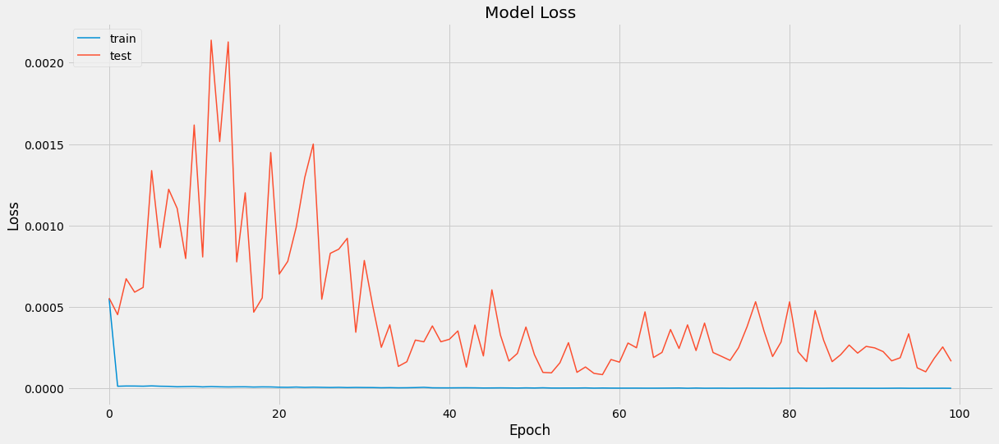

In [27]:
#Plotting loss, it shows that loss has decreased significantly and model trained well
print(history.history.keys())
plt.figure(figsize=(18,8))
plt.plot(history.history['loss'], linewidth=1.5)
plt.plot(history.history['val_loss'], linewidth=1.5)
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# 4. Evaluation

Evaluate our trained LSTM model with the test set and then apply the root mean square error (RMSE) metric to examine the performance of the model.

## 4.1 Model Accuracy

- Apply the model to predict the stock prices based on the Test set.

- Use the inverse_transform method to denormalize the predicted stock prices to original form.

In [28]:
#Do the prediction and check performance metrics
train_predict=model.predict(X_train)
test_predict=model.predict(X_test)

In [29]:
#Transformback to original form
train_predict=scaler.inverse_transform(train_predict) #Ouput of train dataset
test_predict=scaler.inverse_transform(test_predict) #Ouput of test dataset

In [30]:
#Transform y train and y test to ori form
y_trainOri=scaler.inverse_transform(y_train.reshape(-1,1))
y_testOri=scaler.inverse_transform(ytest.reshape(-1,1))

#### i - RMSE Performance 

Apply the RMSE formula to calculate the degree of discrepancy between the predicted prices and real prices (y_test) and display the result.

In [31]:
# Calculate RMSE performance metrics
training_performance_RMSE=math.sqrt(mean_squared_error(y_trainOri,train_predict)) #Train
testing_performance_RMSE=math.sqrt(mean_squared_error(y_testOri,test_predict)) #Test
print(f'Training Performance for RMSE is >> {training_performance_RMSE:.4f}')
print(f'Testing Performance for RMSE is  >> {testing_performance_RMSE:.4f}')

Training Performance for RMSE is >> 0.2167
Testing Performance for RMSE is  >> 2.3747


#### ii - MAPE Performance 

In [32]:
training_performance_MAPE= np.mean(np.abs((train_predict - y_trainOri)/train_predict))*100
testing_performance_MAPE= np.mean(np.abs((test_predict - y_testOri)/test_predict))*100
print(f'Training Performance for MAPE is >> {training_performance_MAPE:.4f}')
print(f'Testing Performance for MAPE is  >> {testing_performance_MAPE:.4f}')

Training Performance for MAPE is >> 1.7414
Testing Performance for MAPE is  >> 1.2100


## 4.2 Visualizing the Predicted Average Prices

Based on the graph below,it is apparently that the line follow the real stock prices closely. As a result, we can say that the LSTM works very well with time series or sequential data.

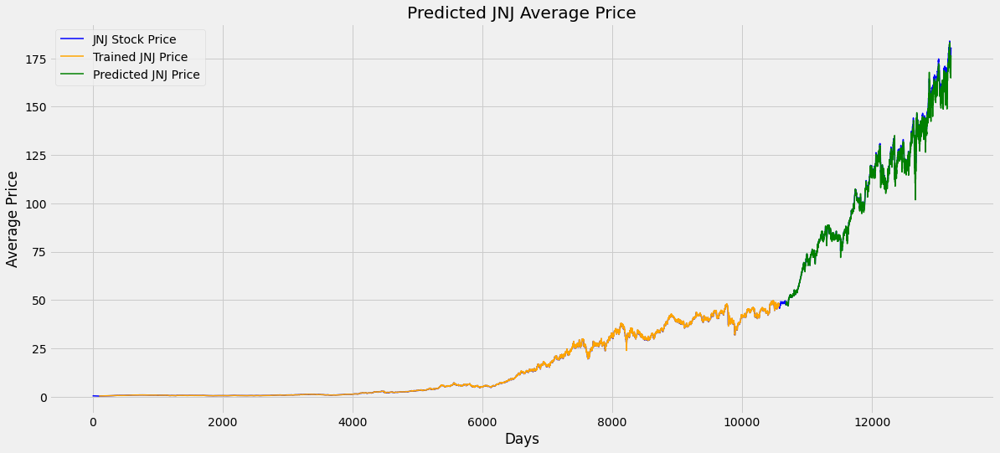

In [35]:
### Plotting 
# shift train predictions for plotting
look_back=100
trainPredictPlot = np.empty_like(JNJ_full_ds)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(train_predict)+look_back, :] = train_predict

# shift test predictions for plotting
testPredictPlot = np.empty_like(JNJ_full_ds)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(train_predict)+(look_back*2)+1:len(JNJ_full_ds)-1, :] = test_predict

# plot baseline and predictions
plt.figure(figsize=(18,8))
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title('Predicted JNJ Average Price')
plt.plot(scaler.inverse_transform(JNJ_full_ds),color = 'blue',label = 'JNJ Stock Price',linewidth=1.5)
plt.plot(trainPredictPlot, color = 'orange', label = 'Trained JNJ Price',linewidth=1.5 )
plt.plot(testPredictPlot, color = 'green', label = 'Predicted JNJ Price',linewidth=1.5 )
plt.legend()
plt.show()

In [36]:
len(test_data) #Based on 100 previous days

2644

In [37]:
#Test data from 2644-100(Prev 100days),so it starts from 2544 day
x_input=test_data[2544:].reshape(1,-1)
x_input.shape

(1, 100)

In [38]:
#Creating list of last 100 data
temp_input=list(x_input)
temp_input=temp_input[0].tolist()

In [39]:
print(len(test_data[2544:]))

100


In [40]:
print(len(temp_input))

100


In [41]:
actual=JNJ_full_ds[training_size+101:len(JNJ_full_ds),:1]
actual=scaler.inverse_transform(actual)

predict=test_predict

In [42]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(2543):
    print(f'{actual[i]}  \t\t {predict[i]} ')

   Actual                    Predicted
------------------------------------------------
[47.6947855]  		 [47.697147] 
[47.64972234]  		 [47.46894] 
[47.76423695]  		 [47.94666] 
[48.20345602]  		 [47.69267] 
[48.5000096]  		 [47.95805] 
[48.72714]  		 [48.43454] 
[48.83601347]  		 [48.656536] 
[48.85665678]  		 [48.893612] 
[48.92798052]  		 [48.961636] 
[49.05185431]  		 [48.980087] 
[48.794716]  		 [49.08005] 
[48.59763042]  		 [49.212986] 
[48.6501825]  		 [48.81545] 
[48.42681486]  		 [48.709652] 
[48.54506512]  		 [48.808567] 
[48.42493263]  		 [48.45866] 
[47.98008127]  		 [48.75195] 
[47.83743233]  		 [48.455936] 
[47.84119194]  		 [47.9711] 
[47.81489772]  		 [47.966293] 
[47.71730799]  		 [47.9609] 
[47.64034463]  		 [47.92268] 
[47.68540161]  		 [47.800686] 
[47.54461701]  		 [47.741848] 
[47.78572303]  		 [47.822254] 
[47.50712662]  		 [47.60172] 
[47.50711082]  		 [48.01512] 
[47.18303079]  		 [47.474007] 
[47.34601798]  		 [47.701458] 
[46.97264665]  		 [47.159687] 
[47.13

[104.88907793]  		 [104.527855] 
[104.86345414]  		 [104.48512] 
[104.86347023]  		 [104.61361] 
[105.16864434]  		 [104.38896] 
[105.37564347]  		 [104.43599] 
[104.95310035]  		 [104.90861] 
[106.51522321]  		 [104.9051] 
[107.149036]  		 [104.017296] 
[106.91430418]  		 [107.454254] 
[106.73504124]  		 [106.37088] 
[106.53869884]  		 [106.34937] 
[106.80546826]  		 [106.06042] 
[106.58350365]  		 [105.86355] 
[106.45760762]  		 [106.49656] 
[106.53870826]  		 [105.61922] 
[107.02742012]  		 [105.88371] 
[106.89083264]  		 [105.90014] 
[106.18870034]  		 [106.76813] 
[105.87714562]  		 [105.89891] 
[106.01158732]  		 [105.07567] 
[105.6424086]  		 [105.128265] 
[105.56557548]  		 [105.43312] 
[105.41617337]  		 [104.534966] 
[105.68505851]  		 [104.98229] 
[105.29666654]  		 [104.48795] 
[104.77810414]  		 [105.31832] 
[103.46351804]  		 [104.08592] 
[103.07299199]  		 [103.90496] 
[103.11353561]  		 [101.64943] 
[102.93350817]  		 [102.56514] 
[102.66282907]  		 [102.26536] 
[102.70

[132.54748142]  		 [132.82968] 
[133.34706382]  		 [123.5759] 
[132.3092175]  		 [135.243] 
[129.10606979]  		 [129.10947] 
[131.56859935]  		 [130.3058] 
[127.40538076]  		 [123.49139] 
[120.52727679]  		 [134.2744] 
[123.40495385]  		 [118.02987] 
[119.56256151]  		 [114.99566] 
[124.94757588]  		 [126.101395] 
[125.09853013]  		 [110.34705] 
[123.40495608]  		 [132.14159] 
[116.11879074]  		 [118.22812] 
[107.52586673]  		 [122.82225] 
[111.20314606]  		 [105.8821] 
[112.97693297]  		 [101.79816] 
[116.6683776]  		 [114.69983] 
[116.28861223]  		 [109.649185] 
[123.35305329]  		 [119.18302] 
[125.457085]  		 [112.35625] 
[120.82448024]  		 [129.449] 
[123.47807647]  		 [122.70525] 
[125.70235339]  		 [116.53045] 
[130.50479638]  		 [127.26001] 
[131.29497105]  		 [124.566864] 
[132.66539802]  		 [134.37273] 
[134.67030244]  		 [128.95778] 
[131.87759393]  		 [134.21466] 
[137.49611056]  		 [134.66455] 
[137.90654392]  		 [127.32247] 
[140.36905373]  		 [144.14673] 
[142.91887731]  	

# 5. Advanced Analysis

#### Predict for the next 30 days price and compare to the actual 30 days price

In [43]:
#Once get the output will append to the list,then we'll taking the last 100 values to cal next value
lst_output=[] #Predict next 30 days output value
n_steps=100
i=0
while(i<30):
    if(len(temp_input)>100):
        #Shift one position to right and taking new output then putting as input
        x_input=np.array(temp_input[1:]) 
        print("{} day input {}".format(i,x_input))
        x_input=x_input.reshape(1,-1)
        x_input = x_input.reshape((1, n_steps, 1))
        #print(x_input)
        yhat = model.predict(x_input, verbose=0)
        print("{} day output {}".format(i,yhat))
        temp_input.extend(yhat[0].tolist())
        temp_input=temp_input[1:]
        #print(temp_input)
        lst_output.extend(yhat.tolist())
        i=i+1
    else:
        x_input = x_input.reshape((1, n_steps,1)) #reshape
        yhat = model.predict(x_input, verbose=0) #reshape
        print(yhat[0]) #Output
        temp_input.extend(yhat[0].tolist()) #Append to input list
        #print(len(temp_input))
        lst_output.extend(yhat.tolist()) #Add into final output
        i=i+1
    

print(lst_output)

[0.9521468]
1 day input [0.92478936 0.92179296 0.92684516 0.92925042 0.92267981 0.90935045
 0.90776493 0.90189302 0.89606147 0.89725738 0.89256792 0.89013589
 0.87116308 0.8853792  0.90068374 0.91347556 0.91737219 0.92199453
 0.9176947  0.91907868 0.92528651 0.91997898 0.91795001 0.91907871
 0.92175269 0.91382497 0.90491636 0.89224545 0.89555087 0.89514784
 0.89315914 0.886555   0.87607465 0.87246401 0.85562782 0.88121345
 0.88433724 0.88325543 0.89396567 0.90575778 0.90980122 0.91948369
 0.92137694 0.91475063 0.9133442  0.91673855 0.9273947  0.94321671
 0.94450141 0.94931562 0.94857183 0.94785507 0.94669212 0.94410918
 0.94498818 0.95266927 0.95737535 0.96217599 0.96624643 0.96413688
 0.95772693 0.95650989 0.95874117 0.97607768 0.98117589 0.98179793
 0.98121644 0.96968126 0.97310261 0.97362999 0.96482656 0.98534104
 0.98893818 0.99214314 0.98378585 0.99541573 1.         0.98968197
 0.98864068 0.97995884 0.96892405 0.96601655 0.96682794 0.96028276
 0.94934257 0.95321023 0.96006637 0.95

8 day output [[0.31739908]]
9 day input [0.89606147 0.89725738 0.89256792 0.89013589 0.87116308 0.8853792
 0.90068374 0.91347556 0.91737219 0.92199453 0.9176947  0.91907868
 0.92528651 0.91997898 0.91795001 0.91907871 0.92175269 0.91382497
 0.90491636 0.89224545 0.89555087 0.89514784 0.89315914 0.886555
 0.87607465 0.87246401 0.85562782 0.88121345 0.88433724 0.88325543
 0.89396567 0.90575778 0.90980122 0.91948369 0.92137694 0.91475063
 0.9133442  0.91673855 0.9273947  0.94321671 0.94450141 0.94931562
 0.94857183 0.94785507 0.94669212 0.94410918 0.94498818 0.95266927
 0.95737535 0.96217599 0.96624643 0.96413688 0.95772693 0.95650989
 0.95874117 0.97607768 0.98117589 0.98179793 0.98121644 0.96968126
 0.97310261 0.97362999 0.96482656 0.98534104 0.98893818 0.99214314
 0.98378585 0.99541573 1.         0.98968197 0.98864068 0.97995884
 0.96892405 0.96601655 0.96682794 0.96028276 0.94934257 0.95321023
 0.96006637 0.95369709 0.9546572  0.9590387  0.95902516 0.96389342
 0.95719955 0.93998465 0.

16 day output [[0.15795772]]
17 day input [0.91737219 0.92199453 0.9176947  0.91907868 0.92528651 0.91997898
 0.91795001 0.91907871 0.92175269 0.91382497 0.90491636 0.89224545
 0.89555087 0.89514784 0.89315914 0.886555   0.87607465 0.87246401
 0.85562782 0.88121345 0.88433724 0.88325543 0.89396567 0.90575778
 0.90980122 0.91948369 0.92137694 0.91475063 0.9133442  0.91673855
 0.9273947  0.94321671 0.94450141 0.94931562 0.94857183 0.94785507
 0.94669212 0.94410918 0.94498818 0.95266927 0.95737535 0.96217599
 0.96624643 0.96413688 0.95772693 0.95650989 0.95874117 0.97607768
 0.98117589 0.98179793 0.98121644 0.96968126 0.97310261 0.97362999
 0.96482656 0.98534104 0.98893818 0.99214314 0.98378585 0.99541573
 1.         0.98968197 0.98864068 0.97995884 0.96892405 0.96601655
 0.96682794 0.96028276 0.94934257 0.95321023 0.96006637 0.95369709
 0.9546572  0.9590387  0.95902516 0.96389342 0.95719955 0.93998465
 0.94930204 0.97091312 0.98052175 0.9795282  0.97857553 0.95214683
 0.88437861 0.783671

24 day output [[0.14137426]]
25 day input [0.92175269 0.91382497 0.90491636 0.89224545 0.89555087 0.89514784
 0.89315914 0.886555   0.87607465 0.87246401 0.85562782 0.88121345
 0.88433724 0.88325543 0.89396567 0.90575778 0.90980122 0.91948369
 0.92137694 0.91475063 0.9133442  0.91673855 0.9273947  0.94321671
 0.94450141 0.94931562 0.94857183 0.94785507 0.94669212 0.94410918
 0.94498818 0.95266927 0.95737535 0.96217599 0.96624643 0.96413688
 0.95772693 0.95650989 0.95874117 0.97607768 0.98117589 0.98179793
 0.98121644 0.96968126 0.97310261 0.97362999 0.96482656 0.98534104
 0.98893818 0.99214314 0.98378585 0.99541573 1.         0.98968197
 0.98864068 0.97995884 0.96892405 0.96601655 0.96682794 0.96028276
 0.94934257 0.95321023 0.96006637 0.95369709 0.9546572  0.9590387
 0.95902516 0.96389342 0.95719955 0.93998465 0.94930204 0.97091312
 0.98052175 0.9795282  0.97857553 0.95214683 0.88437861 0.78367156
 0.67294842 0.56881487 0.48269349 0.41604388 0.36198133 0.31739908
 0.28052315 0.2499243

In [44]:
day_new=np.arange(1,101)
day_pred=np.arange(101,131) #30days need to predict

### 5.1 Visualizing Testing Data

In [45]:
len(JNJ_full_ds)

13219

In [46]:
scaler.inverse_transform(lst_output)

array([[175.16034218],
       [162.71206872],
       [144.2132942 ],
       [123.87467564],
       [104.74649232],
       [ 88.92694513],
       [ 76.68414621],
       [ 66.75345324],
       [ 58.56418631],
       [ 51.79048427],
       [ 46.16982432],
       [ 41.5352878 ],
       [ 37.79356154],
       [ 34.82681547],
       [ 32.49933754],
       [ 30.68082706],
       [ 29.27656671],
       [ 28.18301995],
       [ 27.32496091],
       [ 26.64896258],
       [ 26.27356397],
       [ 26.12129471],
       [ 26.0926255 ],
       [ 26.13957359],
       [ 26.23036855],
       [ 26.34419687],
       [ 26.46556338],
       [ 26.58553941],
       [ 26.6985411 ],
       [ 26.80142618]])

In [47]:
JNJ_full_ds3=JNJ_full_ds.tolist()
len(JNJ_full_ds3)

13219

In [48]:
print(type(JNJ_full_ds3))

<class 'list'>


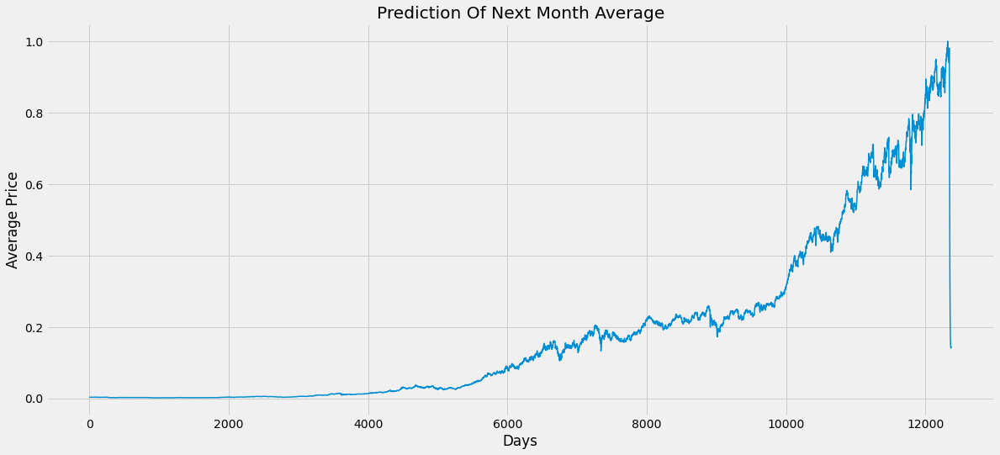

In [49]:
#Fill the upper gap
plt.figure(figsize=(18,8))
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title("Prediction Of Next Month Average")
JNJ_full_ds3.extend(lst_output)
#PLot only 137 days because 1007-907(starting rows)+30days
plt.plot(JNJ_full_ds3[877:],linewidth=1.5)

In [50]:
#Creating final data for plotting
final_graph = scaler.inverse_transform(JNJ_full_ds3).tolist()

In [51]:
JNJ_full_ds_Ori=df.reset_index()['Average'] 

scaler=MinMaxScaler(feature_range=(0,1))
JNJ_full_ds_Ori=scaler.fit_transform(np.array(JNJ_full_ds_Ori).reshape(-1,1)) #Fit to data, then transform it

In [52]:
print(final_graph[len(final_graph)-1])
print(scaler.inverse_transform(JNJ_full_ds_Ori)[-1:])

[26.80142618054893]
[[176.86999893]]


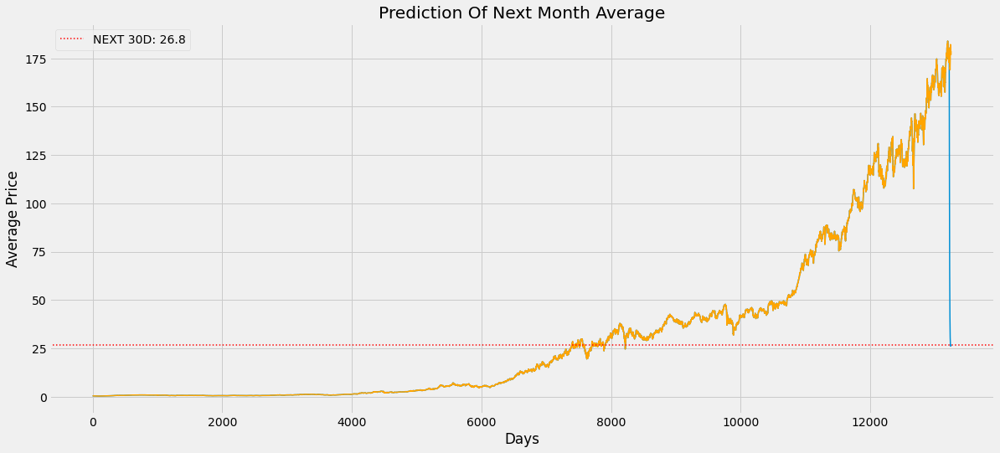

In [53]:
#Plotting final results with predicted value after 30 Days
plt.figure(figsize=(18,8))
plt.plot(final_graph,linewidth=1.5)
plt.plot(scaler.inverse_transform(JNJ_full_ds_Ori),linewidth=1.5,color='orange')
plt.ylabel("Average Price")
plt.xlabel("Days")
plt.title("Prediction Of Next Month Average")
plt.axhline(y=final_graph[len(final_graph)-1], color = 'red', linestyle = ':', label = 'NEXT 30D: {0}'.format(round(float(*final_graph[len(final_graph)-1]),2)),linewidth=1.5)
plt.legend()

#### Average Price Comparison Between Predicted and Actual 30 Days Average Price

In [54]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(30):
    print(f'{JNJ_full_ds1_Future[i]}  \t\t {lst_output[i]} ')

   Actual                    Predicted
------------------------------------------------
[0.97882048]  		 [0.9521468281745911] 
[0.96857218]  		 [0.8843786120414734] 
[0.96840887]  		 [0.7836715579032898] 
[0.96119558]  		 [0.67294842004776] 
[0.9625838]  		 [0.5688148736953735] 
[0.96231161]  		 [0.48269349336624146] 
[0.96627209]  		 [0.41604387760162354] 
[0.96710232]  		 [0.3619813323020935] 
[0.95564273]  		 [0.3173990845680237] 
[0.93672487]  		 [0.2805231511592865] 
[0.92843641]  		 [0.24992436170578003] 
[0.92081482]  		 [0.22469401359558105] 
[0.92365932]  		 [0.20432411134243011] 
[0.91874612]  		 [0.18817318975925446] 
[0.92613635]  		 [0.17550243437290192] 
[0.93382595]  		 [0.16560249030590057] 
[0.9476673]  		 [0.15795771777629852] 
[0.9689669]  		 [0.15200446546077728] 
[0.98608819]  		 [0.14733320474624634] 
[0.99021203]  		 [0.14365307986736298] 
[0.97630265]  		 [0.14160941541194916] 
[0.96344124]  		 [0.1407804638147354] 
[0.96173997]  		 [0.14062438905239105] 
[0.969

In [55]:
print('   Actual                    Predicted')
print('------------------------------------------------')
for i in range(30):
    print(f'{scaler.inverse_transform(JNJ_full_ds1_Future)[i]}  \t\t {scaler.inverse_transform(lst_output)[i]} ')

   Actual                    Predicted
------------------------------------------------
[180.05999756]  		 [175.16034218] 
[178.17749786]  		 [162.71206872] 
[178.14749908]  		 [144.2132942] 
[176.82249832]  		 [123.87467564] 
[177.07749939]  		 [104.74649232] 
[177.02750015]  		 [88.92694513] 
[177.75499725]  		 [76.68414621] 
[177.90750122]  		 [66.75345324] 
[175.80250168]  		 [58.56418631] 
[172.32749939]  		 [51.79048427] 
[170.80500031]  		 [46.16982432] 
[169.40499878]  		 [41.5352878] 
[169.92750168]  		 [37.79356154] 
[169.02500153]  		 [34.82681547] 
[170.38250351]  		 [32.49933754] 
[171.79499817]  		 [30.68082706] 
[174.33750153]  		 [29.27656671] 
[178.25000381]  		 [28.18301995] 
[181.39499664]  		 [27.32496091] 
[182.15250015]  		 [26.64896258] 
[179.59749985]  		 [26.27356397] 
[177.23500061]  		 [26.12129471] 
[176.9224968]  		 [26.0926255] 
[178.34500122]  		 [26.13957359] 
[177.67750168]  		 [26.23036855] 
[178.30500412]  		 [26.34419687] 
[178.24749756]  		 [26.4655